In [1]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.morphology import (ball)
from quantimpy import morphology as mp
from quantimpy import minkowski as mk
from dataclasses import dataclass, field

import cv2 as cv
import os
import argparse
import math
import time
import zlib
import base64
import io 
import datetime

from tkinter import *
from tkinter import Label, Tk, Button,ttk
from PIL import ImageTk,Image

from joblib import Parallel, delayed
import pandas as pd
import random
import warnings
import random

np.seterr(divide='ignore', invalid='ignore')

class RockData(object):
    def __init__(self, id, path, path_mask,list2,img_num,level_num,level_map):
        self.id = id
        self.path = path
        self.path_mask = path_mask
        self.list2 = list2
        self.img_num = img_num
        self.level_num = level_num
        self.level_map = level_map

    def level_update(self,level_num,level_map):
        self.level_num = level_num
        self.level_map = level_map 

class RockGraf(object):
    def __init__(self, id, volume, surface, curvature, euler, dist):
        self.id = id
        self.volume = volume
        self.surface = surface
        self.curvature = curvature
        self.euler = euler
        self.dist = dist

id =  2
Image count =  1851


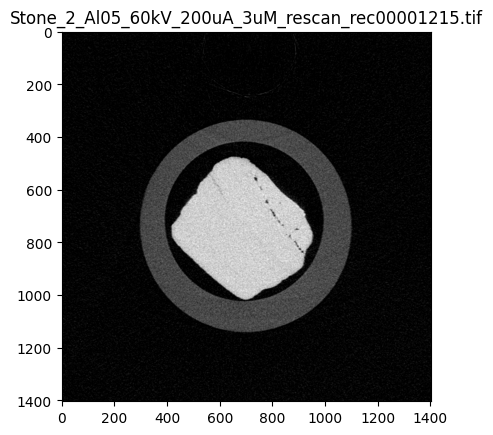

id =  9
Image count =  2432


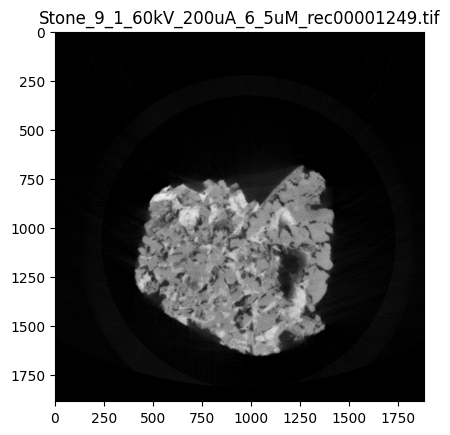

id =  10
Image count =  2223


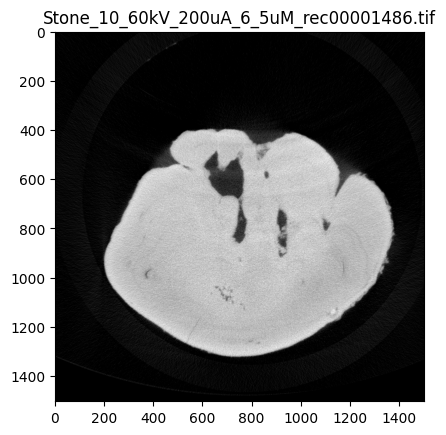

id =  11
Image count =  1769


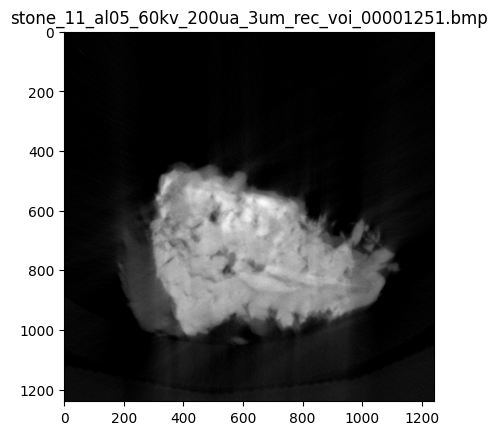

id =  12
Image count =  1803


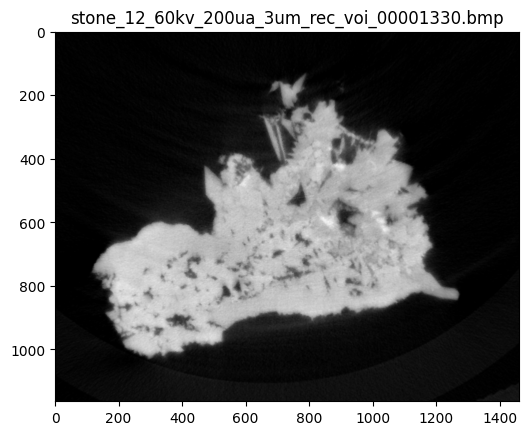

id =  13
Image count =  2350


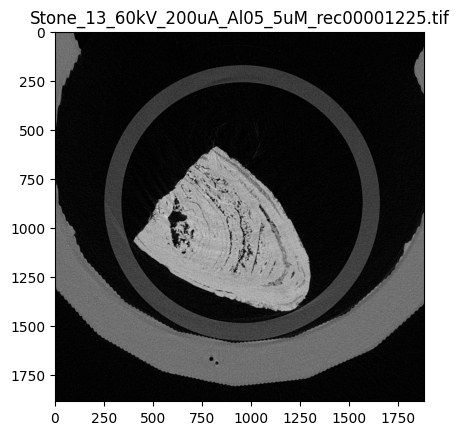

id =  16
Image count =  1896


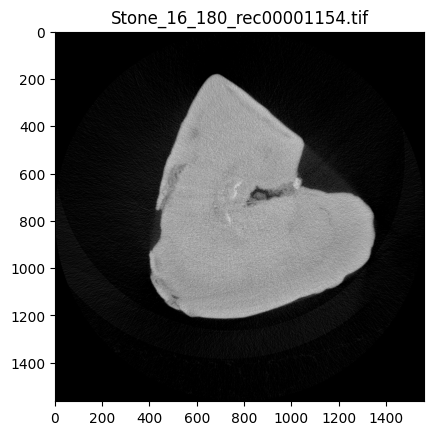

id =  18
Image count =  2385


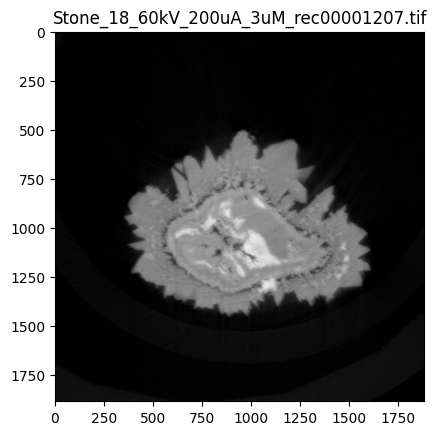

id =  19
Image count =  1900


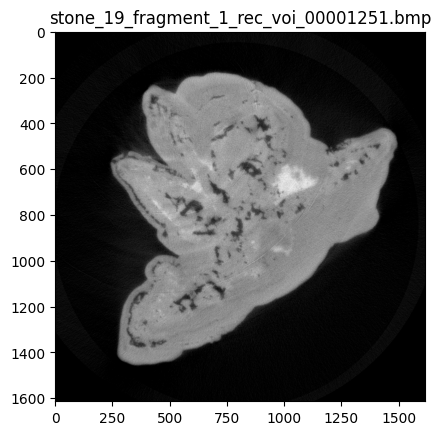

id =  20
Image count =  1911


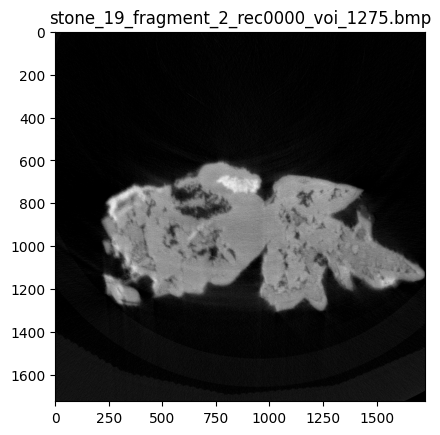

id =  25
Image count =  1626


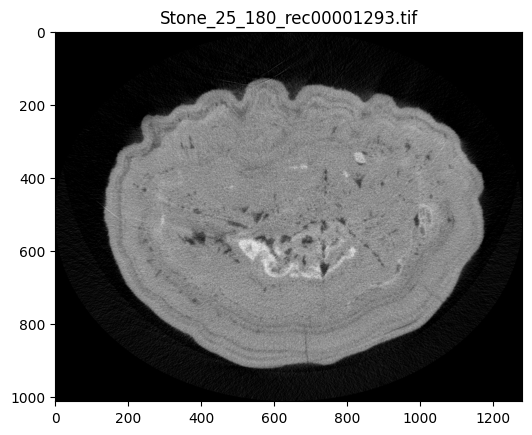

id =  27
Image count =  2271


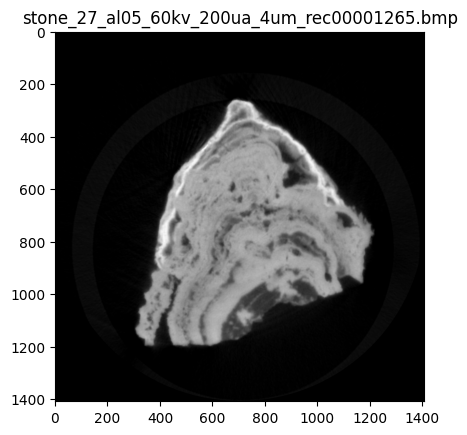

id =  28
Image count =  2213


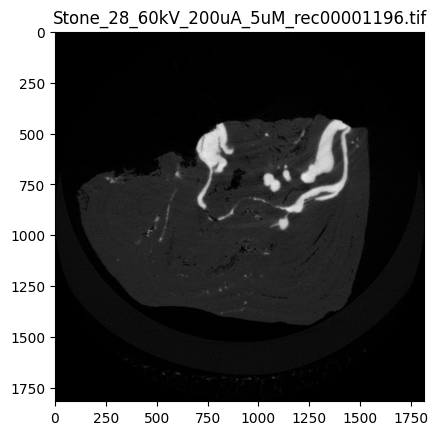

id =  30
Image count =  1945


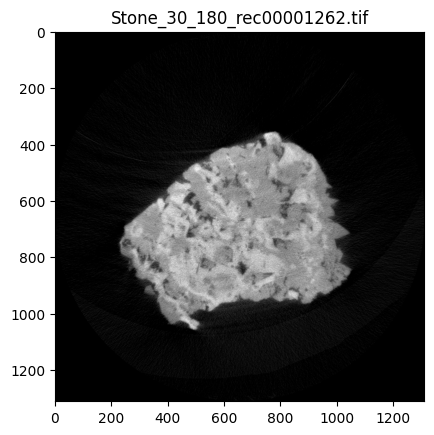

id =  31
Image count =  1608


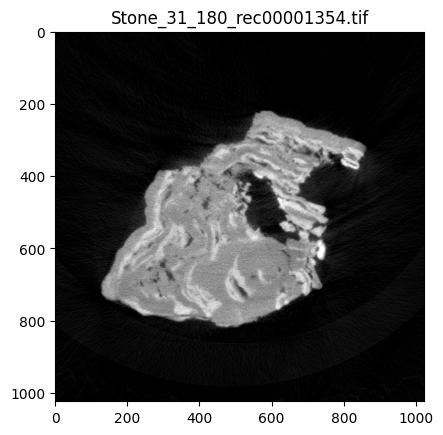

id =  32
Image count =  2608


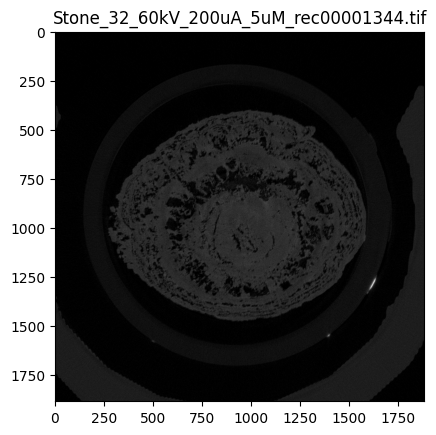

id =  33
Image count =  1912


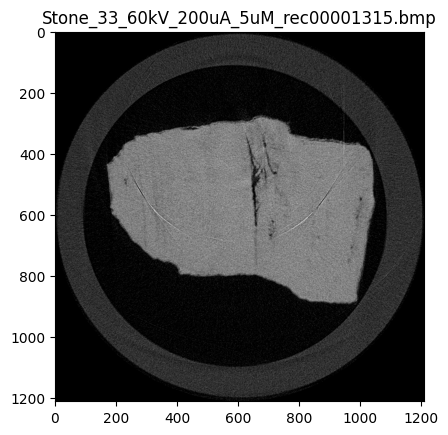

id =  34
Image count =  1562


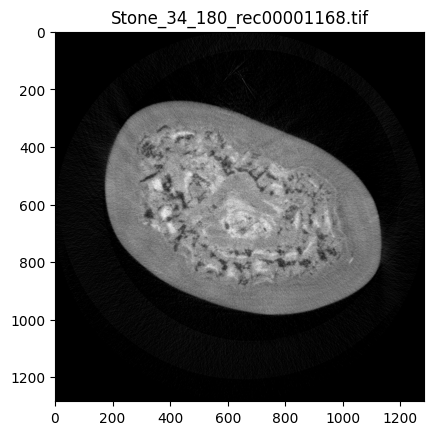

id =  35
Image count =  2368


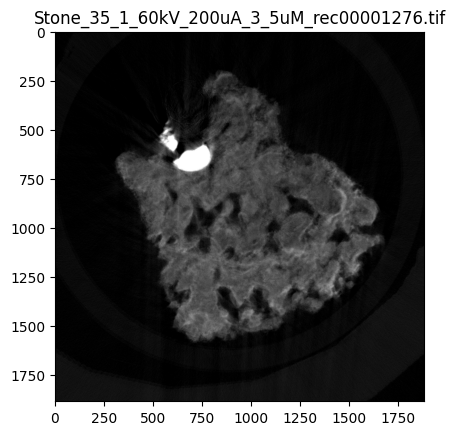

id =  36
Image count =  1277


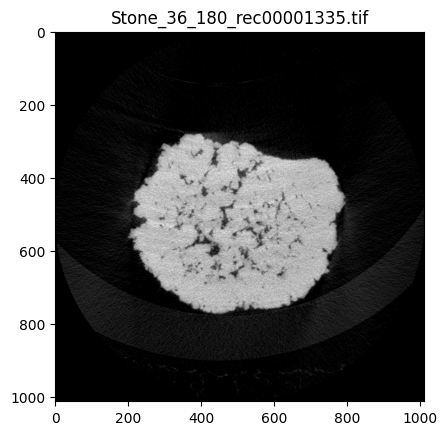

id =  37
Image count =  1846


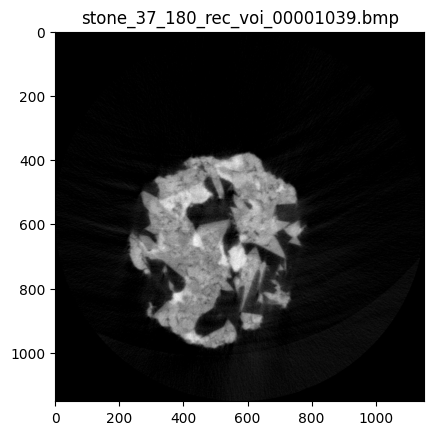

id =  40
Image count =  2234


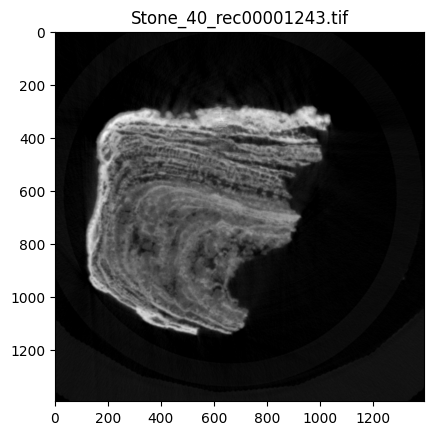

id =  43
Image count =  1145


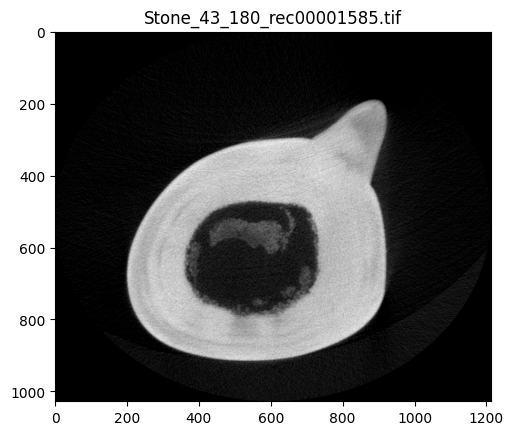

id =  50
Image count =  1435


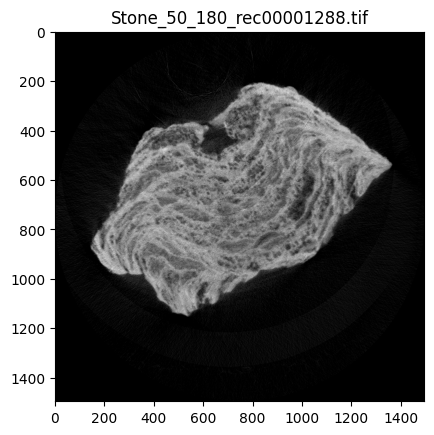

id =  51
Image count =  904


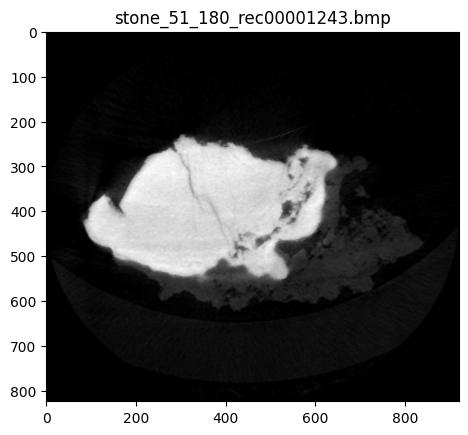

id =  52
Image count =  1265


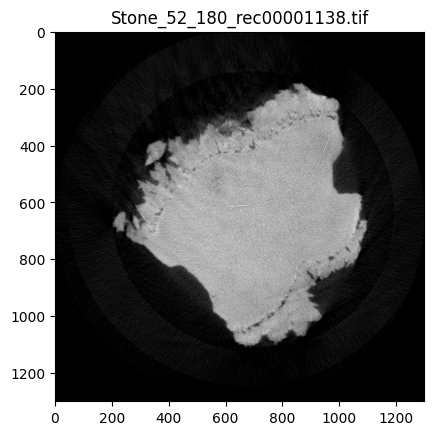

id =  82
Image count =  1727


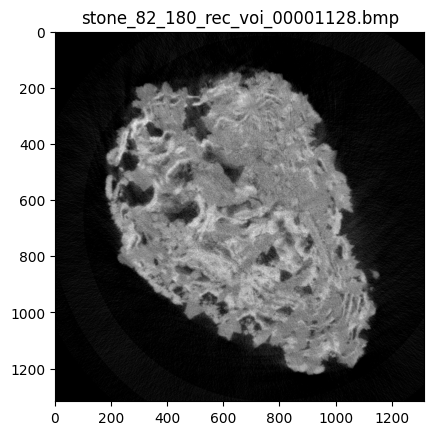

id =  153
Image count =  1017


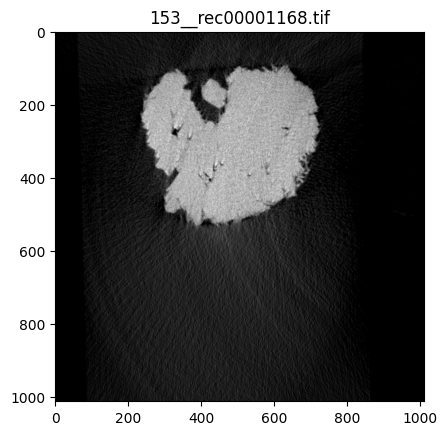

id =  155
Image count =  1695


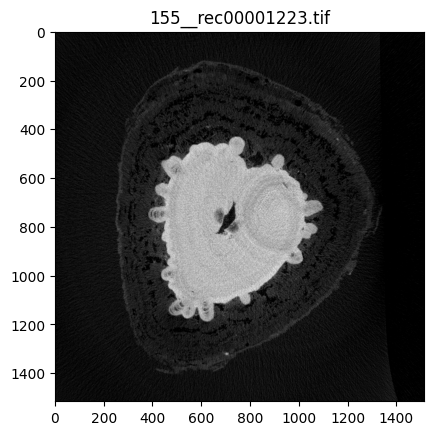

id =  1001
Image count =  2244


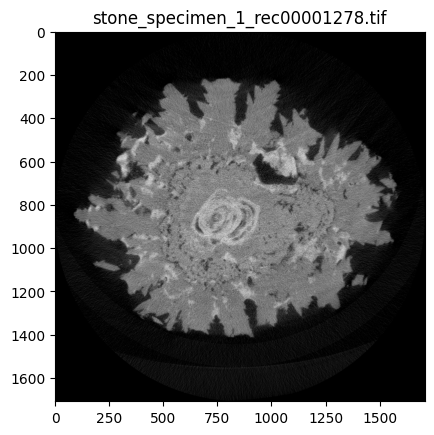

id =  1002
Image count =  2016


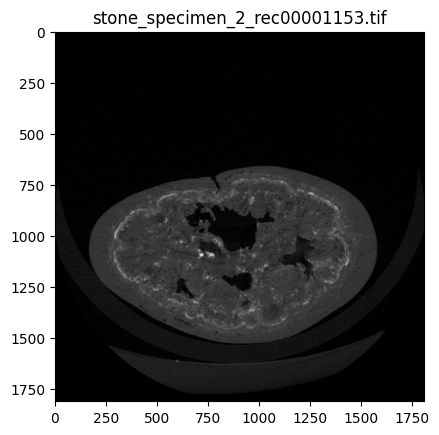

In [2]:
#Выбор камней

id_rock = [2, 9, 10, 11, 12, 13, 16, 18, 19, 20, 25, 27, 28, 30, 31, 32, 33, 34, 35, 36, 37, 40, 43, 50, 51, 52, 82, 153, 155, 1001, 1002] #9, 10, 16, 18, 19(19_1), 20(19_2), 25, 27, 30, 31, 34, 37, 50, 52, 82, 101(N1)
          #0  1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17  18  19  20  21  22  23  24  25  26   27   28    29    30
#9, 10, 11, 12, 16, 18, 19, 20, 25, 27, 28, 30, 31, 32, 34, 35, 37, 40, 43, 50, 51, 52, 82, 101
#9, 16, 18, 19, 20, 25, 27, 30, 31, 34, 37, 50, 52, 82, 101
#id = 2     /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Uric acid/Pure uric acid/Stone 2/
#id = 9     /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Calcium/Stone 9/
#id = 10    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Calcium/Stone 10/
#id = 11    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Unclass/Stone 11/
#id = 12    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Unclass/Stone 12/
#id = 13    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Uric acid/Pure uric acid/Stone 13/
#id = 16    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Calcium/Stone 16/
#id = 18    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Calcium/Stone 18/
#id = 19    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Unclass/Stone 19_1/
#id = 20    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Unclass/Stone 19_2/
#id = 25    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Calcium/Stone 25/
#id = 27    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Unclass/Stone 27/
#id = 28    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Uric acid/Uric acid with calcium/Stone 28/
#id = 30    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Calcium/Stone 30/
#id = 31    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Calcium/Stone 31/
#id = 32    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Uric acid/Uric acid with calcium/Stone 32/
#id = 33    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Uric acid/Pure uric acid/Stone 33/
#id = 34    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Calcium/Stone 34/
#id = 35    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Unclass/Stone 35/
#id = 36    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Cystine/Stone 36/
#id = 37    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Unclass/Stone 37/
#id = 40    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Unclass/Stone 40/
#id = 43    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Calcium/Stone 43/
#id = 50    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Calcium/Stone 50/
#id = 51    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Unclass/Stone 51/
#id = 52    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Calcium/Stone 52/
#id = 82    /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Unclass/Stone 82/
#id = 153   /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Cystine/Stone 153/
#id = 155   /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Uric acid/Uric acid with calcium/Stone 155/
#id = 1001  /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Calcium/N1/
#id = 1002  /home/pc-burevestnik/PochRock_v2/Rock_Base_1/Uric acid/Uric acid with calcium/Stone N2/

#Созданние массива информации о камнях

#Data_about_rocks_p = RockData(0, '0', '0', [0], 0, 0, [0]) 

#Data_about_rocks = RockList(np.zeros(len(id_rock),dtype=RockData))

my_Rocks = []

for i in range(len(id_rock)):
    #Составление списков изображений

    if id_rock[i] == 2:
        file_name = 'Rock_Base_1/Uric acid/Pure uric acid/Stone 2/'
    if id_rock[i] == 9:
        file_name = 'Rock_Base_1/Calcium/Stone 9/'
    if id_rock[i] == 10:
        file_name = 'Rock_Base_1/Calcium/Stone 10/'
    if id_rock[i] == 11:
        file_name = 'Rock_Base_1/Unclass/Stone 11/'
    if id_rock[i] == 12:
        file_name = 'Rock_Base_1/Unclass/Stone 12/'
    if id_rock[i] == 13:
        file_name = 'Rock_Base_1/Uric acid/Pure uric acid/Stone 13/' 
    if id_rock[i] == 16:
        file_name = 'Rock_Base_1/Calcium/Stone 16/'
    if id_rock[i] == 18:
        file_name = 'Rock_Base_1/Calcium/Stone 18/'
    if id_rock[i] == 19:
        file_name = 'Rock_Base_1/Unclass/Stone 19_1/'
    if id_rock[i] == 20:
        file_name = 'Rock_Base_1/Unclass/Stone 19_2/'
    if id_rock[i] == 25:
        file_name = 'Rock_Base_1/Calcium/Stone 25/'
    if id_rock[i] == 27:
        file_name = 'Rock_Base_1/Unclass/Stone 27/'
    if id_rock[i] == 28:
        file_name = 'Rock_Base_1/Uric acid/Uric acid with calcium/Stone 28/'
    if id_rock[i] == 30:
        file_name = 'Rock_Base_1/Calcium/Stone 30/'
    if id_rock[i] == 31:
        file_name = 'Rock_Base_1/Calcium/Stone 31/'
    if id_rock[i] == 32:
        file_name = 'Rock_Base_1/Uric acid/Uric acid with calcium/Stone 32/'
    if id_rock[i] == 33:
        file_name = 'Rock_Base_1/Uric acid/Pure uric acid/Stone 33/'
    if id_rock[i] == 34:
        file_name = 'Rock_Base_1/Calcium/Stone 34/'
    if id_rock[i] == 35:
        file_name = 'Rock_Base_1/Unclass/Stone 35/'
    if id_rock[i] == 36:
        file_name = 'Rock_Base_1/Cystine/Stone 36/'
    if id_rock[i] == 37:
        file_name = 'Rock_Base_1/Unclass/Stone 37/'
    if id_rock[i] == 40:
        file_name = 'Rock_Base_1/Unclass/Stone 40/'
    if id_rock[i] == 43:
        file_name = 'Rock_Base_1/Calcium/Stone 43/'
    if id_rock[i] == 50:
        file_name = 'Rock_Base_1/Calcium/Stone 50/'
    if id_rock[i] == 51:
        file_name = 'Rock_Base_1/Unclass/Stone 51/'
    if id_rock[i] == 52:
        file_name = 'Rock_Base_1/Calcium/Stone 52/'
    if id_rock[i] == 82:
        file_name = 'Rock_Base_1/Unclass/Stone 82/'
    if id_rock[i] == 153:
        file_name = 'Rock_Base_1/Cystine/Stone 153/'
    if id_rock[i] == 155:
        file_name = 'Rock_Base_1/Uric acid/Uric acid with calcium/Stone 155/'
    if id_rock[i] == 1001:
        file_name = 'Rock_Base_1/Calcium/Stone N1/'
    if id_rock[i] == 1002:
        file_name = 'Rock_Base_1/Uric acid/Uric acid with calcium/Stone N2/'

    id = id_rock[i]
    path = '/home/pc-burevestnik/PochRock_v2/' + file_name

    myList = os.listdir(path)
    list2 = []
    for _, imgs in enumerate(myList):
        img_name = imgs.split(".")
        #print(img_name)
        if len(img_name) > 1:
            if img_name[1] == "tif" or img_name[1] == "bmp":
                list2.append(imgs)

    list2.sort()
    #print(list2)

    #Data_about_rocks_p.list2 = list2
    img_num = len(list2)

    print('id = ', id_rock[i])
    print('Image count = ',len(list2))

    #вывод изображения

    #img= cv.imread(os.path.join(path,imgs),0)
    img = cv.imread(os.path.join(path,list2[int(len(list2)/2)]),0)

    # max = 0
    # for j in range(img.shape[0]):
    #     for k in range(img.shape[1]):
    #         if max < img[j,k]:
    #             max = img[j,k]

    #print(max)

    plt.gray()
    plt.title(list2[int(len(list2)/2)])
    plt.imshow(img[:,:])
    plt.show()

    #Data_about_rocks.Rocks[i].id = Data_about_rocks_p.id

    my_Rocks.append(RockData(id, path, path,list2,img_num,0,['0']))

    #print(my_Rocks[0].id)

# Фильтраци изображений от шума

In [25]:
def img_filter(my_Rocks, step):
    #print('Start')

    #Создание изменённого изображения

    img = cv.imread(os.path.join(my_Rocks.path, my_Rocks.list2[step]), cv.IMREAD_GRAYSCALE)
    h_img, w_img = img.shape

    # plt.gray()
    # plt.title('Original image. Rock ' + str(my_Rocks.id) + ' Step ' + str(step))
    # plt.imshow(img[:,:])
    # plt.show()

    for i in range(h_img):
        for j in range(w_img):
            img[i,j] = my_Rocks.level_map[min(254,img[i,j])]

    # plt.gray()
    # plt.title('Modified image')
    # plt.imshow(img[:,:])
    # plt.show()

    #Фильтр жизни

    red_pix = 1000
    l = 0

    while red_pix > 10:
        for i in range(h_img):
            for j in range(w_img):
                if i == 0:
                    img[i,j] = 0
                if i == h_img:
                    img[i,j] = 0
                if j == 0:
                    img[i,j] = 0
                if j == w_img:
                    img[i,j] = 0

        red_pix = 0

        for i in range(1, h_img - 1):
            for j in range(1, w_img - 1 ):
                sum_sosed = 0
                if img[i,j] != 0:
                    if img[i - 1, j - 1] != 0:
                        sum_sosed += 1
                    if img[i - 1, j] != 0:
                        sum_sosed += 1
                    if img[i - 1, j + 1] != 0:
                        sum_sosed += 1
                    if img[i, j - 1] != 0:
                        sum_sosed += 1
                    if img[i, j + 1] != 0:
                        sum_sosed += 1
                    if img[i + 1, j - 1] != 0:
                        sum_sosed += 1
                    if img[i + 1, j] != 0:
                        sum_sosed += 1
                    if img[i + 1, j + 1] != 0:
                        sum_sosed += 1
                    if sum_sosed < 4:
                        img[i,j] = 0
                        red_pix += 1

        l += 1 

        #print(red_pix)
    
    # plt.gray()
    # plt.title('Modified image with filter life, step = ' + str(l))
    # plt.imshow(img[:,:])
    # plt.show()

    img_mask = np.zeros([h_img,w_img],dtype=int)

    for i in range(h_img):
        for j in range(w_img):
            if img[i,j] == 0:
                img_mask[i,j] = 255
            else:
                img_mask[i,j] = 0

    # plt.gray()
    # plt.title('Mask')
    # plt.imshow(img_mask[:,:])
    # plt.show()
    
    #Удаление шумов.

    zone_num = 0 

    for i in range(h_img):
        for j in range(w_img):
            if img_mask[i,j] == 0:
                zone_num += 1
                if (zone_num ==255):
                    zone_num += 1
                #print('Find ' + str(zone_num) + ' zones start point: ', i, j)
                img_mask[i,j] = zone_num
                test_point = 2
                start_point = 0

                wave = np.zeros([h_img * w_img * 10, 3], dtype = int)
                wave[0, 0] = i + 1
                wave[0, 1] = j

                wave[1, 0] = i
                wave[1, 1] = j + 1

                while test_point - start_point > 0:
                    if img_mask[min(h_img - 1, wave[start_point, 0]), min(w_img - 1, wave[start_point, 1])] == 0:

                        img_mask[wave[start_point, 0],wave[start_point, 1]] = zone_num
                        #print('Find ' + str(zone_num) + ' zones point: ', wave[start_point, 0], wave[start_point, 1])

                        if img_mask[min(h_img - 1, wave[start_point, 0] - 1), min(w_img - 1, wave[start_point, 1])] == 0:
                            test_point += 1
                            wave[test_point, 0] = wave[start_point, 0] - 1
                            wave[test_point, 1] = wave[start_point, 1]

                        if img_mask[min(h_img - 1, wave[start_point, 0] + 1), min(w_img - 1, wave[start_point, 1])] == 0:
                            test_point += 1
                            wave[test_point, 0] = wave[start_point, 0] + 1
                            wave[test_point, 1] = wave[start_point, 1]

                        if img_mask[min(h_img - 1, wave[start_point, 0]), min(w_img - 1, wave[start_point, 1] - 1)] == 0:
                            test_point += 1
                            wave[test_point, 0] = wave[start_point, 0]
                            wave[test_point, 1] = wave[start_point, 1] - 1

                        if img_mask[min(h_img - 1, wave[start_point, 0]), min(w_img - 1, wave[start_point, 1] + 1)] == 0:
                            test_point += 1
                            wave[test_point, 0] = wave[start_point, 0]
                            wave[test_point, 1] = wave[start_point, 1] + 1

                    start_point += 1

                #print(zone_num, test_point)
                #wave[i,j,1]

    #print(max([zone_num+1, 256]))

    zone_mass = np.zeros(max(zone_num+1, 256), dtype = int) #max(zone_num+1, 256)

    for i in range(h_img):
        for j in range(w_img):
            zone_mass[img_mask[i,j]] += 1

    zone_mass[255] = 0

    zone_mass_value = sum(zone_mass)

    zone_mass_porog = zone_mass_value * 1 // 100

    for i in range(len(zone_mass)):
        if zone_mass[i] < zone_mass_porog:
            zone_mass[i] = 0

    for i in range(h_img):
        for j in range(w_img):
            if zone_mass[img_mask[i,j]] == 0:
                img_mask[i,j] = 255

    # plt.gray()
    # plt.title('Mask')
    # plt.imshow(img_mask[:,:])
    # plt.show()

    #print(zone_num)
    #print(np.count_nonzero(zone_mass))

    #удаление губчатых структур

    # zone_per = np.zeros(max(zone_num+1, 256), dtype = int)
    # per = np.zeros([h_img, w_img], dtype = int)

    # for i in range(1, h_img - 1):
    #         for j in range(1, w_img - 1):
    #             if zone_mass[img_mask[i,j]] != 255:
    #                 perimetr = 0
    #                 perimetr = min(1, 2 * zone_mass[img_mask[min(h_img,i + 1),j]]) + min(1, 2 * zone_mass[img_mask[max(0,i - 1),j]]) + min(1, 2 * zone_mass[img_mask[i,min(w_img,j + 1)]]) + min(1, 2 * zone_mass[img_mask[i,min(0, j - 1)]])
                    
    #                 if perimetr < 3:
    #                     zone_per[img_mask[i,j]] += 1
    #                     per[i,j] = perimetr * 50

    # #print(zone_num)
    # for i in range (zone_num):
    #     #if(zone_mass[i] != 0):
    #         #print(i, zone_mass[i], zone_per[i], zone_per[i]/zone_mass[i])
    #     if zone_per[i]/zone_mass[i] > 0.1:
    #         zone_mass[i] = 0

    # plt.gray()
    # plt.title('Perimetr')
    # plt.imshow(per[:,:])
    # plt.show()

    for i in range(h_img):
        for j in range(w_img):
            if zone_mass[img_mask[i,j]] == 0:
                img_mask[i,j] = 255

    # plt.gray()
    # plt.title('Mask')
    # plt.imshow(img_mask[:,:])
    # plt.show()

    #наложение маски

    for i in range(h_img):
        for j in range(w_img):
            if img_mask[i,j] != 255:
                img_mask[i,j] = 0
            if img_mask[i,j] == 255:
                img[i,j] = 0

    # plt.gray()
    # plt.title('Finish image. Rock ' + str(my_Rocks.id) + ' Step ' + str(step))
    # plt.imshow(img[:,:])
    # plt.show()

    new_path = '/home/pc-burevestnik/PochRock_v2/Rock_Base_2' + my_Rocks.path[44:len(my_Rocks.path)]

    isWritten = cv.imwrite(os.path.join(new_path,  'Stone_' + str(my_Rocks.id) + '_' + str(100000+step)+'_filtered.png'),img)

def Rock_filter(my_Rocks):
    w_final = np.zeros(255,dtype=float)
    w_final_log = np.zeros(255,dtype=float)
    #counts = np.zeros(255,dtype=int)
    for n in range(3*len(my_Rocks.list2)//1000, 7*len(my_Rocks.list2)//1000): #len(list2)
        #Подгрузка изображения
        img = cv.imread(os.path.join(my_Rocks.path, my_Rocks.list2[n*100]), cv.IMREAD_GRAYSCALE)

        #Считывание размера изображения
        h_img, w_img = img.shape
        
        #Рассчёт распределения серости
        w = np.zeros(255,dtype=float)
        counts = np.zeros(255,dtype=int)
        for i in range(h_img):
            for j in range(w_img):
                w[min(254,img[i,j])] += 1
                counts[min(254,img[i,j])] = min(254,img[i,j])
        
        for i in range(0, 255):
            w_final[i] += w[i] #/ h_img / w_img * 1000
            
        #print(n)
                
    w_final[0]=1
    for i in range(0, 255):
        if w_final[i] < 1:
            w_final[i]=1
        if counts[i] == 0:
            counts[i] = i
        #w_final_log[i] = np.log(w_final[i])
    #Построение графика серости        
    plt.plot(counts, w_final)
    plt.title('White balance id = ' + str(my_Rocks.id))
    plt.savefig('White balance id = ' + str(my_Rocks.id) + '.png')
    plt.show()

    w_sum = 0

    for n in range(255):
        w_sum += w_final[n]
        #print(n,w_final[n])

    percent_level = 2
    zero_level = 20

    w_percent_level = w_sum * percent_level / 100
    #print(w_percent_level)
    w_buf = 0
    marker = 0
    num_marker = 0
    color_maska = np.zeros(255,dtype=int)
    for n in range(255):
        w_buf = w_buf + w_final[n]
        if w_buf > w_percent_level:
            w_buf = 0
            if(n > zero_level):
                #print(n)
                marker = n
                num_marker += 1
        color_maska[n] = marker        

    my_Rocks.level_num = num_marker
    my_Rocks.level_map = color_maska

    #print(my_Rocks[d].level_num)
    #print(my_Rocks[d].level_map)

    #Построение графика уровней        
    plt.plot(counts, my_Rocks.level_map)
    plt.title('Levels id = ' + str(my_Rocks.id) + ', count = ' + str(my_Rocks.level_num))
    plt.savefig('Levels id = ' + str(my_Rocks.id) + '.png')
    plt.show()

    step = int(len(my_Rocks.list2) / 100)
    print(step)

    print("Start: " + str(my_Rocks.id))

    start_time = time.time()

    print("Progress: 0/100")

    # img_filter(my_Rocks, 0)

    # for i in range(int(len(my_Rocks.list2)/2),len(my_Rocks.list2)):
    #     img_filter(my_Rocks, i)

    for s in range(100):

        if step > 22:
            Parallel(n_jobs=-1)(delayed(img_filter)(my_Rocks, i) for i in range(int(len(my_Rocks.list2) / 100 * s), int((s + 1) * len(my_Rocks.list2) / 100)))
        else:
            Parallel(n_jobs=step)(delayed(img_filter)(my_Rocks, i) for i in range(int(len(my_Rocks.list2) / 100 * s), int((s + 1) * len(my_Rocks.list2) / 100)))
        
        print("Progress: " + str(s + 1) + "/100   Time has passed: " + str(int((time.time() - start_time)/60)) + "m " + str(int((time.time() - start_time)%60)) + "s "+ "   Remaining time: " + str(int((time.time() - start_time) / (s + 1) * (99 - s))) + " (" + str(int((time.time() - start_time) / (s + 1) * (99 - s)) // 60) + " min)")
    
    print("Finish: " + str(my_Rocks.id))

In [7]:
step = 700

img = cv.imread(os.path.join(my_Rocks[28].path, my_Rocks[28].list2[step]), cv.IMREAD_GRAYSCALE)

for i in range(img.shape[0]):
    for j in range(img.shape[1]):
        if img[i,j] < 20:
            img[i,j] = 0

isWritten = cv.imwrite(os.path.join('/home/pc-burevestnik/PochRock_v2/Rock_Base_2' + my_Rocks[28].path[44:len(my_Rocks[28].path)],  'Stone_' + str(my_Rocks[28].id) + '_' + str(100000+step)+'_filtered.png'),img)

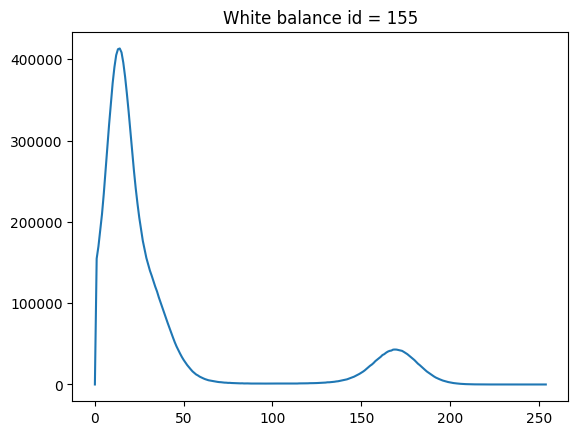

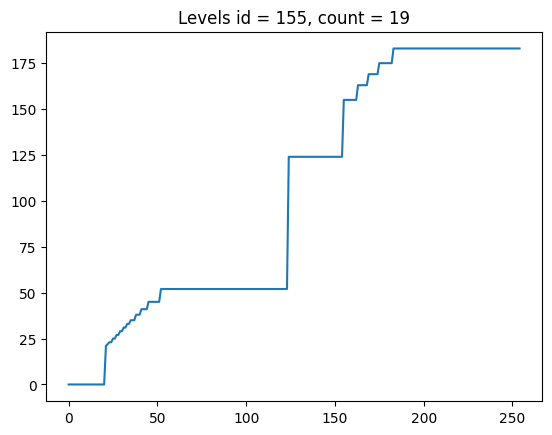

16
Start: 155
Progress: 0/100
Progress: 1/100   Time has passed: 1m 26s    Remaining time: 8530 (142 min)
Progress: 2/100   Time has passed: 3m 11s    Remaining time: 9396 (156 min)
Progress: 3/100   Time has passed: 5m 14s    Remaining time: 10171 (169 min)
Progress: 4/100   Time has passed: 7m 30s    Remaining time: 10802 (180 min)
Progress: 5/100   Time has passed: 9m 40s    Remaining time: 11035 (183 min)
Progress: 6/100   Time has passed: 12m 3s    Remaining time: 11329 (188 min)
Progress: 7/100   Time has passed: 14m 17s    Remaining time: 11394 (189 min)
Progress: 8/100   Time has passed: 16m 34s    Remaining time: 11439 (190 min)
Progress: 9/100   Time has passed: 18m 57s    Remaining time: 11500 (191 min)
Progress: 10/100   Time has passed: 21m 21s    Remaining time: 11532 (192 min)
Progress: 11/100   Time has passed: 23m 53s    Remaining time: 11600 (193 min)
Progress: 12/100   Time has passed: 26m 31s    Remaining time: 11671 (194 min)
Progress: 13/100   Time has passed: 29m

In [26]:
Rock_filter(my_Rocks[28])

# Рассчёт средней серости камня

In [9]:
def Rock_grey_level(my_Rocks):
    w_final = np.zeros(255,dtype=float)
    w_final_log = np.zeros(255,dtype=float)
    #counts = np.zeros(255,dtype=int)
    for n in range(2*len(my_Rocks.list2)//1000, 7*len(my_Rocks.list2)//1000): #len(list2)
        #Подгрузка изображения
        img = cv.imread(os.path.join(my_Rocks.path, my_Rocks.list2[n*100]), cv.IMREAD_GRAYSCALE)

        #Считывание размера изображения
        h_img, w_img = img.shape
        
        #Рассчёт распределения серости
        w = np.zeros(255,dtype=float)
        counts = np.zeros(255,dtype=int)
        for i in range(h_img):
            for j in range(w_img):
                w[min(254,img[i,j])] += 1
                counts[min(254,img[i,j])] = min(254,img[i,j])
        
        for i in range(0, 255):
            w_final[i] += w[i] #/ h_img / w_img * 1000
            
        #print(n)
                
    w_final[0]=1
    for i in range(0, 255):
        if w_final[i] < 1:
            w_final[i]=1
        if counts[i] == 0:
            counts[i] = i
        #w_final_log[i] = np.log(w_final[i])
    #Построение графика серости        
    plt.plot(counts, w_final)
    plt.title('White balance id = ' + str(my_Rocks.id))
    plt.savefig('White balance id = ' + str(my_Rocks.id) + '.png')
    plt.show()

    w_sum = 0

    for n in range(255):
        w_sum += w_final[n]
        #print(n,w_final[n])

    percent_level = 2
    zero_level = 15

    w_percent_level = w_sum * percent_level / 100
    #print(w_percent_level)
    w_buf = 0
    marker = 0
    num_marker = 0
    color_maska = np.zeros(255,dtype=int)
    for n in range(255):
        w_buf = w_buf + w_final[n]
        if w_buf > w_percent_level:
            w_buf = 0
            if(n > zero_level):
                #print(n)
                marker = n
                num_marker += 1
        color_maska[n] = marker        

    my_Rocks.level_num = num_marker
    my_Rocks.level_map = color_maska

    print(my_Rocks.level_num)
    print(counts)
    print(my_Rocks.level_map)

    #Построение графика уровней        
    plt.plot(counts, my_Rocks.level_map)
    plt.xlim(0, 255)
    plt.ylim(0, 255)
    plt.title('Levels id = ' + str(my_Rocks.id) + ', count = ' + str(my_Rocks.level_num))
    plt.savefig('Levels id = ' + str(my_Rocks.id) + '.png')
    plt.show()

    return my_Rocks.level_map


# Генерация 3-х мерных представлений

In [15]:
def gen_3d_img(myRock, dop_name):
    img = cv.imread(os.path.join(myRock.path, myRock.list2[len(myRock.list2)//2]), cv.IMREAD_GRAYSCALE)

    x_range = img.shape[0]
    y_range = img.shape[1]

    # размер воксельного тела
    print("Размер воксельного тела: ", x_range, "x", y_range, "x", len(myRock.list2))

    # создание массива

    voks_poch = np.zeros([img.shape[0],img.shape[1],len(myRock.list2)],dtype=int)

    # заполение массива данными о теле

    values = len(myRock.list2)
    percent = values / 100
    j = 0
    z = 0
    level_map = np.zeros(256,dtype=int)

    for i in range(len(myRock.list2)):
        img = cv.imread(os.path.join(myRock.path, myRock.list2[i]), cv.IMREAD_GRAYSCALE)
        if img.shape[0] == x_range and img.shape[1] == y_range:
            for x in range(x_range):
                for y in range(y_range):
                    voks_poch[x,y,i]=img[x,y]
                    level_map[img[x,y]] += 1
        else:
            print('ERROR: Bad image for x/y range in file ' + myRock.path + myRock.list2[i])
        
        if i > j * percent:
            print(j,'/100 i=',i)
            j = j + 1

    myRock.level_num = 0
    myRock.level_map = np.zeros(np.count_nonzero(level_map),dtype=int)

    for i in range(256):
        if level_map[i] != 0:
            myRock.level_map[myRock.level_num] = level_map[i]
            myRock.level_num += 1

    f = open('voksel_poch_' + str(myRock.id) + dop_name + '.conf', 'w+')

    f.write(str(x_range))
    f.write("\n")
    f.write(str(y_range))
    f.write("\n")
    f.write(str(len(myRock.list2)))
    f.write("\n")
    f.write(str(myRock.level_num))
    f.write("\n")
    for i in range(len(myRock.level_map)):
        f.write(str(myRock.level_map[i]) + ' ')

    f.close()

    print('Finish write voksel_poch_' + str(myRock.id) + dop_name + '.conf.')

    f = open('voksel_poch_' + str(myRock.id) + dop_name + '.bin', 'wb+')

    values = x_range*y_range*len(myRock.list2)
    percent = x_range/100
    j = 0

    for x in range(x_range):
        for y in range(y_range):
            for i in range(len(myRock.list2)):
                byte_string = bytes([voks_poch[x,y,i]])
                f.write(byte_string)
                
                if x >= j * percent:
                    print(j,'/100 i=',x)
                    j = j + 1
        
    f.close()

    print('Finish write voksel_poch_' + str(myRock.id) + dop_name + '.bin.')

def save_3d_img(img3d, name):

    x_range = img3d.shape[0]
    y_range = img3d.shape[1]
    z_range = img3d.shape[2]

    # размер воксельного тела
    print("Размер воксельного тела: ", x_range, "x", y_range, "x", z_range)

    f = open('voksel_poch_' + name + '.conf', 'w+')

    f.write(str(x_range))
    f.write("\n")
    f.write(str(y_range))
    f.write("\n")
    f.write(str(z_range))
    f.write("\n")
    f.write(str(0))
    f.write("\n")
    # for i in range(len(myRock.level_map)):
    #     f.write(str(myRock.level_map[i]) + ' ')

    f.close()

    print('Finish write voksel_poch_' + name + '.conf.')

    f = open('voksel_poch_' + name + '.bin', 'wb+')

    values = x_range*y_range*z_range
    percent = x_range/100
    j = 0

    for x in range(x_range):
        for y in range(y_range):
            for i in range(z_range):
                byte_string = bytes([img3d[x,y,i]])
                f.write(byte_string)
                
                if x >= j * percent:
                    print(j,'/100 i=',x)
                    j = j + 1
        
    f.close()

    print('Finish write voksel_poch_' + name + '.bin.')

def open_3d_img(name):
    f = open('voksel_poch_' + name + '.conf', 'r')

    x_range = int(f.readline())
    y_range = int(f.readline())
    z_range = int(f.readline())

    f.close()

    #print(x_range, y_range, z_range)

    voks_poch = np.zeros([x_range, y_range, z_range],dtype=int)
    j = 0
    percent = int(x_range / 100)

    with open('voksel_poch_' + name + '.bin', 'rb') as f:
        byte = f.read(1)
        for x in range(x_range):
            for y in range(y_range):
                for z in range(z_range):
                    voks_poch[x,y,z] = int.from_bytes(byte, "big")
                    byte = f.read(1)
            
            if x > percent * j:
                #print(x, '/ ', x_range)
                j = j + 1
            # plt.gray()
            # plt.imshow(voks_poch[x,:,:])
            # plt.show()
            
    f.close()

    return voks_poch

# Инструменты для сжатия изображения

In [ ]:
# Фильтр Ланцоша
# size              - размер фильтра Ланцоша
# x                 - точка для выяснения коэффициента функции 
#
# возвращет значение в заданной точке

def lanczos(size, x):

    if x >=size or x <= -size :
        return 0
    if x == 0:
        return 1
    xpi = x * math.pi
    return (size * math.sin(xpi) * math.sin(xpi / size) / (xpi * xpi)) / (1 + abs(x)) / (1 + abs(x)) / (1 + abs(x))

##################################################################################################################

# генерирует матрицу преобразования изображения
# filterSize        - размер фильтра Ланцоша
# cachePrecision    - разрешение дискретизации функции
#
# возвращает матрицу ядра преобразования

def createCache(cachePrecision, filterSize):
    cache_size = filterSize * cachePrecision + 1

    # расчитываем четвертинку для удобства
    cache4 = np.zeros([cache_size, cache_size, cache_size], dtype = float)
    for x in range(cache_size):
        for y in range(cache_size):
            for z in range(cache_size):
                #print(x, y, z, math.sqrt(x * x + y * y + z * z) / cachePrecision, lanczos(cache_size, math.sqrt(x * x + y * y + z * z) / cachePrecision))
                cache4[x,y,z] = lanczos(filterSize, math.sqrt(x * x + y * y + z * z) / cachePrecision)

    # создаём полноценную мастрицу преобразования
    cache = np.zeros([cache_size * 2 - 1, cache_size * 2 - 1, cache_size * 2 - 1], dtype = float)
    for x in range(cache_size * 2 - 1):
        for y in range(cache_size * 2 - 1):
            for z in range(cache_size * 2 - 1):
                cache[x,y,z] = cache4[abs(cache_size - 1 - x), abs(cache_size - 1 - y), abs(cache_size - 1 - z)]

    return cache

##################################################################################################################

# пересчёт положения центра пикселя из нового изображения в координатную плоскость старого изображения 
# X                 - координата пикселя в новом изображении
# h                 - размер старого изображения в пикселях
# H                 - размер нового изображения в пикселях
#
# возвращает координату в старом изображении

def transCoord(X, h, H):
    return (X + 0) * h / H

##################################################################################################################

# узнать цвет в точке изображения
# img               - изоражение
# x                 - x координата интересующей нас точки
# y                 - y координата интересующей нас точки
# z                 - z координата интересующей нас точки
#
# возвращет цвет пикселя

def colorForCoord(img, x, y, z):
    # решение проблемы попадания на границы пикселей
    # по стандарту - смещаемся к нулю
    if (x % 1 == 0): 
        x -= 0.1
    if (y % 1 == 0): 
        y -= 0.1
    if (z % 1 == 0): 
        z -= 0.1

    # Усли сместились за изображение
    if (x < 0): 
        x = 0.1
    if (x > img.shape[0]): 
        x = img.shape[0] - 0.1
    if (y < 0): 
        y = 0.1
    if (y > img.shape[1]): 
        y = img.shape[1] - 0.1
    if (z < 0): 
        z = 0.1
    if (z > img.shape[2]): 
        z = img.shape[2] - 0.1

    #print(str(int(x // 1)) + ", " + str(int(y // 1)) + ", " + str(int(z // 1)))

    color = img[int(x // 1), int(y // 1), int(z // 1)]

    return color

##################################################################################################################

# наложение ядра на изображение
# img               - сжимаемое изображение
# X                 - x координата центра ядра
# Y                 - y координата центра ядра
# Z                 - z координата центра ядра
# h                 - высота старого изображения
# w                 - ширина старого изображения
# d                 - глубина старого изображения
# H                 - высота нового изображения
# W                 - ширина нового изображения
# D                 - глубина нового изображения
# filterSize        - размер фильтра Ланцоша
# cachePrecision    - разрешение дискретизации функции
#
# возвращает не нормированное значение

def kernelCalculate(img3d, X, Y, Z, h, w, d, H, W, D, cache, filterSize, cachePrecision, norm):
    res = 0
    x = transCoord(X, h, H)
    y = transCoord(Y, w, W)
    z = transCoord(Z, d, D)

    #print("centr kernel:" + str(x) + ", " + str(y) + ", " + str(z))

    #print("ugol sqard:")
    #print(str(x - filterSize) + ", " + str(y - filterSize) + ", " + str(z - filterSize))
    #print(str(x + filterSize) + ", " + str(y + filterSize) + ", " + str(z + filterSize))
    for i in np.arange(-filterSize, filterSize, 1/cachePrecision):
        for j in np.arange(-filterSize, filterSize, 1/cachePrecision):
            for k in np.arange(-filterSize, filterSize, 1/cachePrecision):

                x_p = x + i
                y_p = y + j
                z_p = z + k

                #print(str(x_p)+ ", " + str(y_p) + ", " + str(z_p))

                color = colorForCoord(img3d, x_p, y_p, z_p)

                #print(int(color))

                res += color * cache[int((i + filterSize) * cachePrecision // 1), int((j + filterSize) * cachePrecision // 1), int((k + filterSize) * cachePrecision // 1)]

                #print(res)

    res = res / norm

    if res < 0:
        res = 0

    if res > 255:
        res = 255

    return int(res)

def kernelCalculateP(img3d, i, h, w, d, H, W, D, cache, filterSize, cachePrecision, norm):
    return kernelCalculate(img3d, i % H, i // H % W, i // (H * W), h, w, d, H, W, D, cache, filterSize, cachePrecision, norm)

##################################################################################################################

# вычисление коэфициента нормировки фильтра Ланцоша
# filterSize        - размер фильтра Ланцоша
# cachePrecision    - разрешение дискретизации функции
#
# возвращает нормировочный коэффициент

def normCache(cachePrecision, filterSize):
    norm = 0

    cache = createCache(cachePrecision, filterSize)


    for i in range((filterSize * cachePrecision + 1) * 2 - 1):
        for j in range((filterSize * cachePrecision + 1) * 2 - 1):
            for k in range((filterSize * cachePrecision + 1) * 2 - 1):
                norm += cache[i, j, k]

    return norm

##################################################################################################################

# преобразование 3х мерного тела при помощи фильтра Ланцоша
# img3d             - матрица с исходным 3х мерным изображением
# comp              - коэффициент преобразования
# core              - размер ядра преобразования

def compress_Lanczos_3d(img3d, comp, core):
    h = img3d.shape[0]
    w = img3d.shape[1]
    d = img3d.shape[2]

    #print("h: " + str(h) +"\nw: " + str(w) +"\nd: " + str(d) + "\n")

    H = int(h // comp)
    W = int(w // comp)
    D = int(d // comp)
    
    #print("H: " + str(H) +"\nW: " + str(W) +"\nD: " + str(D) + "\n")

    img3d_comprecced = np.zeros([H, W, D], dtype = int)

    filterSize = core
    cachePrecision = 7

    # создание ядра свёртки

    cache = createCache(cachePrecision, filterSize)

    print("cache central line:")
    print(cache[cache.shape[0]//2,cache.shape[1]//2])

    norm = normCache(cachePrecision, filterSize)

    print("norm: ", str(norm))

    for X in range (H):
        for Y in range(W):
            for Z in range(D):
                #print("Calculate point: " + str(X) + ", " + str(Y) + ", " + str(Z))
    
                img3d_comprecced[X,Y,Z] = kernelCalculate(img3d, X, Y, Z, h, w, d, H, W, D, cache, filterSize, cachePrecision, norm)# / norm
    
                #print("img3d_comprecced[" + str(X) + ", " + str(Y) + ", " + str(Z) + "]: " + str(img3d_comprecced[X,Y,Z]) + "\n")

    return img3d_comprecced
##################################################################################################################

# преобразование 3х мерного тела при помощи фильтра Ланцоша
# img3d             - матрица с исходным 3х мерным изображением
# comp              - коэффициент преобразования
# core              - размер ядра преобразования

def compress_Lanczos_3d_parallel(img3d, comp, core):
    h = img3d.shape[0]
    w = img3d.shape[1]
    d = img3d.shape[2]

    #print("h: " + str(h) +"\nw: " + str(w) +"\nd: " + str(d) + "\n")

    H = int(h // comp)
    W = int(w // comp)
    D = int(d // comp)
    
    #print("H: " + str(H) +"\nW: " + str(W) +"\nD: " + str(D) + "\n")

    img3d_comprecced = np.zeros([H, W, D], dtype = int)

    filterSize = core
    cachePrecision = 7

    # создание ядра свёртки

    cache = createCache(cachePrecision, filterSize)

    #print("cache central line:")
    #print(cache[cache.shape[0]//2,cache.shape[1]//2])

    norm = normCache(cachePrecision, filterSize)

    #print("norm: ", str(norm))

    res = np.zeros(H * W * D, dtype = int)

    step = H * W * D // 100

    start_time = time.time()

    print("Progress: 0/100")

    for s in range(100):

        res = Parallel(n_jobs=20)(delayed(kernelCalculateP)(img3d, i, h, w, d, H, W, D, cache, filterSize, cachePrecision, norm) for i in range(s * step, (s + 1) * step))

        for i in range(step):
            #print("Calculate point: " + str(i % H) + ", " + str(i // H % W) + ", " + str(i // (H * W)))
        
            img3d_comprecced[(s * step + i) % H, (s * step + i) // H % W, (s * step + i) // (H * W)] = res[i]# / norm
        
            #print("img3d_comprecced[" + str(i % H) + ", " + str(i // H % W) + ", " + str(i // (H * W)) + "]: " + str(img3d_comprecced[i % H, i // H % W, i // (H * W)]) + "\n")
        
        print("Progress: " + str(s + 1) + "/100   Time has passed: " + str(int(time.time() - start_time)) + "   Remaining time: " + str(int((time.time() - start_time) / (s + 1) * (99 - s))) + " (" + str(int((time.time() - start_time) / (s + 1) * (99 - s)) // 60) + " min)")

    return img3d_comprecced


##################################################################################################################

# преобразование 3х мерного тела при помощи фильтра Ланцоша
# img3d             - матрица с исходным 3х мерным изображением
# comp              - коэффициент преобразования
# core              - размер ядра преобразования

def compress_Lanczos_3d_test(img3d, comp, core):
    h = img3d.shape[0]
    w = img3d.shape[1]
    d = img3d.shape[2]

    print("h: " + str(h) +"\nw: " + str(w) +"\nd: " + str(d) + "\n")

    H = int(h // comp)
    W = int(w // comp)
    D = int(d // comp)
    
    print("H: " + str(H) +"\nW: " + str(W) +"\nD: " + str(D) + "\n")

    img3d_comprecced = np.zeros([H, W, D], dtype = int)

    filterSize = core
    cachePrecision = int(3 * comp // 1)

    # создание ядра свёртки

    cache = createCache(cachePrecision, filterSize)

    print("cache central line:")
    print(cache[cache.shape[0]//2,cache.shape[1]//2])

    norm = normCache(cachePrecision, filterSize)

    print("norm: ", str(norm))

    X = H // 2
    Y = W // 2
    Z = D // 2
    print("Calculate point: " + str(X) + ", " + str(Y) + ", " + str(Z))
    
    img3d_comprecced[X,Y,Z] = kernelCalculate(img3d, X, Y, Z, h, w, d, H, W, D, cache, filterSize, cachePrecision, norm)# / norm
    
    print("img3d_comprecced[" + str(X) + ", " + str(Y) + ", " + str(Z) + "]: " + str(img3d_comprecced[X,Y,Z]) + "\n")

    return img3d_comprecced

##################################################################################################################

# печатает изображение среза в том или ином направлении
# img3d             - матрица с исходным 3х мерным изображением
# level             - уровень среза
# vector            - направление среза, принимает занчение от 0 до 2 (0 - вдоль высоты, 1 - вдоль горизонтали, 2 - вдоль глубины)
#
# выводится изображение среза

def printLevel(img3d, level, vector):
    
    if vector == 0:
        img = np.zeros([img3d.shape[1], img3d.shape[2]], dtype = int)
        for i in range(img3d.shape[1]):
            for j in range(img3d.shape[2]):
                img[i ,j] = img3d[level, i, j]
    
    if vector == 1:
        img = np.zeros([img3d.shape[0], img3d.shape[2]], dtype = int)
        for i in range(img3d.shape[0]):
            for j in range(img3d.shape[2]):
                img[i ,j] = img3d[i, level, j]
    
    if vector == 2:
        img = np.zeros([img3d.shape[0], img3d.shape[1]], dtype = int)
        for i in range(img3d.shape[0]):
            for j in range(img3d.shape[1]):
                img[i ,j] = img3d[i, j, level]

    plt.gray()
    plt.imshow(img[:,:])
    plt.show()

##################################################################################################################

#cache = createCache(10, 3)
#print(cache[30,30])
#print(normCache(100,3))

# Программа для сжатия и сохранения камня

In [ ]:
comp = 10

for id_rock in range(len(my_Rocks)): 
    myRock = my_Rocks[id_rock]

    print("Камень " + str(myRock.id) + " в работе.")

    img = cv.imread(os.path.join(myRock.path, myRock.list2[img_num//2]), cv.IMREAD_GRAYSCALE)

    x_range = img.shape[0]
    y_range = img.shape[1]

    # размер воксельного тела
    print("Размер воксельного тела: ", x_range, "x", y_range, "x", len(myRock.list2))

    # создание массива

    voks_poch = np.zeros([img.shape[0],img.shape[1],len(myRock.list2)],dtype=int)

    # заполение массива данными о теле

    values = len(myRock.list2)
    percent = values / 100
    j = 0
    z = 0
    level_map = np.zeros(255,dtype=int)

    for i in range(len(myRock.list2)):
        img = cv.imread(os.path.join(myRock.path, myRock.list2[i]), cv.IMREAD_GRAYSCALE)
        #print(myRock.list2[i], img.shape[0])
        # plt.gray()
        # plt.imshow(img[:,:])
        # plt.show()
        if img.shape[0] == x_range and img.shape[1] == y_range:
            for x in range(x_range):
                for y in range(y_range):
                    voks_poch[x,y,z]=img[x,y]
                    level_map[img[x,y]] += 1
        else:
            print('ERROR: Rock ' + str(myRock.id) + ': Bad image for x/y range in file ' + myRock.path + ' ' +myRock.list2[i])
        
        z += 1
        
        if i > j * percent:
            print(j,'/100 i=',i)
            j = j + 1

    myRock.level_num = 0
    myRock.level_map = np.zeros(np.count_nonzero(level_map),dtype=int)

    for i in range(255):
        if level_map[i] != 0:
            myRock.level_map[myRock.level_num] = level_map[i]
            myRock.level_num += 1

    printLevel(voks_poch, voks_poch.shape[0] // 2, 0)
    printLevel(voks_poch, voks_poch.shape[1] // 2, 1)
    printLevel(voks_poch, voks_poch.shape[2] // 2, 2)

    voks_poch_comp = compress_Lanczos_3d_parallel(voks_poch, comp, 3)

    printLevel(voks_poch_comp, voks_poch_comp.shape[0] // 2, 0)
    printLevel(voks_poch_comp, voks_poch_comp.shape[1] // 2, 1)
    printLevel(voks_poch_comp, voks_poch_comp.shape[2] // 2, 2)

    save_3d_img(voks_poch_comp, str(myRock.id) + '_comp_x' + str(comp))

# Программа для перевода изображений в 3-х мерное тело

In [16]:
for i in range(24, len(my_Rocks)):
    gen_3d_img(my_Rocks[i], "_orig")

Размер воксельного тела:  824 x 920 x 904
0 /100 i= 1
1 /100 i= 10
2 /100 i= 19
3 /100 i= 28
4 /100 i= 37
5 /100 i= 46
6 /100 i= 55
7 /100 i= 64
8 /100 i= 73
9 /100 i= 82
10 /100 i= 91
11 /100 i= 100
12 /100 i= 109
13 /100 i= 118
14 /100 i= 127
15 /100 i= 136
16 /100 i= 145
17 /100 i= 154
18 /100 i= 163
19 /100 i= 172
20 /100 i= 181
21 /100 i= 190
22 /100 i= 199
23 /100 i= 208
24 /100 i= 217
25 /100 i= 226
26 /100 i= 236
27 /100 i= 245
28 /100 i= 254
29 /100 i= 263
30 /100 i= 272
31 /100 i= 281
32 /100 i= 290
33 /100 i= 299
34 /100 i= 308
35 /100 i= 317
36 /100 i= 326
37 /100 i= 335
38 /100 i= 344
39 /100 i= 353
40 /100 i= 362
41 /100 i= 371
42 /100 i= 380
43 /100 i= 389
44 /100 i= 398
45 /100 i= 407
46 /100 i= 416
47 /100 i= 425
48 /100 i= 434
49 /100 i= 443
50 /100 i= 452
51 /100 i= 462
52 /100 i= 471
53 /100 i= 480
54 /100 i= 489
55 /100 i= 498
56 /100 i= 507
57 /100 i= 516
58 /100 i= 525
59 /100 i= 534
60 /100 i= 543
61 /100 i= 552
62 /100 i= 561
63 /100 i= 570
64 /100 i= 579
65 /1

# Программа для фильтрации изображений

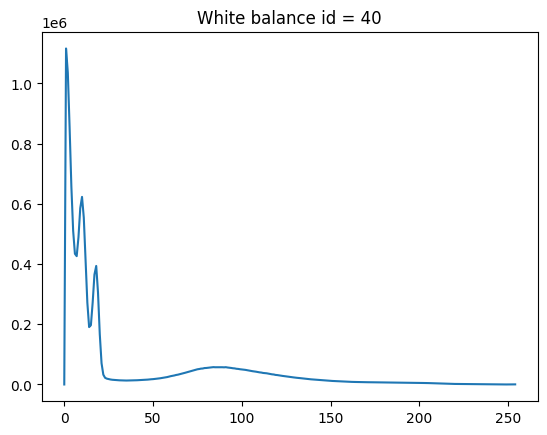

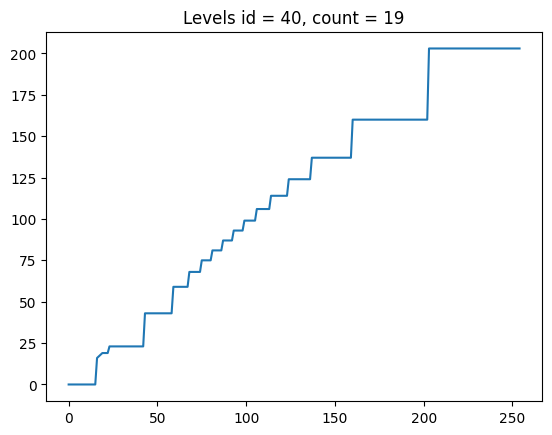

22
Start: 40
Progress: 0/100


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 1/100   Time has passed: 2m 51s    Remaining time: 16960 (282 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 2/100   Time has passed: 3m 41s    Remaining time: 10850 (180 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 3/100   Time has passed: 4m 35s    Remaining time: 8904 (148 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 4/100   Time has passed: 5m 27s    Remaining time: 7851 (130 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 5/100   Time has passed: 6m 19s    Remaining time: 7219 (120 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 6/100   Time has passed: 7m 7s    Remaining time: 6698 (111 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 7/100   Time has passed: 7m 51s    Remaining time: 6267 (104 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 8/100   Time has passed: 8m 29s    Remaining time: 5855 (97 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 9/100   Time has passed: 9m 3s    Remaining time: 5497 (91 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 10/100   Time has passed: 9m 39s    Remaining time: 5211 (86 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 11/100   Time has passed: 10m 14s    Remaining time: 4969 (82 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 12/100   Time has passed: 11m 7s    Remaining time: 4891 (81 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 13/100   Time has passed: 12m 6s    Remaining time: 4861 (81 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 14/100   Time has passed: 13m 14s    Remaining time: 4877 (81 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 15/100   Time has passed: 14m 22s    Remaining time: 4888 (81 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 16/100   Time has passed: 15m 34s    Remaining time: 4906 (81 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 17/100   Time has passed: 16m 47s    Remaining time: 4917 (81 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 18/100   Time has passed: 17m 59s    Remaining time: 4919 (81 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 19/100   Time has passed: 19m 14s    Remaining time: 4920 (82 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 20/100   Time has passed: 20m 37s    Remaining time: 4950 (82 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 21/100   Time has passed: 22m 0s    Remaining time: 4968 (82 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 22/100   Time has passed: 23m 25s    Remaining time: 4982 (83 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 23/100   Time has passed: 24m 46s    Remaining time: 4977 (82 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 24/100   Time has passed: 26m 13s    Remaining time: 4983 (83 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 25/100   Time has passed: 27m 36s    Remaining time: 4969 (82 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 26/100   Time has passed: 29m 2s    Remaining time: 4958 (82 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 27/100   Time has passed: 30m 27s    Remaining time: 4939 (82 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 28/100   Time has passed: 31m 56s    Remaining time: 4929 (82 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 29/100   Time has passed: 33m 32s    Remaining time: 4927 (82 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 30/100   Time has passed: 35m 12s    Remaining time: 4929 (82 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 31/100   Time has passed: 36m 46s    Remaining time: 4910 (81 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 32/100   Time has passed: 38m 21s    Remaining time: 4890 (81 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 33/100   Time has passed: 40m 10s    Remaining time: 4894 (81 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 34/100   Time has passed: 42m 1s    Remaining time: 4894 (81 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 35/100   Time has passed: 44m 11s    Remaining time: 4925 (82 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 36/100   Time has passed: 46m 24s    Remaining time: 4950 (82 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 37/100   Time has passed: 48m 22s    Remaining time: 4942 (82 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 38/100   Time has passed: 50m 26s    Remaining time: 4938 (82 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 39/100   Time has passed: 52m 29s    Remaining time: 4925 (82 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 40/100   Time has passed: 54m 32s    Remaining time: 4908 (81 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 41/100   Time has passed: 56m 46s    Remaining time: 4901 (81 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 42/100   Time has passed: 58m 58s    Remaining time: 4886 (81 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 43/100   Time has passed: 61m 11s    Remaining time: 4866 (81 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 44/100   Time has passed: 63m 21s    Remaining time: 4837 (80 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 45/100   Time has passed: 65m 42s    Remaining time: 4818 (80 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 46/100   Time has passed: 67m 55s    Remaining time: 4783 (79 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 47/100   Time has passed: 70m 3s    Remaining time: 4739 (78 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 48/100   Time has passed: 72m 25s    Remaining time: 4707 (78 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 49/100   Time has passed: 74m 58s    Remaining time: 4682 (78 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 50/100   Time has passed: 77m 37s    Remaining time: 4657 (77 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 51/100   Time has passed: 80m 14s    Remaining time: 4626 (77 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 52/100   Time has passed: 83m 3s    Remaining time: 4600 (76 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 53/100   Time has passed: 86m 5s    Remaining time: 4580 (76 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 54/100   Time has passed: 88m 43s    Remaining time: 4535 (75 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 55/100   Time has passed: 91m 20s    Remaining time: 4483 (74 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 56/100   Time has passed: 94m 10s    Remaining time: 4439 (73 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 57/100   Time has passed: 96m 53s    Remaining time: 4385 (73 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 58/100   Time has passed: 99m 32s    Remaining time: 4325 (72 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 59/100   Time has passed: 102m 12s    Remaining time: 4261 (71 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 60/100   Time has passed: 104m 45s    Remaining time: 4190 (69 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 61/100   Time has passed: 107m 13s    Remaining time: 4113 (68 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 62/100   Time has passed: 109m 47s    Remaining time: 4037 (67 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 63/100   Time has passed: 112m 27s    Remaining time: 3962 (66 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 64/100   Time has passed: 114m 46s    Remaining time: 3873 (64 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 65/100   Time has passed: 117m 8s    Remaining time: 3784 (63 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 66/100   Time has passed: 119m 27s    Remaining time: 3692 (61 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 67/100   Time has passed: 121m 48s    Remaining time: 3599 (59 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 68/100   Time has passed: 124m 19s    Remaining time: 3510 (58 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 69/100   Time has passed: 126m 26s    Remaining time: 3408 (56 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 70/100   Time has passed: 128m 42s    Remaining time: 3309 (55 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 71/100   Time has passed: 131m 0s    Remaining time: 3210 (53 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 72/100   Time has passed: 133m 6s    Remaining time: 3105 (51 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 73/100   Time has passed: 135m 19s    Remaining time: 3002 (50 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 74/100   Time has passed: 137m 27s    Remaining time: 2897 (48 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 75/100   Time has passed: 139m 41s    Remaining time: 2793 (46 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 76/100   Time has passed: 142m 2s    Remaining time: 2691 (44 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 77/100   Time has passed: 144m 29s    Remaining time: 2589 (43 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 78/100   Time has passed: 146m 57s    Remaining time: 2486 (41 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 79/100   Time has passed: 149m 14s    Remaining time: 2380 (39 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 80/100   Time has passed: 151m 46s    Remaining time: 2276 (37 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 81/100   Time has passed: 153m 52s    Remaining time: 2165 (36 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 82/100   Time has passed: 155m 40s    Remaining time: 2050 (34 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 83/100   Time has passed: 157m 17s    Remaining time: 1933 (32 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 84/100   Time has passed: 158m 37s    Remaining time: 1812 (30 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 85/100   Time has passed: 159m 53s    Remaining time: 1692 (28 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 86/100   Time has passed: 161m 16s    Remaining time: 1575 (26 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 87/100   Time has passed: 162m 37s    Remaining time: 1458 (24 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 88/100   Time has passed: 163m 52s    Remaining time: 1340 (22 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 89/100   Time has passed: 165m 1s    Remaining time: 1223 (20 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 90/100   Time has passed: 166m 16s    Remaining time: 1108 (18 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 91/100   Time has passed: 167m 13s    Remaining time: 992 (16 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 92/100   Time has passed: 167m 54s    Remaining time: 876 (14 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 93/100   Time has passed: 168m 31s    Remaining time: 761 (12 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 94/100   Time has passed: 169m 4s    Remaining time: 647 (10 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 95/100   Time has passed: 169m 47s    Remaining time: 536 (8 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 96/100   Time has passed: 170m 39s    Remaining time: 426 (7 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 97/100   Time has passed: 171m 34s    Remaining time: 318 (5 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 98/100   Time has passed: 172m 30s    Remaining time: 211 (3 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 99/100   Time has passed: 173m 26s    Remaining time: 105 (1 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 100/100   Time has passed: 175m 48s    Remaining time: 0 (0 min)
Finish: 40


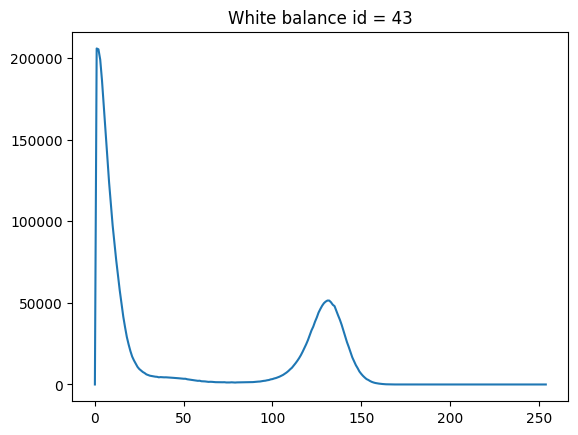

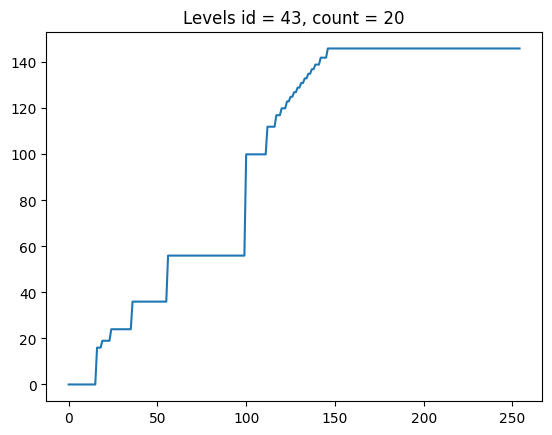

11
Start: 43
Progress: 0/100


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 1/100   Time has passed: 0m 11s    Remaining time: 1110 (18 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 2/100   Time has passed: 0m 22s    Remaining time: 1097 (18 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 3/100   Time has passed: 0m 35s    Remaining time: 1136 (18 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 4/100   Time has passed: 0m 45s    Remaining time: 1101 (18 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 5/100   Time has passed: 0m 58s    Remaining time: 1111 (18 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 6/100   Time has passed: 1m 9s    Remaining time: 1094 (18 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 7/100   Time has passed: 1m 22s    Remaining time: 1098 (18 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 8/100   Time has passed: 1m 33s    Remaining time: 1077 (17 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 9/100   Time has passed: 1m 46s    Remaining time: 1077 (17 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 10/100   Time has passed: 2m 3s    Remaining time: 1107 (18 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 11/100   Time has passed: 2m 29s    Remaining time: 1213 (20 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 12/100   Time has passed: 3m 1s    Remaining time: 1329 (22 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 13/100   Time has passed: 3m 25s    Remaining time: 1373 (22 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 14/100   Time has passed: 3m 52s    Remaining time: 1430 (23 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 15/100   Time has passed: 4m 16s    Remaining time: 1454 (24 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 16/100   Time has passed: 4m 45s    Remaining time: 1499 (24 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 17/100   Time has passed: 5m 13s    Remaining time: 1532 (25 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 18/100   Time has passed: 5m 47s    Remaining time: 1582 (26 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 19/100   Time has passed: 6m 16s    Remaining time: 1605 (26 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 20/100   Time has passed: 6m 55s    Remaining time: 1661 (27 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 21/100   Time has passed: 7m 25s    Remaining time: 1675 (27 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 22/100   Time has passed: 8m 0s    Remaining time: 1704 (28 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 23/100   Time has passed: 8m 40s    Remaining time: 1741 (29 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 24/100   Time has passed: 9m 20s    Remaining time: 1773 (29 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 25/100   Time has passed: 10m 6s    Remaining time: 1820 (30 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 26/100   Time has passed: 10m 45s    Remaining time: 1838 (30 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 27/100   Time has passed: 11m 35s    Remaining time: 1881 (31 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 28/100   Time has passed: 12m 18s    Remaining time: 1900 (31 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 29/100   Time has passed: 13m 20s    Remaining time: 1960 (32 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 30/100   Time has passed: 14m 12s    Remaining time: 1988 (33 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 31/100   Time has passed: 15m 1s    Remaining time: 2006 (33 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 32/100   Time has passed: 16m 11s    Remaining time: 2064 (34 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 33/100   Time has passed: 17m 17s    Remaining time: 2105 (35 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 34/100   Time has passed: 18m 30s    Remaining time: 2154 (35 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 35/100   Time has passed: 19m 35s    Remaining time: 2183 (36 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 36/100   Time has passed: 20m 59s    Remaining time: 2239 (37 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 37/100   Time has passed: 22m 17s    Remaining time: 2278 (37 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 38/100   Time has passed: 23m 43s    Remaining time: 2322 (38 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 39/100   Time has passed: 25m 5s    Remaining time: 2354 (39 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 40/100   Time has passed: 26m 40s    Remaining time: 2400 (40 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 41/100   Time has passed: 28m 3s    Remaining time: 2423 (40 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 42/100   Time has passed: 29m 39s    Remaining time: 2457 (40 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 43/100   Time has passed: 31m 19s    Remaining time: 2490 (41 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 44/100   Time has passed: 32m 55s    Remaining time: 2513 (41 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 45/100   Time has passed: 34m 51s    Remaining time: 2556 (42 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 46/100   Time has passed: 36m 35s    Remaining time: 2577 (42 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 47/100   Time has passed: 38m 29s    Remaining time: 2604 (43 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 48/100   Time has passed: 40m 12s    Remaining time: 2613 (43 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 49/100   Time has passed: 42m 3s    Remaining time: 2626 (43 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 50/100   Time has passed: 43m 32s    Remaining time: 2612 (43 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 51/100   Time has passed: 44m 54s    Remaining time: 2589 (43 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 52/100   Time has passed: 46m 33s    Remaining time: 2578 (42 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 53/100   Time has passed: 48m 2s    Remaining time: 2556 (42 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 54/100   Time has passed: 49m 42s    Remaining time: 2540 (42 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 55/100   Time has passed: 50m 59s    Remaining time: 2503 (41 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 56/100   Time has passed: 52m 23s    Remaining time: 2469 (41 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 57/100   Time has passed: 53m 31s    Remaining time: 2423 (40 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 58/100   Time has passed: 54m 40s    Remaining time: 2375 (39 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 59/100   Time has passed: 55m 40s    Remaining time: 2321 (38 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 60/100   Time has passed: 56m 52s    Remaining time: 2274 (37 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 61/100   Time has passed: 57m 50s    Remaining time: 2218 (36 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 62/100   Time has passed: 58m 49s    Remaining time: 2163 (36 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 63/100   Time has passed: 59m 55s    Remaining time: 2111 (35 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 64/100   Time has passed: 61m 2s    Remaining time: 2060 (34 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 65/100   Time has passed: 62m 14s    Remaining time: 2010 (33 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 66/100   Time has passed: 63m 18s    Remaining time: 1956 (32 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 67/100   Time has passed: 64m 34s    Remaining time: 1908 (31 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 68/100   Time has passed: 65m 45s    Remaining time: 1856 (30 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 69/100   Time has passed: 67m 4s    Remaining time: 1808 (30 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 70/100   Time has passed: 68m 13s    Remaining time: 1754 (29 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 71/100   Time has passed: 69m 27s    Remaining time: 1702 (28 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 72/100   Time has passed: 70m 43s    Remaining time: 1650 (27 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 73/100   Time has passed: 71m 50s    Remaining time: 1594 (26 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 74/100   Time has passed: 72m 57s    Remaining time: 1538 (25 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 75/100   Time has passed: 74m 2s    Remaining time: 1480 (24 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 76/100   Time has passed: 75m 10s    Remaining time: 1424 (23 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 77/100   Time has passed: 76m 6s    Remaining time: 1364 (22 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 78/100   Time has passed: 77m 9s    Remaining time: 1305 (21 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 79/100   Time has passed: 78m 4s    Remaining time: 1245 (20 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 80/100   Time has passed: 79m 1s    Remaining time: 1185 (19 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 81/100   Time has passed: 79m 46s    Remaining time: 1122 (18 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 82/100   Time has passed: 80m 32s    Remaining time: 1060 (17 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 83/100   Time has passed: 81m 25s    Remaining time: 1000 (16 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 84/100   Time has passed: 82m 3s    Remaining time: 937 (15 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 85/100   Time has passed: 82m 26s    Remaining time: 872 (14 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 86/100   Time has passed: 82m 38s    Remaining time: 807 (13 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 87/100   Time has passed: 82m 51s    Remaining time: 742 (12 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 88/100   Time has passed: 83m 2s    Remaining time: 679 (11 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 89/100   Time has passed: 83m 15s    Remaining time: 617 (10 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 90/100   Time has passed: 83m 26s    Remaining time: 556 (9 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 91/100   Time has passed: 83m 37s    Remaining time: 496 (8 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 92/100   Time has passed: 83m 49s    Remaining time: 437 (7 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 93/100   Time has passed: 84m 0s    Remaining time: 379 (6 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 94/100   Time has passed: 84m 13s    Remaining time: 322 (5 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 95/100   Time has passed: 84m 23s    Remaining time: 266 (4 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 96/100   Time has passed: 84m 36s    Remaining time: 211 (3 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 97/100   Time has passed: 84m 47s    Remaining time: 157 (2 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 98/100   Time has passed: 84m 59s    Remaining time: 104 (1 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 99/100   Time has passed: 85m 10s    Remaining time: 51 (0 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 100/100   Time has passed: 85m 24s    Remaining time: 0 (0 min)
Finish: 43


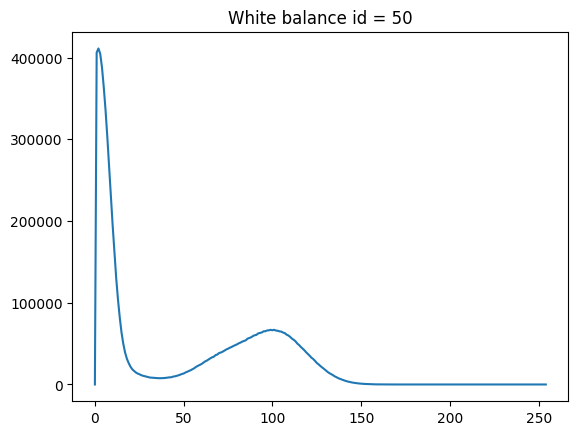

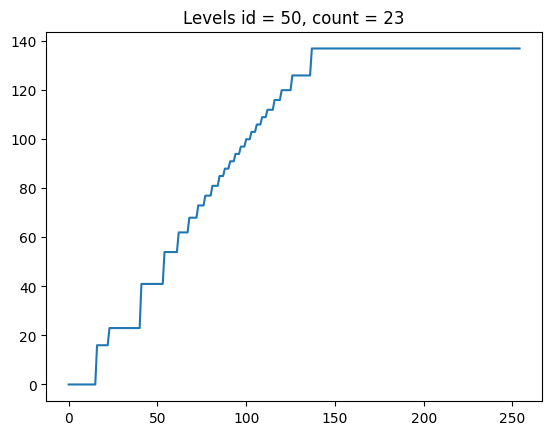

14
Start: 50
Progress: 0/100
Progress: 1/100   Time has passed: 0m 15s    Remaining time: 1553 (25 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 2/100   Time has passed: 0m 31s    Remaining time: 1547 (25 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 3/100   Time has passed: 0m 49s    Remaining time: 1593 (26 min)
Progress: 4/100   Time has passed: 1m 4s    Remaining time: 1551 (25 min)
Progress: 5/100   Time has passed: 1m 21s    Remaining time: 1540 (25 min)
Progress: 6/100   Time has passed: 1m 38s    Remaining time: 1546 (25 min)
Progress: 7/100   Time has passed: 1m 54s    Remaining time: 1517 (25 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 8/100   Time has passed: 2m 10s    Remaining time: 1505 (25 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 9/100   Time has passed: 2m 28s    Remaining time: 1506 (25 min)
Progress: 10/100   Time has passed: 2m 44s    Remaining time: 1482 (24 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 11/100   Time has passed: 3m 2s    Remaining time: 1476 (24 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 12/100   Time has passed: 3m 34s    Remaining time: 1571 (26 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 13/100   Time has passed: 4m 31s    Remaining time: 1817 (30 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 14/100   Time has passed: 5m 41s    Remaining time: 2097 (34 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 15/100   Time has passed: 7m 17s    Remaining time: 2479 (41 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 16/100   Time has passed: 8m 38s    Remaining time: 2724 (45 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 17/100   Time has passed: 10m 12s    Remaining time: 2988 (49 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 18/100   Time has passed: 12m 3s    Remaining time: 3294 (54 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 19/100   Time has passed: 13m 50s    Remaining time: 3542 (59 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 20/100   Time has passed: 15m 54s    Remaining time: 3816 (63 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 21/100   Time has passed: 17m 44s    Remaining time: 4002 (66 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 22/100   Time has passed: 19m 39s    Remaining time: 4180 (69 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 23/100   Time has passed: 21m 52s    Remaining time: 4393 (73 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 24/100   Time has passed: 23m 58s    Remaining time: 4555 (75 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 25/100   Time has passed: 25m 44s    Remaining time: 4634 (77 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 26/100   Time has passed: 27m 43s    Remaining time: 4733 (78 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 27/100   Time has passed: 29m 34s    Remaining time: 4797 (79 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 28/100   Time has passed: 31m 35s    Remaining time: 4873 (81 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 29/100   Time has passed: 33m 50s    Remaining time: 4970 (82 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 30/100   Time has passed: 35m 50s    Remaining time: 5018 (83 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 31/100   Time has passed: 38m 1s    Remaining time: 5078 (84 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 32/100   Time has passed: 40m 23s    Remaining time: 5149 (85 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 33/100   Time has passed: 42m 33s    Remaining time: 5184 (86 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 34/100   Time has passed: 44m 46s    Remaining time: 5214 (86 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 35/100   Time has passed: 47m 14s    Remaining time: 5263 (87 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 36/100   Time has passed: 49m 46s    Remaining time: 5308 (88 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 37/100   Time has passed: 52m 14s    Remaining time: 5337 (88 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 38/100   Time has passed: 54m 52s    Remaining time: 5371 (89 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 39/100   Time has passed: 57m 21s    Remaining time: 5382 (89 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 40/100   Time has passed: 59m 55s    Remaining time: 5393 (89 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 41/100   Time has passed: 62m 27s    Remaining time: 5392 (89 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 42/100   Time has passed: 64m 54s    Remaining time: 5378 (89 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 43/100   Time has passed: 67m 57s    Remaining time: 5404 (90 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 44/100   Time has passed: 70m 37s    Remaining time: 5393 (89 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 45/100   Time has passed: 73m 26s    Remaining time: 5385 (89 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 46/100   Time has passed: 76m 41s    Remaining time: 5402 (90 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 47/100   Time has passed: 79m 36s    Remaining time: 5385 (89 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 48/100   Time has passed: 82m 19s    Remaining time: 5350 (89 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 49/100   Time has passed: 85m 12s    Remaining time: 5320 (88 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 50/100   Time has passed: 87m 52s    Remaining time: 5272 (87 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 51/100   Time has passed: 90m 44s    Remaining time: 5231 (87 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 52/100   Time has passed: 93m 32s    Remaining time: 5181 (86 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 53/100   Time has passed: 96m 7s    Remaining time: 5114 (85 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 54/100   Time has passed: 98m 31s    Remaining time: 5035 (83 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 55/100   Time has passed: 101m 20s    Remaining time: 4974 (82 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 56/100   Time has passed: 103m 59s    Remaining time: 4902 (81 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 57/100   Time has passed: 106m 49s    Remaining time: 4834 (80 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 58/100   Time has passed: 109m 31s    Remaining time: 4758 (79 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 59/100   Time has passed: 111m 55s    Remaining time: 4666 (77 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 60/100   Time has passed: 114m 49s    Remaining time: 4592 (76 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 61/100   Time has passed: 117m 16s    Remaining time: 4498 (74 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 62/100   Time has passed: 119m 39s    Remaining time: 4400 (73 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 63/100   Time has passed: 122m 10s    Remaining time: 4304 (71 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 64/100   Time has passed: 124m 20s    Remaining time: 4196 (69 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 65/100   Time has passed: 126m 38s    Remaining time: 4091 (68 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 66/100   Time has passed: 128m 45s    Remaining time: 3979 (66 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 67/100   Time has passed: 130m 51s    Remaining time: 3867 (64 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 68/100   Time has passed: 132m 52s    Remaining time: 3751 (62 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 69/100   Time has passed: 135m 10s    Remaining time: 3643 (60 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 70/100   Time has passed: 137m 7s    Remaining time: 3525 (58 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 71/100   Time has passed: 138m 59s    Remaining time: 3406 (56 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 72/100   Time has passed: 140m 59s    Remaining time: 3289 (54 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 73/100   Time has passed: 142m 44s    Remaining time: 3167 (52 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 74/100   Time has passed: 144m 35s    Remaining time: 3048 (50 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 75/100   Time has passed: 146m 36s    Remaining time: 2932 (48 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 76/100   Time has passed: 148m 26s    Remaining time: 2812 (46 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 77/100   Time has passed: 150m 8s    Remaining time: 2690 (44 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 78/100   Time has passed: 151m 59s    Remaining time: 2572 (42 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 79/100   Time has passed: 153m 44s    Remaining time: 2451 (40 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 80/100   Time has passed: 155m 31s    Remaining time: 2332 (38 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 81/100   Time has passed: 156m 51s    Remaining time: 2207 (36 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 82/100   Time has passed: 158m 6s    Remaining time: 2082 (34 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 83/100   Time has passed: 159m 54s    Remaining time: 1965 (32 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 84/100   Time has passed: 161m 35s    Remaining time: 1846 (30 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 85/100   Time has passed: 163m 2s    Remaining time: 1726 (28 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 86/100   Time has passed: 164m 6s    Remaining time: 1602 (26 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 87/100   Time has passed: 165m 2s    Remaining time: 1479 (24 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 88/100   Time has passed: 165m 54s    Remaining time: 1357 (22 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 89/100   Time has passed: 166m 50s    Remaining time: 1237 (20 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 90/100   Time has passed: 167m 36s    Remaining time: 1117 (18 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 91/100   Time has passed: 168m 3s    Remaining time: 997 (16 min)
Progress: 92/100   Time has passed: 168m 21s    Remaining time: 878 (14 min)
Progress: 93/100   Time has passed: 168m 37s    Remaining time: 761 (12 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 94/100   Time has passed: 168m 53s    Remaining time: 646 (10 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 95/100   Time has passed: 169m 10s    Remaining time: 534 (8 min)
Progress: 96/100   Time has passed: 169m 26s    Remaining time: 423 (7 min)
Progress: 97/100   Time has passed: 169m 42s    Remaining time: 314 (5 min)
Progress: 98/100   Time has passed: 169m 59s    Remaining time: 208 (3 min)
Progress: 99/100   Time has passed: 170m 15s    Remaining time: 103 (1 min)
Progress: 100/100   Time has passed: 170m 33s    Remaining time: 0 (0 min)
Finish: 50


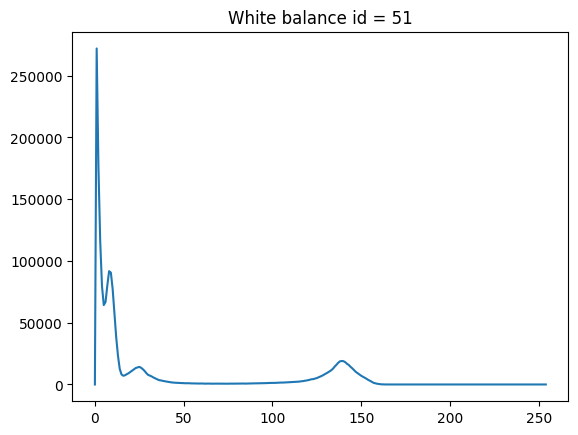

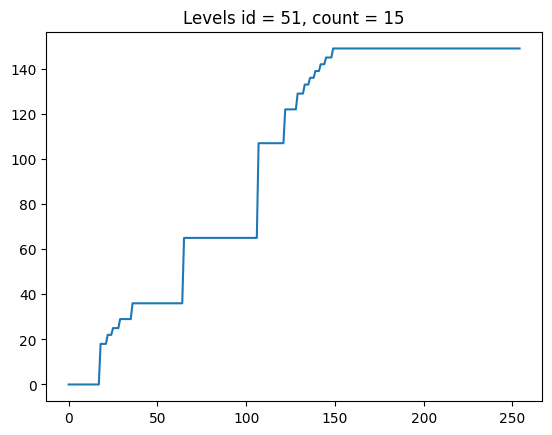

9
Start: 51
Progress: 0/100


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 1/100   Time has passed: 0m 4s    Remaining time: 449 (7 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 2/100   Time has passed: 0m 9s    Remaining time: 472 (7 min)
Progress: 3/100   Time has passed: 0m 14s    Remaining time: 475 (7 min)
Progress: 4/100   Time has passed: 0m 18s    Remaining time: 451 (7 min)
Progress: 5/100   Time has passed: 0m 22s    Remaining time: 432 (7 min)
Progress: 6/100   Time has passed: 0m 27s    Remaining time: 434 (7 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 7/100   Time has passed: 0m 32s    Remaining time: 435 (7 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 8/100   Time has passed: 0m 36s    Remaining time: 422 (7 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 9/100   Time has passed: 0m 42s    Remaining time: 431 (7 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 10/100   Time has passed: 0m 49s    Remaining time: 441 (7 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 11/100   Time has passed: 0m 56s    Remaining time: 453 (7 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 12/100   Time has passed: 1m 2s    Remaining time: 457 (7 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 13/100   Time has passed: 1m 10s    Remaining time: 470 (7 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 14/100   Time has passed: 1m 18s    Remaining time: 483 (8 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 15/100   Time has passed: 1m 27s    Remaining time: 498 (8 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 16/100   Time has passed: 1m 37s    Remaining time: 512 (8 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 17/100   Time has passed: 1m 50s    Remaining time: 537 (8 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 18/100   Time has passed: 1m 59s    Remaining time: 544 (9 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 19/100   Time has passed: 2m 11s    Remaining time: 559 (9 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 20/100   Time has passed: 2m 22s    Remaining time: 569 (9 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 21/100   Time has passed: 2m 33s    Remaining time: 577 (9 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 22/100   Time has passed: 2m 44s    Remaining time: 581 (9 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 23/100   Time has passed: 2m 56s    Remaining time: 592 (9 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 24/100   Time has passed: 3m 7s    Remaining time: 593 (9 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 25/100   Time has passed: 3m 21s    Remaining time: 604 (10 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 26/100   Time has passed: 3m 36s    Remaining time: 617 (10 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 27/100   Time has passed: 3m 47s    Remaining time: 616 (10 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 28/100   Time has passed: 4m 0s    Remaining time: 619 (10 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 29/100   Time has passed: 4m 11s    Remaining time: 615 (10 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 30/100   Time has passed: 4m 21s    Remaining time: 609 (10 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 31/100   Time has passed: 4m 32s    Remaining time: 606 (10 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 32/100   Time has passed: 4m 42s    Remaining time: 600 (10 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 33/100   Time has passed: 4m 55s    Remaining time: 599 (9 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 34/100   Time has passed: 5m 7s    Remaining time: 597 (9 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 35/100   Time has passed: 5m 25s    Remaining time: 604 (10 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 36/100   Time has passed: 5m 41s    Remaining time: 606 (10 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 37/100   Time has passed: 5m 58s    Remaining time: 609 (10 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 38/100   Time has passed: 6m 15s    Remaining time: 613 (10 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 39/100   Time has passed: 6m 31s    Remaining time: 611 (10 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 40/100   Time has passed: 6m 48s    Remaining time: 612 (10 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 41/100   Time has passed: 7m 3s    Remaining time: 609 (10 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 42/100   Time has passed: 7m 19s    Remaining time: 606 (10 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 43/100   Time has passed: 7m 33s    Remaining time: 600 (10 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 44/100   Time has passed: 7m 46s    Remaining time: 594 (9 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 45/100   Time has passed: 8m 2s    Remaining time: 589 (9 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 46/100   Time has passed: 8m 17s    Remaining time: 583 (9 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 47/100   Time has passed: 8m 32s    Remaining time: 577 (9 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 48/100   Time has passed: 8m 50s    Remaining time: 574 (9 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 49/100   Time has passed: 9m 5s    Remaining time: 567 (9 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 50/100   Time has passed: 9m 24s    Remaining time: 564 (9 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 51/100   Time has passed: 9m 44s    Remaining time: 561 (9 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 52/100   Time has passed: 10m 1s    Remaining time: 555 (9 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 53/100   Time has passed: 10m 18s    Remaining time: 548 (9 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 54/100   Time has passed: 10m 34s    Remaining time: 540 (9 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 55/100   Time has passed: 10m 48s    Remaining time: 530 (8 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 56/100   Time has passed: 11m 2s    Remaining time: 520 (8 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 57/100   Time has passed: 11m 20s    Remaining time: 513 (8 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 58/100   Time has passed: 11m 33s    Remaining time: 502 (8 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 59/100   Time has passed: 11m 47s    Remaining time: 491 (8 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 60/100   Time has passed: 12m 2s    Remaining time: 481 (8 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 61/100   Time has passed: 12m 16s    Remaining time: 470 (7 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 62/100   Time has passed: 12m 29s    Remaining time: 459 (7 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 63/100   Time has passed: 12m 40s    Remaining time: 446 (7 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 64/100   Time has passed: 12m 52s    Remaining time: 434 (7 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 65/100   Time has passed: 13m 3s    Remaining time: 421 (7 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 66/100   Time has passed: 13m 15s    Remaining time: 409 (6 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 67/100   Time has passed: 13m 26s    Remaining time: 397 (6 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 68/100   Time has passed: 13m 37s    Remaining time: 384 (6 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 69/100   Time has passed: 13m 49s    Remaining time: 372 (6 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 70/100   Time has passed: 14m 0s    Remaining time: 360 (6 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 71/100   Time has passed: 14m 11s    Remaining time: 347 (5 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 72/100   Time has passed: 14m 21s    Remaining time: 335 (5 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 73/100   Time has passed: 14m 31s    Remaining time: 322 (5 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 74/100   Time has passed: 14m 41s    Remaining time: 309 (5 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 75/100   Time has passed: 14m 54s    Remaining time: 298 (4 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 76/100   Time has passed: 15m 6s    Remaining time: 286 (4 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 77/100   Time has passed: 15m 16s    Remaining time: 273 (4 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 78/100   Time has passed: 15m 26s    Remaining time: 261 (4 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 79/100   Time has passed: 15m 35s    Remaining time: 248 (4 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 80/100   Time has passed: 15m 42s    Remaining time: 235 (3 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 81/100   Time has passed: 15m 49s    Remaining time: 222 (3 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 82/100   Time has passed: 15m 56s    Remaining time: 209 (3 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 83/100   Time has passed: 16m 1s    Remaining time: 197 (3 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 84/100   Time has passed: 16m 9s    Remaining time: 184 (3 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 85/100   Time has passed: 16m 16s    Remaining time: 172 (2 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 86/100   Time has passed: 16m 23s    Remaining time: 160 (2 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 87/100   Time has passed: 16m 29s    Remaining time: 147 (2 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 88/100   Time has passed: 16m 36s    Remaining time: 135 (2 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 89/100   Time has passed: 16m 42s    Remaining time: 123 (2 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 90/100   Time has passed: 16m 47s    Remaining time: 111 (1 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 91/100   Time has passed: 16m 52s    Remaining time: 100 (1 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 92/100   Time has passed: 16m 57s    Remaining time: 88 (1 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 93/100   Time has passed: 17m 3s    Remaining time: 77 (1 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 94/100   Time has passed: 17m 9s    Remaining time: 65 (1 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 95/100   Time has passed: 17m 15s    Remaining time: 54 (0 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 96/100   Time has passed: 17m 19s    Remaining time: 43 (0 min)
Progress: 97/100   Time has passed: 17m 23s    Remaining time: 32 (0 min)
Progress: 98/100   Time has passed: 17m 28s    Remaining time: 21 (0 min)
Progress: 99/100   Time has passed: 17m 32s    Remaining time: 10 (0 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 100/100   Time has passed: 19m 26s    Remaining time: 0 (0 min)
Finish: 51


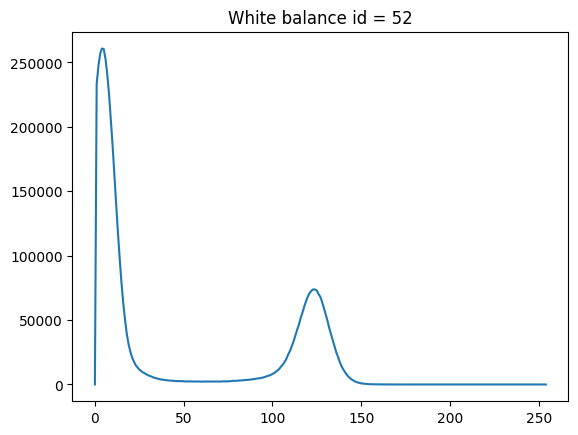

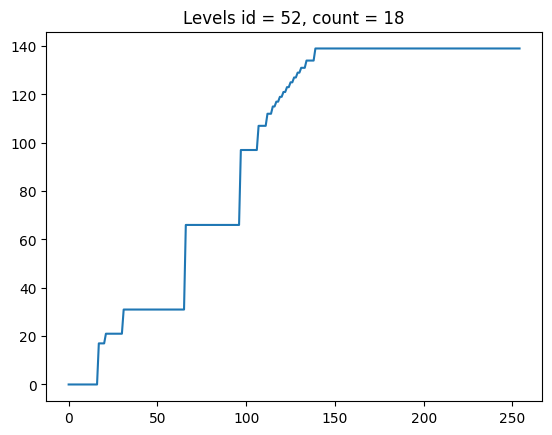

12
Start: 52
Progress: 0/100


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 1/100   Time has passed: 0m 11s    Remaining time: 1175 (19 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 2/100   Time has passed: 0m 26s    Remaining time: 1282 (21 min)
Progress: 3/100   Time has passed: 0m 38s    Remaining time: 1240 (20 min)
Progress: 4/100   Time has passed: 0m 52s    Remaining time: 1261 (21 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 5/100   Time has passed: 1m 6s    Remaining time: 1259 (20 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 6/100   Time has passed: 1m 18s    Remaining time: 1227 (20 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 7/100   Time has passed: 1m 32s    Remaining time: 1233 (20 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 8/100   Time has passed: 1m 47s    Remaining time: 1233 (20 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 9/100   Time has passed: 1m 58s    Remaining time: 1201 (20 min)
Progress: 10/100   Time has passed: 2m 12s    Remaining time: 1191 (19 min)
Progress: 11/100   Time has passed: 2m 26s    Remaining time: 1188 (19 min)
Progress: 12/100   Time has passed: 2m 38s    Remaining time: 1165 (19 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 13/100   Time has passed: 2m 53s    Remaining time: 1160 (19 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 14/100   Time has passed: 3m 10s    Remaining time: 1172 (19 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 15/100   Time has passed: 3m 33s    Remaining time: 1207 (20 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 16/100   Time has passed: 4m 5s    Remaining time: 1286 (21 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 17/100   Time has passed: 4m 47s    Remaining time: 1405 (23 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 18/100   Time has passed: 5m 28s    Remaining time: 1494 (24 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 19/100   Time has passed: 6m 23s    Remaining time: 1635 (27 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 20/100   Time has passed: 7m 35s    Remaining time: 1820 (30 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 21/100   Time has passed: 8m 27s    Remaining time: 1908 (31 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 22/100   Time has passed: 9m 33s    Remaining time: 2033 (33 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 23/100   Time has passed: 10m 40s    Remaining time: 2144 (35 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 24/100   Time has passed: 11m 45s    Remaining time: 2234 (37 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 25/100   Time has passed: 12m 50s    Remaining time: 2312 (38 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 26/100   Time has passed: 13m 51s    Remaining time: 2365 (39 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 27/100   Time has passed: 15m 7s    Remaining time: 2453 (40 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 28/100   Time has passed: 16m 26s    Remaining time: 2537 (42 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 29/100   Time has passed: 17m 39s    Remaining time: 2595 (43 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 30/100   Time has passed: 19m 7s    Remaining time: 2678 (44 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 31/100   Time has passed: 20m 38s    Remaining time: 2756 (45 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 32/100   Time has passed: 21m 59s    Remaining time: 2804 (46 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 33/100   Time has passed: 23m 38s    Remaining time: 2880 (48 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 34/100   Time has passed: 25m 21s    Remaining time: 2953 (49 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 35/100   Time has passed: 26m 58s    Remaining time: 3005 (50 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 36/100   Time has passed: 28m 59s    Remaining time: 3091 (51 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 37/100   Time has passed: 31m 2s    Remaining time: 3171 (52 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 38/100   Time has passed: 32m 43s    Remaining time: 3204 (53 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 39/100   Time has passed: 34m 47s    Remaining time: 3265 (54 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 40/100   Time has passed: 36m 44s    Remaining time: 3306 (55 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 41/100   Time has passed: 38m 34s    Remaining time: 3330 (55 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 42/100   Time has passed: 40m 50s    Remaining time: 3384 (56 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 43/100   Time has passed: 42m 54s    Remaining time: 3413 (56 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 44/100   Time has passed: 45m 10s    Remaining time: 3450 (57 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 45/100   Time has passed: 47m 31s    Remaining time: 3485 (58 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 46/100   Time has passed: 49m 35s    Remaining time: 3492 (58 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 47/100   Time has passed: 51m 46s    Remaining time: 3503 (58 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 48/100   Time has passed: 53m 58s    Remaining time: 3508 (58 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 49/100   Time has passed: 56m 8s    Remaining time: 3506 (58 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 50/100   Time has passed: 58m 34s    Remaining time: 3514 (58 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 51/100   Time has passed: 60m 47s    Remaining time: 3504 (58 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 52/100   Time has passed: 63m 12s    Remaining time: 3500 (58 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 53/100   Time has passed: 65m 30s    Remaining time: 3485 (58 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 54/100   Time has passed: 67m 48s    Remaining time: 3465 (57 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 55/100   Time has passed: 69m 45s    Remaining time: 3424 (57 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 56/100   Time has passed: 72m 4s    Remaining time: 3398 (56 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 57/100   Time has passed: 74m 23s    Remaining time: 3367 (56 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 58/100   Time has passed: 76m 17s    Remaining time: 3314 (55 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 59/100   Time has passed: 78m 13s    Remaining time: 3261 (54 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 60/100   Time has passed: 79m 56s    Remaining time: 3197 (53 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 61/100   Time has passed: 81m 33s    Remaining time: 3128 (52 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 62/100   Time has passed: 83m 6s    Remaining time: 3056 (50 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 63/100   Time has passed: 84m 28s    Remaining time: 2976 (49 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 64/100   Time has passed: 86m 4s    Remaining time: 2905 (48 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 65/100   Time has passed: 87m 43s    Remaining time: 2834 (47 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 66/100   Time has passed: 89m 6s    Remaining time: 2754 (45 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 67/100   Time has passed: 90m 40s    Remaining time: 2679 (44 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 68/100   Time has passed: 92m 24s    Remaining time: 2608 (43 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 69/100   Time has passed: 93m 37s    Remaining time: 2524 (42 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 70/100   Time has passed: 95m 6s    Remaining time: 2445 (40 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 71/100   Time has passed: 96m 34s    Remaining time: 2366 (39 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 72/100   Time has passed: 97m 44s    Remaining time: 2280 (38 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 73/100   Time has passed: 99m 5s    Remaining time: 2199 (36 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 74/100   Time has passed: 100m 14s    Remaining time: 2113 (35 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 75/100   Time has passed: 101m 16s    Remaining time: 2025 (33 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 76/100   Time has passed: 102m 30s    Remaining time: 1942 (32 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 77/100   Time has passed: 103m 34s    Remaining time: 1856 (30 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 78/100   Time has passed: 104m 24s    Remaining time: 1767 (29 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 79/100   Time has passed: 105m 15s    Remaining time: 1678 (27 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 80/100   Time has passed: 105m 58s    Remaining time: 1589 (26 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 81/100   Time has passed: 106m 35s    Remaining time: 1500 (25 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 82/100   Time has passed: 107m 10s    Remaining time: 1411 (23 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 83/100   Time has passed: 107m 37s    Remaining time: 1322 (22 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 84/100   Time has passed: 108m 8s    Remaining time: 1235 (20 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 85/100   Time has passed: 108m 27s    Remaining time: 1148 (19 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 86/100   Time has passed: 108m 42s    Remaining time: 1061 (17 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 87/100   Time has passed: 108m 56s    Remaining time: 976 (16 min)
Progress: 88/100   Time has passed: 109m 10s    Remaining time: 893 (14 min)
Progress: 89/100   Time has passed: 109m 22s    Remaining time: 811 (13 min)
Progress: 90/100   Time has passed: 109m 35s    Remaining time: 730 (12 min)
Progress: 91/100   Time has passed: 109m 48s    Remaining time: 651 (10 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 92/100   Time has passed: 110m 0s    Remaining time: 573 (9 min)
Progress: 93/100   Time has passed: 110m 14s    Remaining time: 497 (8 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 94/100   Time has passed: 110m 28s    Remaining time: 423 (7 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 95/100   Time has passed: 110m 40s    Remaining time: 349 (5 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 96/100   Time has passed: 110m 54s    Remaining time: 277 (4 min)
Progress: 97/100   Time has passed: 111m 8s    Remaining time: 206 (3 min)
Progress: 98/100   Time has passed: 111m 19s    Remaining time: 136 (2 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 99/100   Time has passed: 111m 34s    Remaining time: 67 (1 min)
Progress: 100/100   Time has passed: 111m 48s    Remaining time: 0 (0 min)
Finish: 52


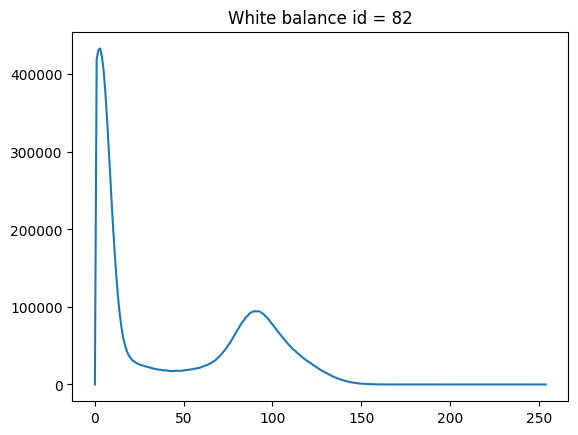

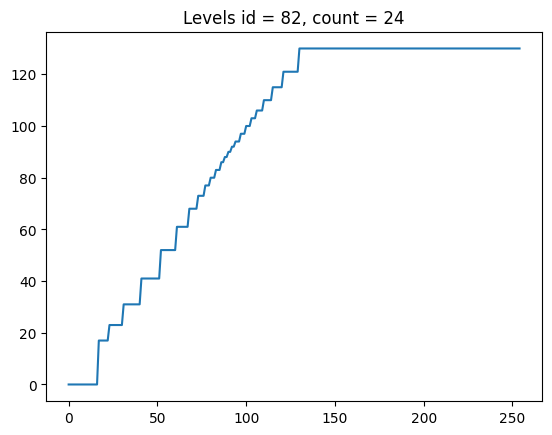

17
Start: 82
Progress: 0/100
Progress: 1/100   Time has passed: 0m 14s    Remaining time: 1442 (24 min)
Progress: 2/100   Time has passed: 0m 27s    Remaining time: 1366 (22 min)
Progress: 3/100   Time has passed: 0m 41s    Remaining time: 1347 (22 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 4/100   Time has passed: 0m 55s    Remaining time: 1339 (22 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 5/100   Time has passed: 1m 17s    Remaining time: 1481 (24 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 6/100   Time has passed: 1m 44s    Remaining time: 1643 (27 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 7/100   Time has passed: 2m 15s    Remaining time: 1798 (29 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 8/100   Time has passed: 2m 53s    Remaining time: 1992 (33 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 9/100   Time has passed: 3m 34s    Remaining time: 2164 (36 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 10/100   Time has passed: 4m 12s    Remaining time: 2275 (37 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 11/100   Time has passed: 4m 54s    Remaining time: 2383 (39 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 12/100   Time has passed: 5m 41s    Remaining time: 2501 (41 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 13/100   Time has passed: 6m 33s    Remaining time: 2634 (43 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 14/100   Time has passed: 7m 38s    Remaining time: 2815 (46 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 15/100   Time has passed: 8m 48s    Remaining time: 2994 (49 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 16/100   Time has passed: 9m 59s    Remaining time: 3147 (52 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 17/100   Time has passed: 11m 13s    Remaining time: 3288 (54 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 18/100   Time has passed: 12m 37s    Remaining time: 3453 (57 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 19/100   Time has passed: 14m 18s    Remaining time: 3659 (60 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 20/100   Time has passed: 15m 46s    Remaining time: 3786 (63 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 21/100   Time has passed: 17m 21s    Remaining time: 3918 (65 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 22/100   Time has passed: 18m 57s    Remaining time: 4033 (67 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 23/100   Time has passed: 20m 50s    Remaining time: 4187 (69 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 24/100   Time has passed: 22m 30s    Remaining time: 4277 (71 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 25/100   Time has passed: 24m 21s    Remaining time: 4385 (73 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 26/100   Time has passed: 26m 12s    Remaining time: 4476 (74 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 27/100   Time has passed: 28m 4s    Remaining time: 4554 (75 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 28/100   Time has passed: 29m 56s    Remaining time: 4620 (77 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 29/100   Time has passed: 31m 40s    Remaining time: 4652 (77 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 30/100   Time has passed: 34m 5s    Remaining time: 4773 (79 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 31/100   Time has passed: 36m 19s    Remaining time: 4850 (80 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 32/100   Time has passed: 38m 38s    Remaining time: 4926 (82 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 33/100   Time has passed: 41m 7s    Remaining time: 5009 (83 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 34/100   Time has passed: 43m 37s    Remaining time: 5081 (84 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 35/100   Time has passed: 45m 53s    Remaining time: 5113 (85 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 36/100   Time has passed: 48m 17s    Remaining time: 5150 (85 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 37/100   Time has passed: 50m 40s    Remaining time: 5177 (86 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 38/100   Time has passed: 53m 12s    Remaining time: 5208 (86 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 39/100   Time has passed: 55m 37s    Remaining time: 5220 (87 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 40/100   Time has passed: 58m 8s    Remaining time: 5233 (87 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 41/100   Time has passed: 60m 40s    Remaining time: 5239 (87 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 42/100   Time has passed: 63m 9s    Remaining time: 5233 (87 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 43/100   Time has passed: 65m 37s    Remaining time: 5218 (86 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 44/100   Time has passed: 67m 48s    Remaining time: 5178 (86 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 45/100   Time has passed: 70m 22s    Remaining time: 5160 (86 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 46/100   Time has passed: 72m 31s    Remaining time: 5107 (85 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 47/100   Time has passed: 74m 43s    Remaining time: 5055 (84 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 48/100   Time has passed: 77m 17s    Remaining time: 5023 (83 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 49/100   Time has passed: 79m 44s    Remaining time: 4979 (82 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 50/100   Time has passed: 82m 24s    Remaining time: 4944 (82 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 51/100   Time has passed: 84m 52s    Remaining time: 4892 (81 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 52/100   Time has passed: 87m 29s    Remaining time: 4845 (80 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 53/100   Time has passed: 89m 45s    Remaining time: 4775 (79 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 54/100   Time has passed: 92m 11s    Remaining time: 4712 (78 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 55/100   Time has passed: 94m 34s    Remaining time: 4643 (77 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 56/100   Time has passed: 97m 3s    Remaining time: 4575 (76 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 57/100   Time has passed: 99m 15s    Remaining time: 4492 (74 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 58/100   Time has passed: 101m 26s    Remaining time: 4407 (73 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 59/100   Time has passed: 103m 48s    Remaining time: 4328 (72 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 60/100   Time has passed: 106m 3s    Remaining time: 4242 (70 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 61/100   Time has passed: 108m 26s    Remaining time: 4159 (69 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 62/100   Time has passed: 110m 55s    Remaining time: 4078 (67 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 63/100   Time has passed: 113m 34s    Remaining time: 4002 (66 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 64/100   Time has passed: 116m 1s    Remaining time: 3915 (65 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 65/100   Time has passed: 118m 17s    Remaining time: 3821 (63 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 66/100   Time has passed: 120m 29s    Remaining time: 3724 (62 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 67/100   Time has passed: 122m 52s    Remaining time: 3631 (60 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 68/100   Time has passed: 125m 9s    Remaining time: 3533 (58 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 69/100   Time has passed: 127m 19s    Remaining time: 3432 (57 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 70/100   Time has passed: 129m 35s    Remaining time: 3332 (55 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 71/100   Time has passed: 132m 3s    Remaining time: 3236 (53 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 72/100   Time has passed: 134m 7s    Remaining time: 3129 (52 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 73/100   Time has passed: 136m 11s    Remaining time: 3022 (50 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 74/100   Time has passed: 138m 18s    Remaining time: 2915 (48 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 75/100   Time has passed: 140m 20s    Remaining time: 2806 (46 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 76/100   Time has passed: 142m 20s    Remaining time: 2696 (44 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 77/100   Time has passed: 144m 9s    Remaining time: 2583 (43 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 78/100   Time has passed: 145m 53s    Remaining time: 2468 (41 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 79/100   Time has passed: 147m 29s    Remaining time: 2352 (39 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 80/100   Time has passed: 148m 50s    Remaining time: 2232 (37 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 81/100   Time has passed: 150m 25s    Remaining time: 2117 (35 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 82/100   Time has passed: 151m 51s    Remaining time: 1999 (33 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 83/100   Time has passed: 153m 9s    Remaining time: 1882 (31 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 84/100   Time has passed: 154m 23s    Remaining time: 1764 (29 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 85/100   Time has passed: 155m 37s    Remaining time: 1647 (27 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 86/100   Time has passed: 156m 51s    Remaining time: 1532 (25 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 87/100   Time has passed: 157m 59s    Remaining time: 1416 (23 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 88/100   Time has passed: 158m 57s    Remaining time: 1300 (21 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 89/100   Time has passed: 159m 54s    Remaining time: 1185 (19 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 90/100   Time has passed: 160m 44s    Remaining time: 1071 (17 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 91/100   Time has passed: 161m 27s    Remaining time: 958 (15 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 92/100   Time has passed: 162m 4s    Remaining time: 845 (14 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 93/100   Time has passed: 162m 37s    Remaining time: 734 (12 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 94/100   Time has passed: 163m 1s    Remaining time: 624 (10 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 95/100   Time has passed: 163m 28s    Remaining time: 516 (8 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 96/100   Time has passed: 163m 50s    Remaining time: 409 (6 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 97/100   Time has passed: 164m 9s    Remaining time: 304 (5 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 98/100   Time has passed: 164m 23s    Remaining time: 201 (3 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide


Progress: 99/100   Time has passed: 164m 37s    Remaining time: 99 (1 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipyke

Progress: 100/100   Time has passed: 164m 51s    Remaining time: 0 (0 min)
Finish: 82


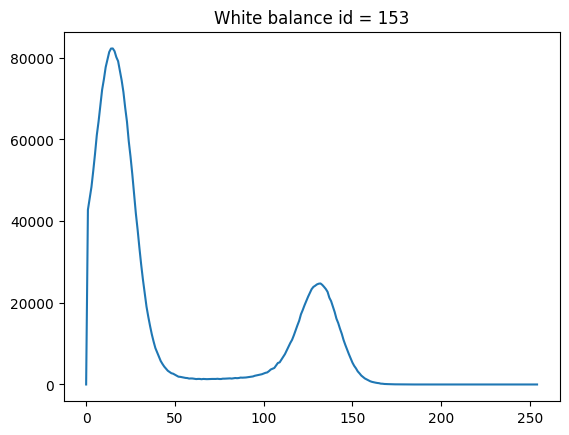

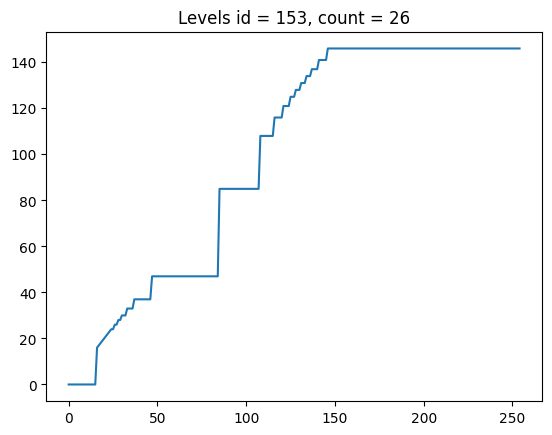

10
Start: 153
Progress: 0/100


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 1/100   Time has passed: 1m 58s    Remaining time: 11768 (196 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 2/100   Time has passed: 3m 46s    Remaining time: 11097 (184 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 3/100   Time has passed: 5m 49s    Remaining time: 11299 (188 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 4/100   Time has passed: 7m 54s    Remaining time: 11377 (189 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 5/100   Time has passed: 9m 42s    Remaining time: 11068 (184 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 6/100   Time has passed: 11m 55s    Remaining time: 11204 (186 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 7/100   Time has passed: 13m 43s    Remaining time: 10946 (182 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 8/100   Time has passed: 15m 24s    Remaining time: 10636 (177 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 9/100   Time has passed: 17m 10s    Remaining time: 10418 (173 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 10/100   Time has passed: 19m 1s    Remaining time: 10277 (171 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/i

Progress: 11/100   Time has passed: 20m 35s    Remaining time: 9999 (166 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 12/100   Time has passed: 22m 43s    Remaining time: 10002 (166 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 13/100   Time has passed: 24m 22s    Remaining time: 9785 (163 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 14/100   Time has passed: 26m 1s    Remaining time: 9591 (159 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 15/100   Time has passed: 27m 45s    Remaining time: 9437 (157 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 16/100   Time has passed: 29m 33s    Remaining time: 9310 (155 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 17/100   Time has passed: 31m 19s    Remaining time: 9176 (152 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 18/100   Time has passed: 33m 32s    Remaining time: 9167 (152 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 19/100   Time has passed: 35m 26s    Remaining time: 9064 (151 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 20/100   Time has passed: 37m 15s    Remaining time: 8940 (149 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 21/100   Time has passed: 39m 5s    Remaining time: 8823 (147 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 22/100   Time has passed: 41m 17s    Remaining time: 8783 (146 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 23/100   Time has passed: 43m 12s    Remaining time: 8679 (144 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 24/100   Time has passed: 45m 26s    Remaining time: 8632 (143 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 25/100   Time has passed: 47m 35s    Remaining time: 8566 (142 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 26/100   Time has passed: 49m 23s    Remaining time: 8434 (140 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 27/100   Time has passed: 51m 18s    Remaining time: 8324 (138 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 28/100   Time has passed: 53m 14s    Remaining time: 8214 (136 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 29/100   Time has passed: 55m 20s    Remaining time: 8130 (135 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 30/100   Time has passed: 57m 50s    Remaining time: 8097 (134 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 31/100   Time has passed: 59m 48s    Remaining time: 7987 (133 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 32/100   Time has passed: 61m 32s    Remaining time: 7847 (130 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 33/100   Time has passed: 63m 33s    Remaining time: 7742 (129 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 34/100   Time has passed: 65m 33s    Remaining time: 7634 (127 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 35/100   Time has passed: 67m 25s    Remaining time: 7513 (125 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 36/100   Time has passed: 70m 2s    Remaining time: 7471 (124 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 37/100   Time has passed: 71m 55s    Remaining time: 7347 (122 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 38/100   Time has passed: 73m 49s    Remaining time: 7227 (120 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 39/100   Time has passed: 76m 1s    Remaining time: 7134 (118 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 40/100   Time has passed: 78m 4s    Remaining time: 7026 (117 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 41/100   Time has passed: 80m 13s    Remaining time: 6927 (115 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 42/100   Time has passed: 82m 33s    Remaining time: 6840 (114 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 43/100   Time has passed: 84m 23s    Remaining time: 6711 (111 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 44/100   Time has passed: 86m 8s    Remaining time: 6577 (109 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 45/100   Time has passed: 88m 13s    Remaining time: 6470 (107 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 46/100   Time has passed: 90m 7s    Remaining time: 6347 (105 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 47/100   Time has passed: 91m 59s    Remaining time: 6224 (103 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 48/100   Time has passed: 94m 26s    Remaining time: 6138 (102 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 49/100   Time has passed: 96m 32s    Remaining time: 6028 (100 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 50/100   Time has passed: 98m 24s    Remaining time: 5904 (98 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 51/100   Time has passed: 100m 32s    Remaining time: 5795 (96 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 52/100   Time has passed: 102m 32s    Remaining time: 5678 (94 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 53/100   Time has passed: 105m 2s    Remaining time: 5588 (93 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 54/100   Time has passed: 107m 14s    Remaining time: 5481 (91 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 55/100   Time has passed: 109m 13s    Remaining time: 5362 (89 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 56/100   Time has passed: 110m 56s    Remaining time: 5230 (87 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 57/100   Time has passed: 113m 1s    Remaining time: 5115 (85 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 58/100   Time has passed: 114m 57s    Remaining time: 4995 (83 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 59/100   Time has passed: 117m 18s    Remaining time: 4891 (81 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 60/100   Time has passed: 119m 23s    Remaining time: 4775 (79 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 61/100   Time has passed: 121m 21s    Remaining time: 4655 (77 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 62/100   Time has passed: 123m 9s    Remaining time: 4528 (75 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 63/100   Time has passed: 125m 7s    Remaining time: 4409 (73 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 64/100   Time has passed: 127m 10s    Remaining time: 4292 (71 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 65/100   Time has passed: 129m 27s    Remaining time: 4182 (69 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 66/100   Time has passed: 131m 23s    Remaining time: 4061 (67 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 67/100   Time has passed: 133m 34s    Remaining time: 3947 (65 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 68/100   Time has passed: 135m 27s    Remaining time: 3824 (63 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 69/100   Time has passed: 137m 17s    Remaining time: 3701 (61 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 70/100   Time has passed: 139m 3s    Remaining time: 3575 (59 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 71/100   Time has passed: 141m 23s    Remaining time: 3465 (57 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 72/100   Time has passed: 143m 15s    Remaining time: 3342 (55 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 73/100   Time has passed: 145m 0s    Remaining time: 3217 (53 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 74/100   Time has passed: 146m 45s    Remaining time: 3093 (51 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 75/100   Time has passed: 148m 41s    Remaining time: 2973 (49 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 76/100   Time has passed: 150m 34s    Remaining time: 2853 (47 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 77/100   Time has passed: 152m 53s    Remaining time: 2740 (45 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 78/100   Time has passed: 154m 32s    Remaining time: 2615 (43 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 79/100   Time has passed: 156m 24s    Remaining time: 2494 (41 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 80/100   Time has passed: 158m 13s    Remaining time: 2373 (39 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 81/100   Time has passed: 160m 4s    Remaining time: 2252 (37 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 82/100   Time has passed: 161m 46s    Remaining time: 2130 (35 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 83/100   Time has passed: 163m 53s    Remaining time: 2014 (33 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 84/100   Time has passed: 165m 47s    Remaining time: 1894 (31 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 85/100   Time has passed: 167m 35s    Remaining time: 1774 (29 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 86/100   Time has passed: 169m 21s    Remaining time: 1654 (27 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 87/100   Time has passed: 170m 59s    Remaining time: 1533 (25 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 88/100   Time has passed: 172m 51s    Remaining time: 1414 (23 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 89/100   Time has passed: 174m 49s    Remaining time: 1296 (21 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 90/100   Time has passed: 176m 36s    Remaining time: 1177 (19 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 91/100   Time has passed: 178m 24s    Remaining time: 1058 (17 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 92/100   Time has passed: 180m 12s    Remaining time: 940 (15 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 93/100   Time has passed: 182m 0s    Remaining time: 821 (13 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 94/100   Time has passed: 183m 43s    Remaining time: 703 (11 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 95/100   Time has passed: 185m 51s    Remaining time: 586 (9 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 96/100   Time has passed: 187m 35s    Remaining time: 468 (7 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 97/100   Time has passed: 189m 25s    Remaining time: 351 (5 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 98/100   Time has passed: 191m 13s    Remaining time: 234 (3 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 99/100   Time has passed: 193m 16s    Remaining time: 117 (1 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 100/100   Time has passed: 195m 26s    Remaining time: 0 (0 min)
Finish: 153


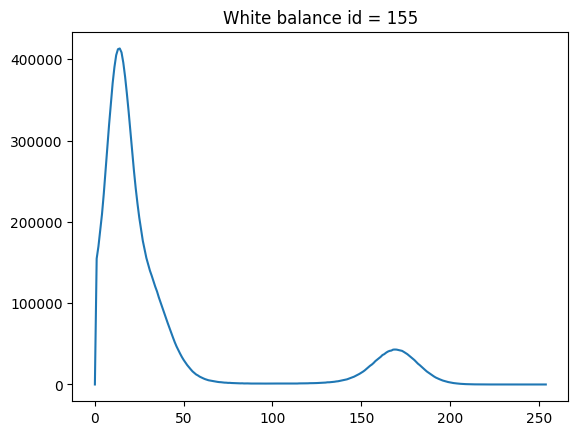

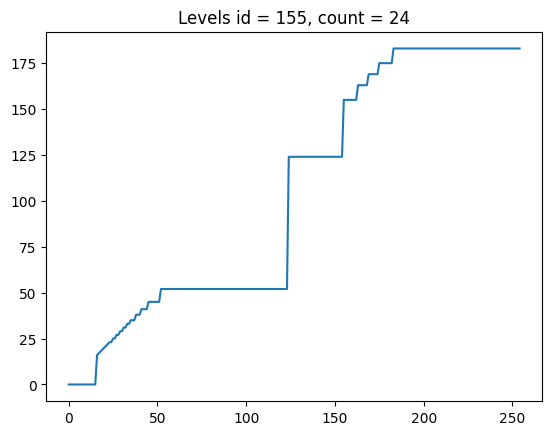

16
Start: 155
Progress: 0/100


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 1/100   Time has passed: 4m 29s    Remaining time: 26670 (444 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 2/100   Time has passed: 9m 55s    Remaining time: 29169 (486 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 3/100   Time has passed: 15m 13s    Remaining time: 29535 (492 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 4/100   Time has passed: 20m 57s    Remaining time: 30172 (502 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 5/100   Time has passed: 26m 29s    Remaining time: 30202 (503 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 6/100   Time has passed: 32m 36s    Remaining time: 30650 (510 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 7/100   Time has passed: 38m 45s    Remaining time: 30893 (514 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 8/100   Time has passed: 44m 22s    Remaining time: 30622 (510 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 9/100   Time has passed: 50m 2s    Remaining time: 30354 (505 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 10/100   Time has passed: 55m 42s    Remaining time: 30084 (501 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 11/100   Time has passed: 61m 50s    Remaining time: 30020 (500 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 12/100   Time has passed: 67m 41s    Remaining time: 29786 (496 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 13/100   Time has passed: 73m 23s    Remaining time: 29468 (491 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 14/100   Time has passed: 79m 25s    Remaining time: 29274 (487 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 15/100   Time has passed: 86m 2s    Remaining time: 29256 (487 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 16/100   Time has passed: 91m 56s    Remaining time: 28959 (482 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 17/100   Time has passed: 97m 54s    Remaining time: 28679 (477 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 18/100   Time has passed: 104m 3s    Remaining time: 28442 (474 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 19/100   Time has passed: 109m 40s    Remaining time: 28055 (467 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 20/100   Time has passed: 115m 57s    Remaining time: 27829 (463 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 21/100   Time has passed: 121m 26s    Remaining time: 27409 (456 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 22/100   Time has passed: 127m 42s    Remaining time: 27167 (452 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 23/100   Time has passed: 133m 40s    Remaining time: 26852 (447 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 24/100   Time has passed: 140m 3s    Remaining time: 26611 (443 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 25/100   Time has passed: 146m 36s    Remaining time: 26388 (439 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 26/100   Time has passed: 153m 6s    Remaining time: 26146 (435 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 27/100   Time has passed: 159m 37s    Remaining time: 25893 (431 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 28/100   Time has passed: 166m 18s    Remaining time: 25659 (427 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 29/100   Time has passed: 172m 14s    Remaining time: 25300 (421 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 30/100   Time has passed: 178m 18s    Remaining time: 24962 (416 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 31/100   Time has passed: 184m 9s    Remaining time: 24594 (409 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 32/100   Time has passed: 190m 35s    Remaining time: 24299 (404 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 33/100   Time has passed: 196m 43s    Remaining time: 23965 (399 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 34/100   Time has passed: 203m 34s    Remaining time: 23710 (395 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 35/100   Time has passed: 211m 28s    Remaining time: 23563 (392 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 36/100   Time has passed: 219m 26s    Remaining time: 23407 (390 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 37/100   Time has passed: 227m 31s    Remaining time: 23243 (387 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 38/100   Time has passed: 235m 29s    Remaining time: 23053 (384 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 39/100   Time has passed: 244m 14s    Remaining time: 22921 (382 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 40/100   Time has passed: 253m 9s    Remaining time: 22784 (379 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 41/100   Time has passed: 261m 26s    Remaining time: 22573 (376 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 42/100   Time has passed: 269m 41s    Remaining time: 22345 (372 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 43/100   Time has passed: 278m 43s    Remaining time: 22168 (369 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 44/100   Time has passed: 287m 23s    Remaining time: 21946 (365 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/

Progress: 45/100   Time has passed: 296m 56s    Remaining time: 21775 (362 min)


/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: invalid value encountered in scalar divide
/tmp/ipykernel_18032/2234421893.py:192: RuntimeWarning: divide by zero encountered in scalar divide


In [ ]:
for i in range(len(id_rock)):
    Rock_filter(my_Rocks[i])

In [ ]:
import cv2
import numpy as np

my_photo = cv2.imread('/home/pc-burevestnik/PochRock_v2/Rock_Base_2/Uric acid/Pure uric acid/Stone 2/Stone_2_100900_filtered.png')
img_grey = cv2.cvtColor(my_photo,cv2.COLOR_BGR2GRAY)

rows = img_grey.shape[0]
circles = cv2.HoughCircles(img_grey, cv2.HOUGH_GRADIENT, 1, rows / 8,
                          param1=200, param2=1,
                          minRadius=200, maxRadius=600)
step = 1
old_radius = 1000
while step>0:
    mask = np.zeros(img_grey.shape)
    mask_all_pix = 0
    mask_black_pix = 0
    print(step)
    step += 1
    i = 2
    circles = cv2.HoughCircles(img_grey, cv2.HOUGH_GRADIENT, 1, rows / 8,
                          param1=200, param2=1,
                          minRadius=200, maxRadius=600)
    while(len(circles[0]) > 1):
        i += 1
        circles = cv2.HoughCircles(img_grey, cv2.HOUGH_GRADIENT, 1, rows / 8,
                            param1=200, param2=i,
                            minRadius=200, maxRadius=600)
        
    #print(i)
    

    res = np.zeros(my_photo.shape)
    if circles is not None:
        circles = np.uint16(np.around(circles))
        for i in circles[0, :]:
            center = (i[0], i[1])
            radius = i[2]
            cv2.circle(mask, center, radius, 255, 5)

            for x in range(mask.shape[0]):
                for y in range(mask.shape[1]):
                    if mask[x,y] == 255:
                        mask_all_pix += 1
                        if img_grey[x,y] == 0:
                            mask_black_pix += 1
            
            print("black/all : " + str(mask_black_pix/mask_all_pix))
            print(radius,old_radius)
            if old_radius != 1000:
                print("old/new radius : " + str(min(old_radius/radius, radius/old_radius)))
                if min(old_radius/radius, radius/old_radius) < 0.9 and mask_black_pix/mask_all_pix < 0.6:
                    step = 0
                    break
                
            old_radius = radius
            
            if step != 0:
                cv2.circle(img_grey, center, radius, 0, 10)
    else:
        break

    # if step%10 == 0:
    #     cv2.imshow('origin', img_grey) # выводим итоговое изображение в окно
    #     # cv2.imshow('res', res) # выводим итоговое изображение в окно

    #     cv2.waitKey()
    #     cv2.destroyAllWindows()

cv2.imshow('origin', img_grey) # выводим итоговое изображение в окно
# cv2.imshow('res', res) # выводим итоговое изображение в окно

cv2.waitKey()
cv2.destroyAllWindows()

1
black/all : 0.3753957485300769
405 1000
2
black/all : 0.5718576709796673
400 405
old/new radius : 0.9876543209876543
3


# Программа для сравнения средних серостей камней

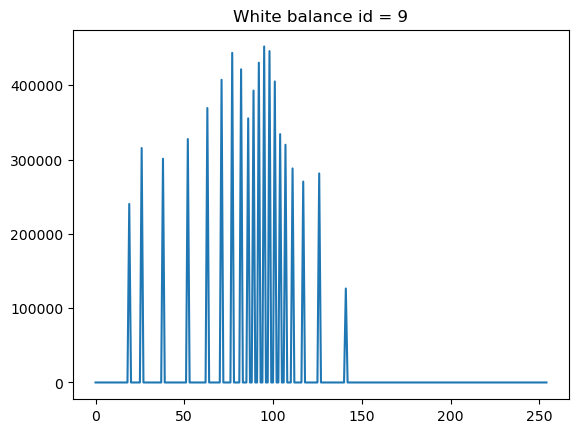

19
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 238 239 240 241 242 243 244 245

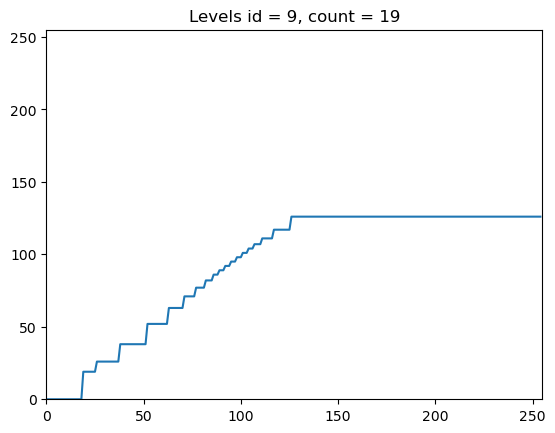

[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0  19  19  19  19  19  19  19  26  26  26  26  26  26  26  26  26  26
  26  26  38  38  38  38  38  38  38  38  38  38  38  38  38  38  52  52
  52  52  52  52  52  52  52  52  52  63  63  63  63  63  63  63  63  71
  71  71  71  71  71  77  77  77  77  77  82  82  82  82  86  86  86  89
  89  89  92  92  92  95  95  95  98  98  98 101 101 101 104 104 104 107
 107 107 107 111 111 111 111 111 111 117 117 117 117 117 117 117 117 117
 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
 126 126 126 126 126 126 126 126 126 126 126 126 12

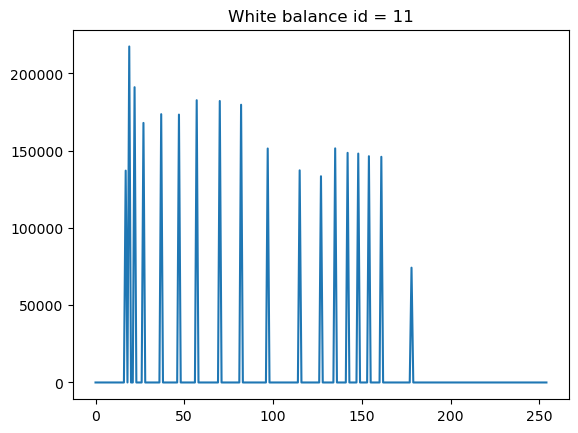

18
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 238 239 240 241 242 243 244 245

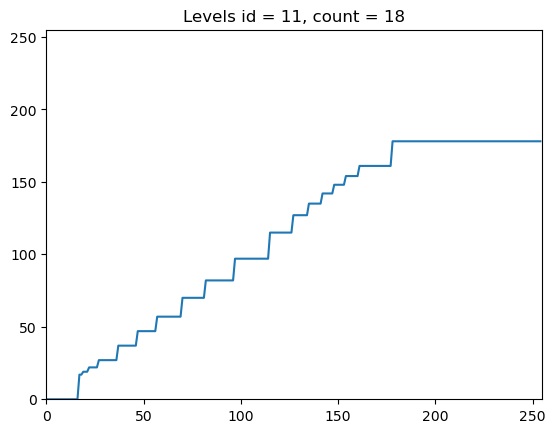

[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0  17
  17  19  19  19  22  22  22  22  22  27  27  27  27  27  27  27  27  27
  27  37  37  37  37  37  37  37  37  37  37  47  47  47  47  47  47  47
  47  47  47  57  57  57  57  57  57  57  57  57  57  57  57  57  70  70
  70  70  70  70  70  70  70  70  70  70  82  82  82  82  82  82  82  82
  82  82  82  82  82  82  82  97  97  97  97  97  97  97  97  97  97  97
  97  97  97  97  97  97  97 115 115 115 115 115 115 115 115 115 115 115
 115 127 127 127 127 127 127 127 127 135 135 135 135 135 135 135 142 142
 142 142 142 142 148 148 148 148 148 148 154 154 154 154 154 154 154 161
 161 161 161 161 161 161 161 161 161 161 161 161 161 161 161 161 178 178
 178 178 178 178 178 178 178 178 178 178 178 178 178 178 178 178 178 178
 178 178 178 178 178 178 178 178 178 178 178 178 178 178 178 178 178 178
 178 178 178 178 178 178 178 178 178 178 178 178 178 178 178 178 178 178
 178 178 178 178 178 178 178 178 178 178 178 178 17

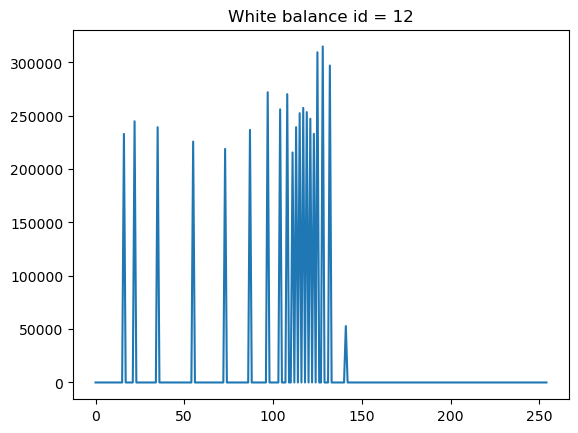

19
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 238 239 240 241 242 243 244 245

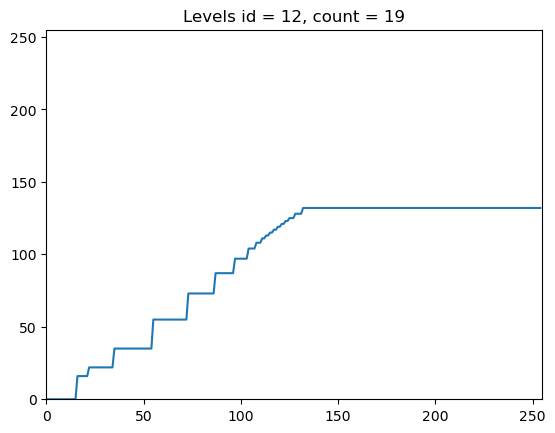

[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0  16  16
  16  16  16  16  22  22  22  22  22  22  22  22  22  22  22  22  22  35
  35  35  35  35  35  35  35  35  35  35  35  35  35  35  35  35  35  35
  35  55  55  55  55  55  55  55  55  55  55  55  55  55  55  55  55  55
  55  73  73  73  73  73  73  73  73  73  73  73  73  73  73  87  87  87
  87  87  87  87  87  87  87  97  97  97  97  97  97  97 104 104 104 104
 108 108 108 111 111 113 113 115 115 117 117 119 119 121 121 123 123 125
 125 125 128 128 128 128 132 132 132 132 132 132 132 132 132 132 132 132
 132 132 132 132 132 132 132 132 132 132 132 132 132 132 132 132 132 132
 132 132 132 132 132 132 132 132 132 132 132 132 132 132 132 132 132 132
 132 132 132 132 132 132 132 132 132 132 132 132 132 132 132 132 132 132
 132 132 132 132 132 132 132 132 132 132 132 132 132 132 132 132 132 132
 132 132 132 132 132 132 132 132 132 132 132 132 132 132 132 132 132 132
 132 132 132 132 132 132 132 132 132 132 132 132 13

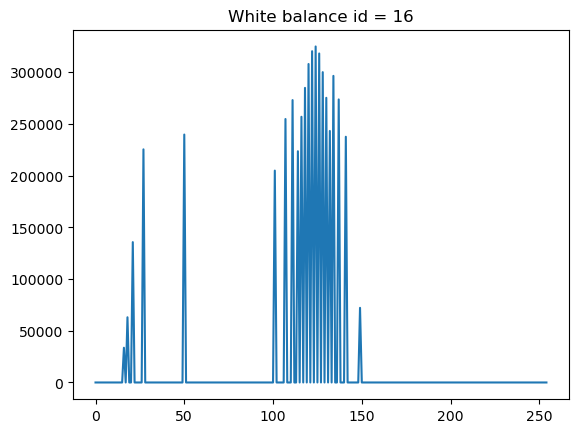

19
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 238 239 240 241 242 243 244 245

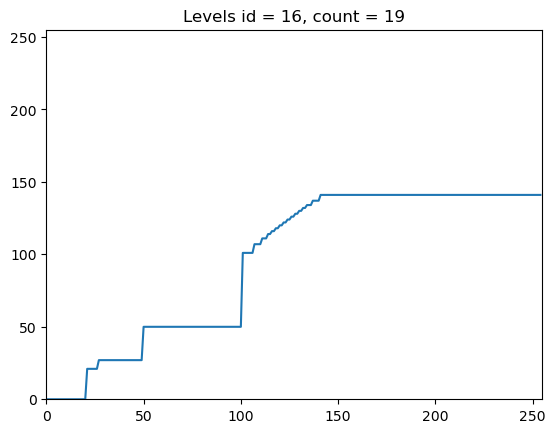

[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0  21  21  21  21  21  21  27  27  27  27  27  27  27  27  27
  27  27  27  27  27  27  27  27  27  27  27  27  27  27  50  50  50  50
  50  50  50  50  50  50  50  50  50  50  50  50  50  50  50  50  50  50
  50  50  50  50  50  50  50  50  50  50  50  50  50  50  50  50  50  50
  50  50  50  50  50  50  50  50  50  50  50 101 101 101 101 101 101 107
 107 107 107 111 111 111 114 114 116 116 118 118 120 120 122 122 124 124
 126 126 128 128 130 130 132 132 134 134 134 137 137 137 137 141 141 141
 141 141 141 141 141 141 141 141 141 141 141 141 141 141 141 141 141 141
 141 141 141 141 141 141 141 141 141 141 141 141 141 141 141 141 141 141
 141 141 141 141 141 141 141 141 141 141 141 141 141 141 141 141 141 141
 141 141 141 141 141 141 141 141 141 141 141 141 141 141 141 141 141 141
 141 141 141 141 141 141 141 141 141 141 141 141 141 141 141 141 141 141
 141 141 141 141 141 141 141 141 141 141 141 141 14

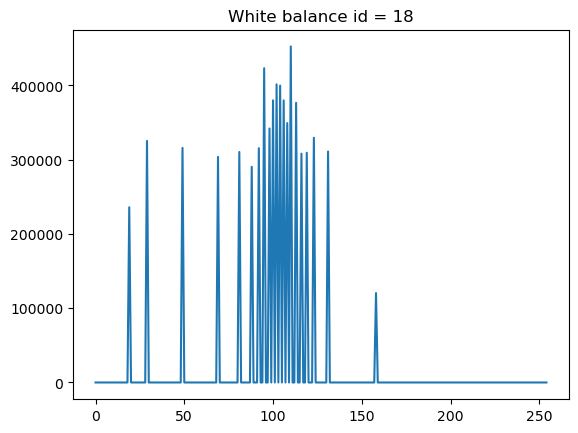

20
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 238 239 240 241 242 243 244 245

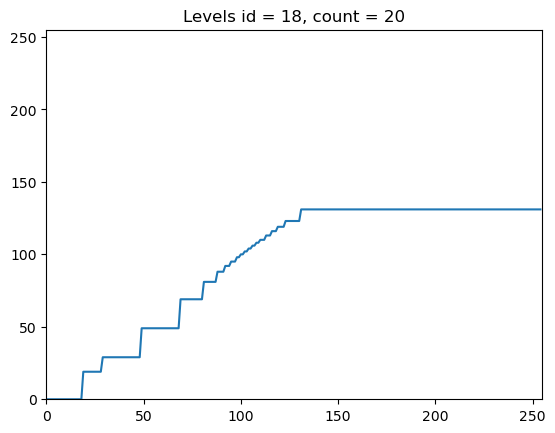

[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0  19  19  19  19  19  19  19  19  19  19  29  29  29  29  29  29  29
  29  29  29  29  29  29  29  29  29  29  29  29  29  49  49  49  49  49
  49  49  49  49  49  49  49  49  49  49  49  49  49  49  49  69  69  69
  69  69  69  69  69  69  69  69  69  81  81  81  81  81  81  81  88  88
  88  88  92  92  92  95  95  95  98  98 100 100 102 102 104 104 106 106
 108 108 110 110 110 113 113 113 116 116 116 119 119 119 119 123 123 123
 123 123 123 123 123 131 131 131 131 131 131 131 131 131 131 131 131 131
 131 131 131 131 131 131 131 131 131 131 131 131 131 131 131 131 131 131
 131 131 131 131 131 131 131 131 131 131 131 131 131 131 131 131 131 131
 131 131 131 131 131 131 131 131 131 131 131 131 131 131 131 131 131 131
 131 131 131 131 131 131 131 131 131 131 131 131 131 131 131 131 131 131
 131 131 131 131 131 131 131 131 131 131 131 131 131 131 131 131 131 131
 131 131 131 131 131 131 131 131 131 131 131 131 13

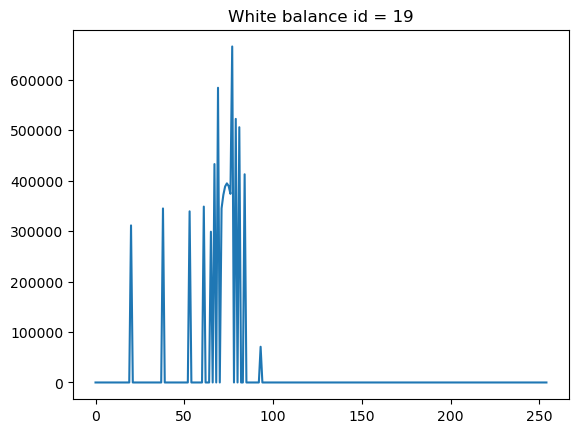

17
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 238 239 240 241 242 243 244 245

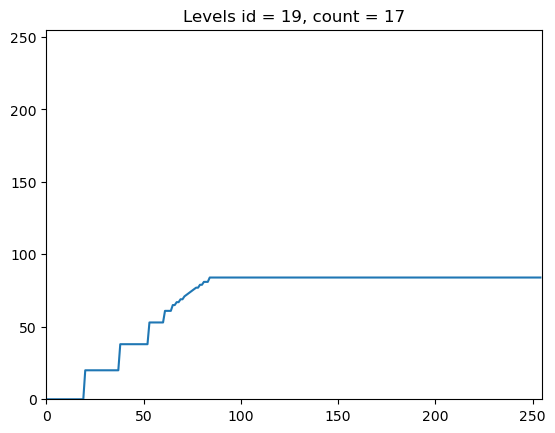

[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 20 20 20 20
 20 20 20 20 20 20 20 20 20 20 20 20 20 20 38 38 38 38 38 38 38 38 38 38
 38 38 38 38 38 53 53 53 53 53 53 53 53 61 61 61 61 65 65 67 67 69 69 71
 72 73 74 75 76 77 77 79 79 81 81 81 84 84 84 84 84 84 84 84 84 84 84 84
 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84
 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84
 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84
 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84
 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84
 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84
 84 84 84 84 84 84 84 84 84 84 84 84 84 84 84]


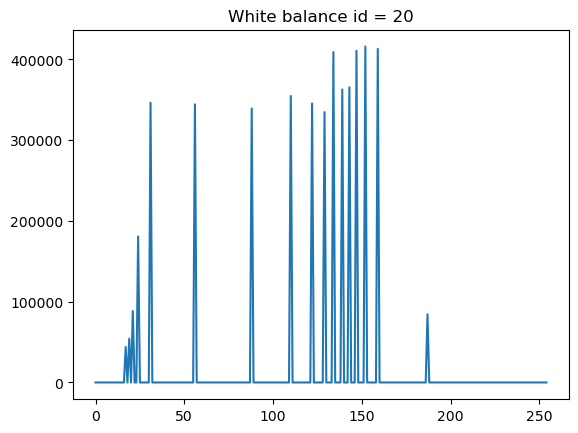

14
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 238 239 240 241 242 243 244 245

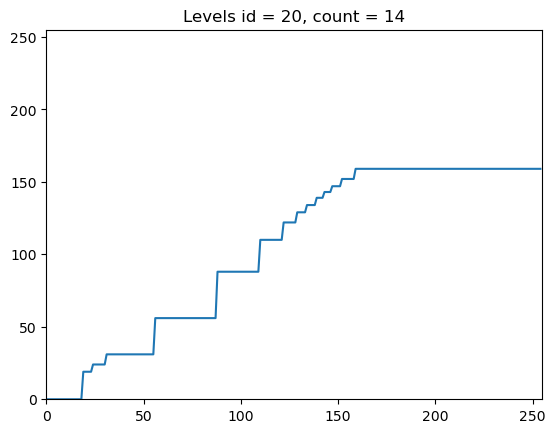

[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0  19  19  19  19  19  24  24  24  24  24  24  24  31  31  31  31  31
  31  31  31  31  31  31  31  31  31  31  31  31  31  31  31  31  31  31
  31  31  56  56  56  56  56  56  56  56  56  56  56  56  56  56  56  56
  56  56  56  56  56  56  56  56  56  56  56  56  56  56  56  56  88  88
  88  88  88  88  88  88  88  88  88  88  88  88  88  88  88  88  88  88
  88  88 110 110 110 110 110 110 110 110 110 110 110 110 122 122 122 122
 122 122 122 129 129 129 129 129 134 134 134 134 134 139 139 139 139 143
 143 143 143 147 147 147 147 147 152 152 152 152 152 152 152 159 159 159
 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159
 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159
 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159
 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159 159
 159 159 159 159 159 159 159 159 159 159 159 159 15

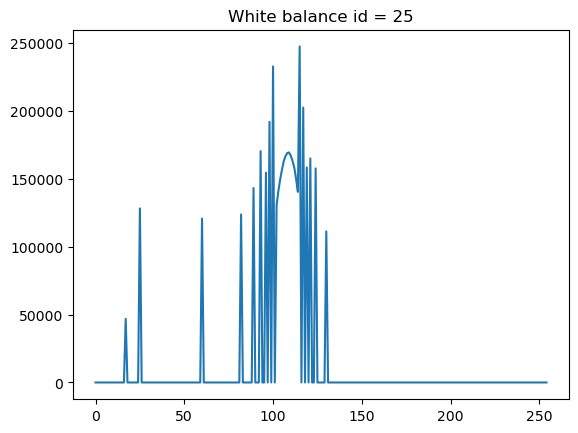

27
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 238 239 240 241 242 243 244 245

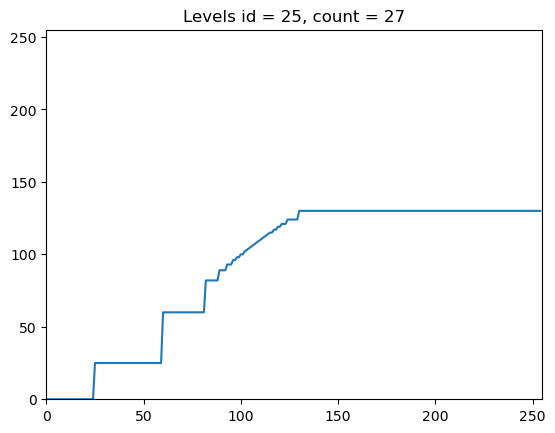

[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0  25  25  25  25  25  25  25  25  25  25  25
  25  25  25  25  25  25  25  25  25  25  25  25  25  25  25  25  25  25
  25  25  25  25  25  25  60  60  60  60  60  60  60  60  60  60  60  60
  60  60  60  60  60  60  60  60  60  60  82  82  82  82  82  82  82  89
  89  89  89  93  93  93  96  96  98  98 100 100 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 115 117 117 119 119 121 121 121 124 124
 124 124 124 124 130 130 130 130 130 130 130 130 130 130 130 130 130 130
 130 130 130 130 130 130 130 130 130 130 130 130 130 130 130 130 130 130
 130 130 130 130 130 130 130 130 130 130 130 130 130 130 130 130 130 130
 130 130 130 130 130 130 130 130 130 130 130 130 130 130 130 130 130 130
 130 130 130 130 130 130 130 130 130 130 130 130 130 130 130 130 130 130
 130 130 130 130 130 130 130 130 130 130 130 130 130 130 130 130 130 130
 130 130 130 130 130 130 130 130 130 130 130 130 13

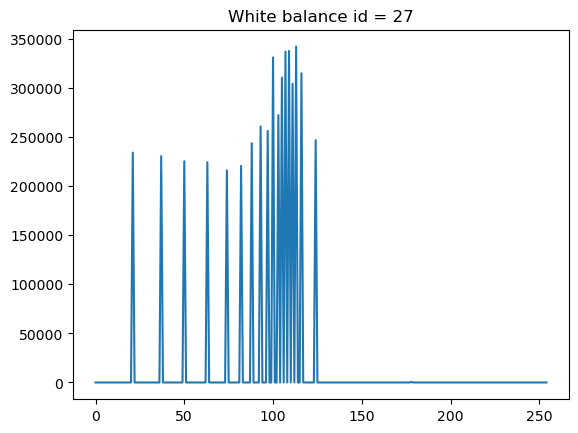

18
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 238 239 240 241 242 243 244 245

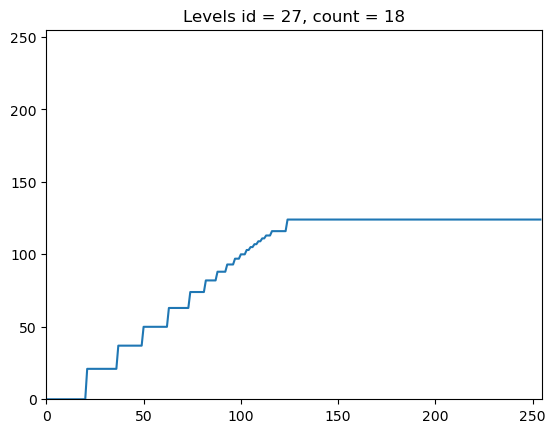

[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0  21  21  21  21  21  21  21  21  21  21  21  21  21  21  21
  21  37  37  37  37  37  37  37  37  37  37  37  37  37  50  50  50  50
  50  50  50  50  50  50  50  50  50  63  63  63  63  63  63  63  63  63
  63  63  74  74  74  74  74  74  74  74  82  82  82  82  82  82  88  88
  88  88  88  93  93  93  93  97  97  97 100 100 100 103 103 105 105 107
 107 109 109 111 111 113 113 113 116 116 116 116 116 116 116 116 124 124
 124 124 124 124 124 124 124 124 124 124 124 124 124 124 124 124 124 124
 124 124 124 124 124 124 124 124 124 124 124 124 124 124 124 124 124 124
 124 124 124 124 124 124 124 124 124 124 124 124 124 124 124 124 124 124
 124 124 124 124 124 124 124 124 124 124 124 124 124 124 124 124 124 124
 124 124 124 124 124 124 124 124 124 124 124 124 124 124 124 124 124 124
 124 124 124 124 124 124 124 124 124 124 124 124 124 124 124 124 124 124
 124 124 124 124 124 124 124 124 124 124 124 124 12

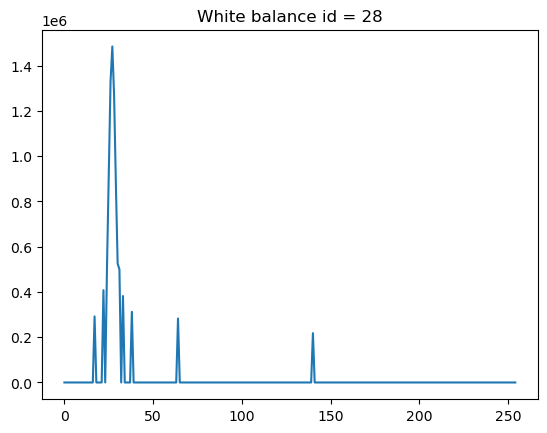

14
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 238 239 240 241 242 243 244 245

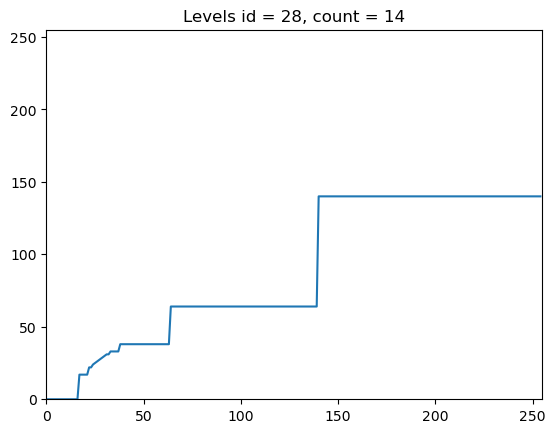

[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0  17
  17  17  17  17  22  22  24  25  26  27  28  29  30  31  31  33  33  33
  33  33  38  38  38  38  38  38  38  38  38  38  38  38  38  38  38  38
  38  38  38  38  38  38  38  38  38  38  64  64  64  64  64  64  64  64
  64  64  64  64  64  64  64  64  64  64  64  64  64  64  64  64  64  64
  64  64  64  64  64  64  64  64  64  64  64  64  64  64  64  64  64  64
  64  64  64  64  64  64  64  64  64  64  64  64  64  64  64  64  64  64
  64  64  64  64  64  64  64  64  64  64  64  64  64  64 140 140 140 140
 140 140 140 140 140 140 140 140 140 140 140 140 140 140 140 140 140 140
 140 140 140 140 140 140 140 140 140 140 140 140 140 140 140 140 140 140
 140 140 140 140 140 140 140 140 140 140 140 140 140 140 140 140 140 140
 140 140 140 140 140 140 140 140 140 140 140 140 140 140 140 140 140 140
 140 140 140 140 140 140 140 140 140 140 140 140 140 140 140 140 140 140
 140 140 140 140 140 140 140 140 140 140 140 140 14

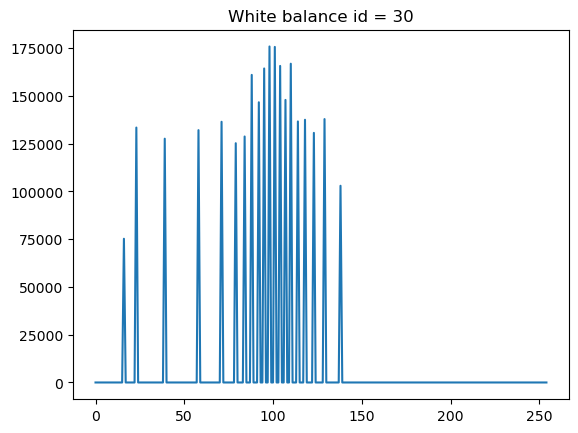

20
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 238 239 240 241 242 243 244 245

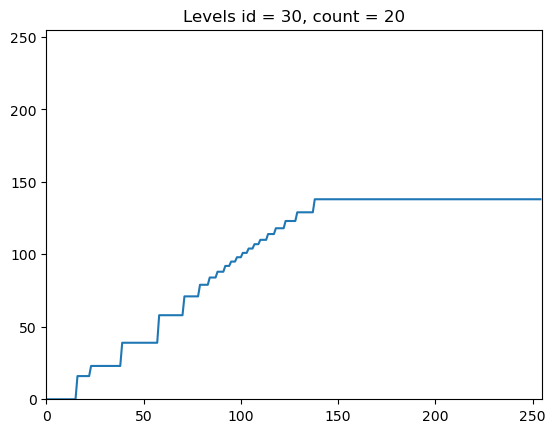

[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0  16  16
  16  16  16  16  16  23  23  23  23  23  23  23  23  23  23  23  23  23
  23  23  23  39  39  39  39  39  39  39  39  39  39  39  39  39  39  39
  39  39  39  39  58  58  58  58  58  58  58  58  58  58  58  58  58  71
  71  71  71  71  71  71  71  79  79  79  79  79  84  84  84  84  88  88
  88  88  92  92  92  95  95  95  98  98  98 101 101 101 104 104 104 107
 107 107 110 110 110 110 114 114 114 114 118 118 118 118 118 123 123 123
 123 123 123 129 129 129 129 129 129 129 129 129 138 138 138 138 138 138
 138 138 138 138 138 138 138 138 138 138 138 138 138 138 138 138 138 138
 138 138 138 138 138 138 138 138 138 138 138 138 138 138 138 138 138 138
 138 138 138 138 138 138 138 138 138 138 138 138 138 138 138 138 138 138
 138 138 138 138 138 138 138 138 138 138 138 138 138 138 138 138 138 138
 138 138 138 138 138 138 138 138 138 138 138 138 138 138 138 138 138 138
 138 138 138 138 138 138 138 138 138 138 138 138 13

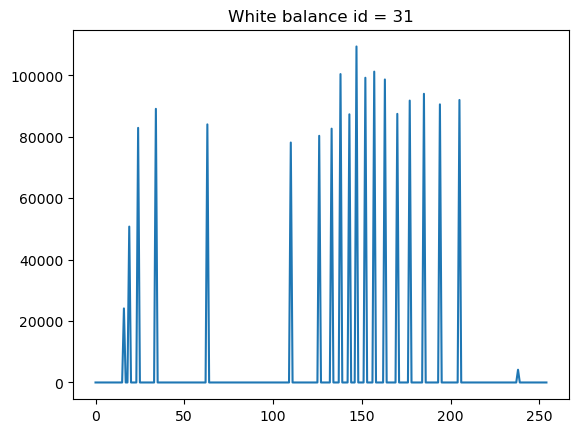

18
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 238 239 240 241 242 243 244 245

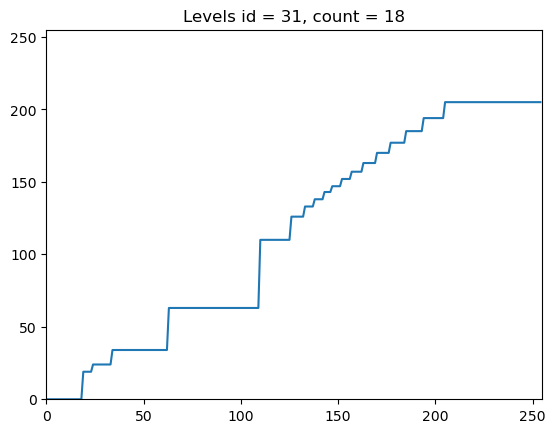

[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0  19  19  19  19  19  24  24  24  24  24  24  24  24  24  24  34  34
  34  34  34  34  34  34  34  34  34  34  34  34  34  34  34  34  34  34
  34  34  34  34  34  34  34  34  34  63  63  63  63  63  63  63  63  63
  63  63  63  63  63  63  63  63  63  63  63  63  63  63  63  63  63  63
  63  63  63  63  63  63  63  63  63  63  63  63  63  63  63  63  63  63
  63  63 110 110 110 110 110 110 110 110 110 110 110 110 110 110 110 110
 126 126 126 126 126 126 126 133 133 133 133 133 138 138 138 138 138 143
 143 143 143 147 147 147 147 147 152 152 152 152 152 157 157 157 157 157
 157 163 163 163 163 163 163 163 170 170 170 170 170 170 170 177 177 177
 177 177 177 177 177 185 185 185 185 185 185 185 185 185 194 194 194 194
 194 194 194 194 194 194 194 205 205 205 205 205 205 205 205 205 205 205
 205 205 205 205 205 205 205 205 205 205 205 205 205 205 205 205 205 205
 205 205 205 205 205 205 205 205 205 205 205 205 20

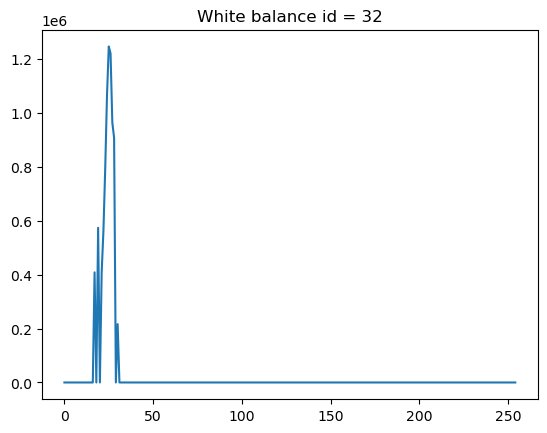

11
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 238 239 240 241 242 243 244 245

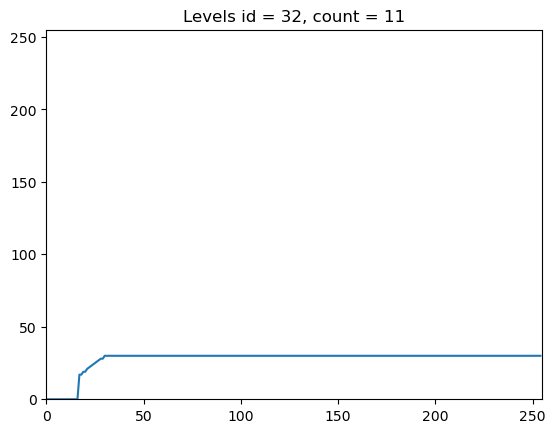

[ 0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0  0 17 17 19 19 21 22 23
 24 25 26 27 28 28 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30
 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30
 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30
 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30
 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30
 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30
 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30
 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30
 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30
 30 30 30 30 30 30 30 30 30 30 30 30 30 30 30]


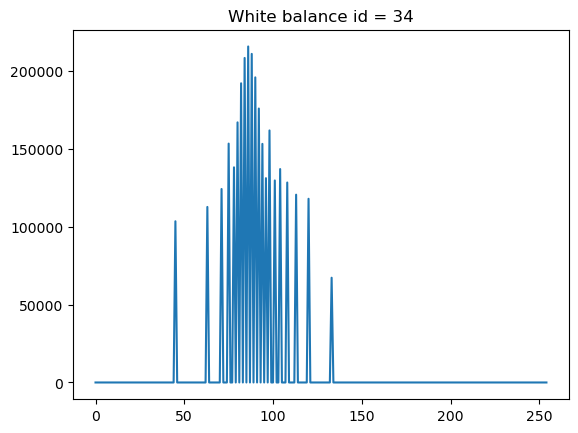

21
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 238 239 240 241 242 243 244 245

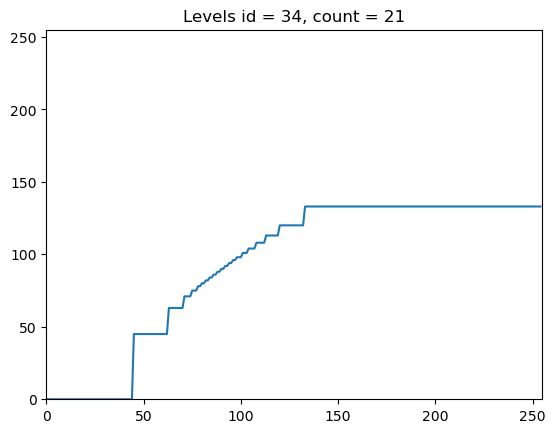

[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0   0   0   0   0  45  45  45  45  45  45  45  45  45
  45  45  45  45  45  45  45  45  45  63  63  63  63  63  63  63  63  71
  71  71  71  75  75  75  78  78  80  80  82  82  84  84  86  86  88  88
  90  90  92  92  94  94  96  96  98  98  98 101 101 101 104 104 104 104
 108 108 108 108 108 113 113 113 113 113 113 113 120 120 120 120 120 120
 120 120 120 120 120 120 120 133 133 133 133 133 133 133 133 133 133 133
 133 133 133 133 133 133 133 133 133 133 133 133 133 133 133 133 133 133
 133 133 133 133 133 133 133 133 133 133 133 133 133 133 133 133 133 133
 133 133 133 133 133 133 133 133 133 133 133 133 133 133 133 133 133 133
 133 133 133 133 133 133 133 133 133 133 133 133 133 133 133 133 133 133
 133 133 133 133 133 133 133 133 133 133 133 133 133 133 133 133 133 133
 133 133 133 133 133 133 133 133 133 133 133 133 13

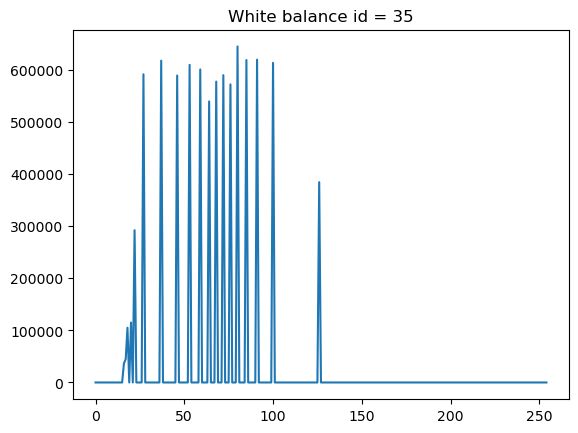

16
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 238 239 240 241 242 243 244 245

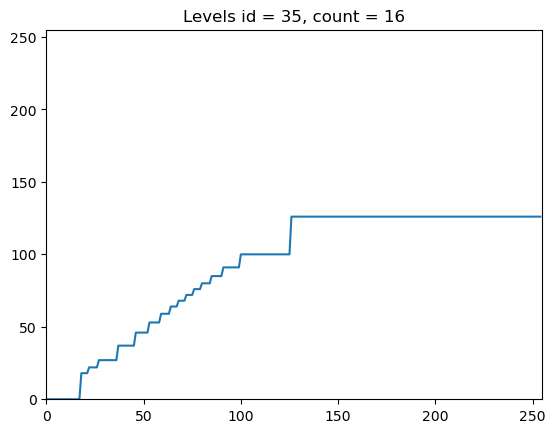

[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
  18  18  18  18  22  22  22  22  22  27  27  27  27  27  27  27  27  27
  27  37  37  37  37  37  37  37  37  37  46  46  46  46  46  46  46  53
  53  53  53  53  53  59  59  59  59  59  64  64  64  64  68  68  68  68
  72  72  72  72  76  76  76  76  80  80  80  80  80  85  85  85  85  85
  85  91  91  91  91  91  91  91  91  91 100 100 100 100 100 100 100 100
 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100 100
 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
 126 126 126 126 126 126 126 126 126 126 126 126 12

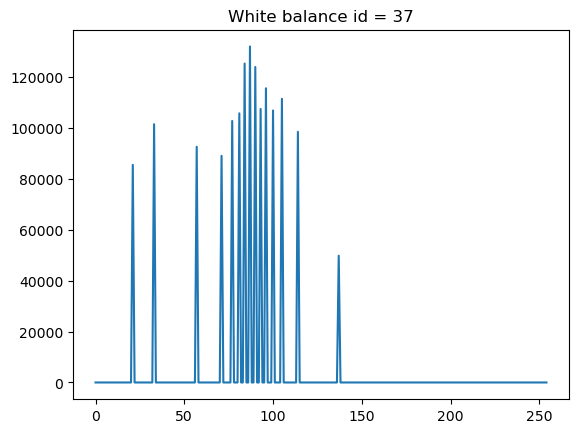

15
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 238 239 240 241 242 243 244 245

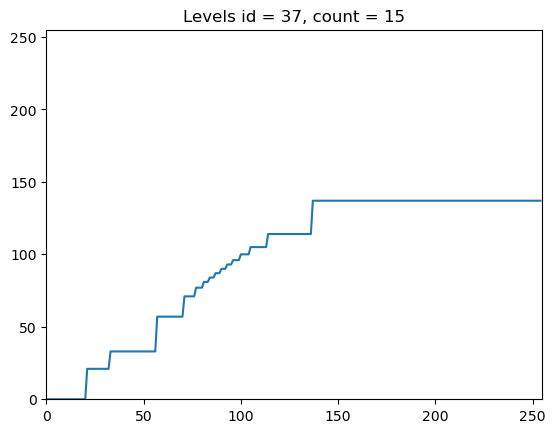

[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0  21  21  21  21  21  21  21  21  21  21  21  21  33  33  33
  33  33  33  33  33  33  33  33  33  33  33  33  33  33  33  33  33  33
  33  33  33  57  57  57  57  57  57  57  57  57  57  57  57  57  57  71
  71  71  71  71  71  77  77  77  77  81  81  81  84  84  84  87  87  87
  90  90  90  93  93  93  96  96  96  96 100 100 100 100 100 105 105 105
 105 105 105 105 105 105 114 114 114 114 114 114 114 114 114 114 114 114
 114 114 114 114 114 114 114 114 114 114 114 137 137 137 137 137 137 137
 137 137 137 137 137 137 137 137 137 137 137 137 137 137 137 137 137 137
 137 137 137 137 137 137 137 137 137 137 137 137 137 137 137 137 137 137
 137 137 137 137 137 137 137 137 137 137 137 137 137 137 137 137 137 137
 137 137 137 137 137 137 137 137 137 137 137 137 137 137 137 137 137 137
 137 137 137 137 137 137 137 137 137 137 137 137 137 137 137 137 137 137
 137 137 137 137 137 137 137 137 137 137 137 137 13

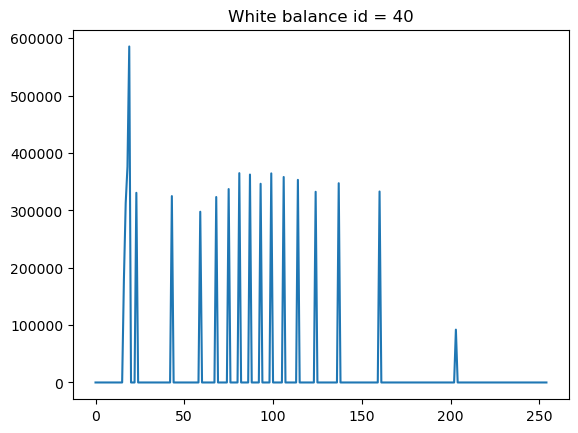

18
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 238 239 240 241 242 243 244 245

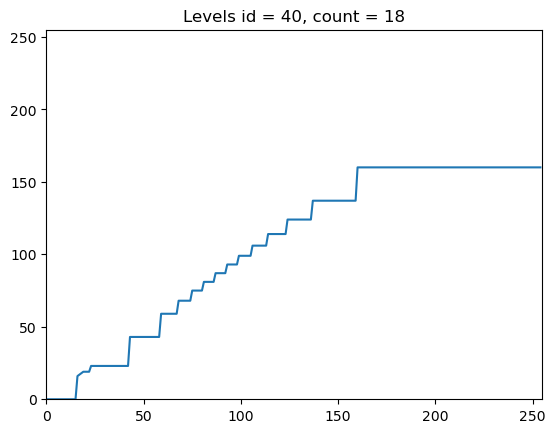

[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0  16  17
  18  19  19  19  19  23  23  23  23  23  23  23  23  23  23  23  23  23
  23  23  23  23  23  23  23  43  43  43  43  43  43  43  43  43  43  43
  43  43  43  43  43  59  59  59  59  59  59  59  59  59  68  68  68  68
  68  68  68  75  75  75  75  75  75  81  81  81  81  81  81  87  87  87
  87  87  87  93  93  93  93  93  93  99  99  99  99  99  99  99 106 106
 106 106 106 106 106 106 114 114 114 114 114 114 114 114 114 114 124 124
 124 124 124 124 124 124 124 124 124 124 124 137 137 137 137 137 137 137
 137 137 137 137 137 137 137 137 137 137 137 137 137 137 137 137 160 160
 160 160 160 160 160 160 160 160 160 160 160 160 160 160 160 160 160 160
 160 160 160 160 160 160 160 160 160 160 160 160 160 160 160 160 160 160
 160 160 160 160 160 160 160 160 160 160 160 160 160 160 160 160 160 160
 160 160 160 160 160 160 160 160 160 160 160 160 160 160 160 160 160 160
 160 160 160 160 160 160 160 160 160 160 160 160 16

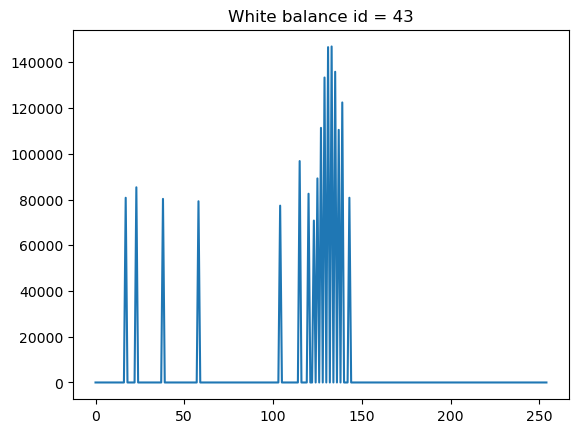

17
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 238 239 240 241 242 243 244 245

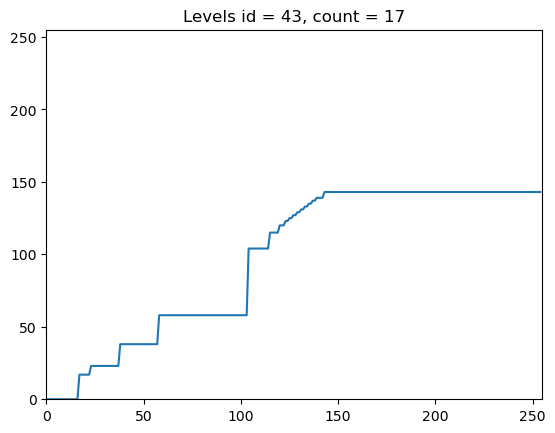

[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0  17
  17  17  17  17  17  23  23  23  23  23  23  23  23  23  23  23  23  23
  23  23  38  38  38  38  38  38  38  38  38  38  38  38  38  38  38  38
  38  38  38  38  58  58  58  58  58  58  58  58  58  58  58  58  58  58
  58  58  58  58  58  58  58  58  58  58  58  58  58  58  58  58  58  58
  58  58  58  58  58  58  58  58  58  58  58  58  58  58 104 104 104 104
 104 104 104 104 104 104 104 115 115 115 115 115 120 120 120 123 123 125
 125 127 127 129 129 131 131 133 133 135 135 137 137 139 139 139 139 143
 143 143 143 143 143 143 143 143 143 143 143 143 143 143 143 143 143 143
 143 143 143 143 143 143 143 143 143 143 143 143 143 143 143 143 143 143
 143 143 143 143 143 143 143 143 143 143 143 143 143 143 143 143 143 143
 143 143 143 143 143 143 143 143 143 143 143 143 143 143 143 143 143 143
 143 143 143 143 143 143 143 143 143 143 143 143 143 143 143 143 143 143
 143 143 143 143 143 143 143 143 143 143 143 143 14

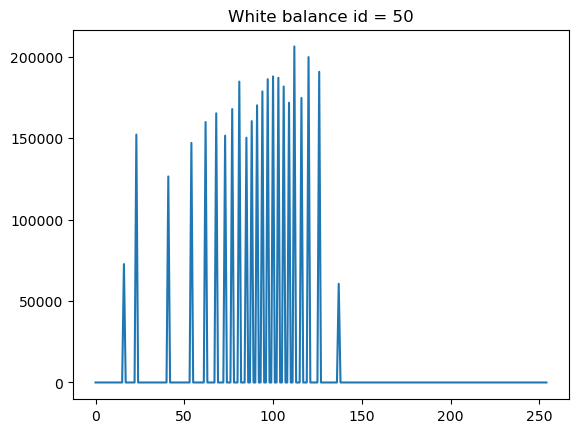

21
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 238 239 240 241 242 243 244 245

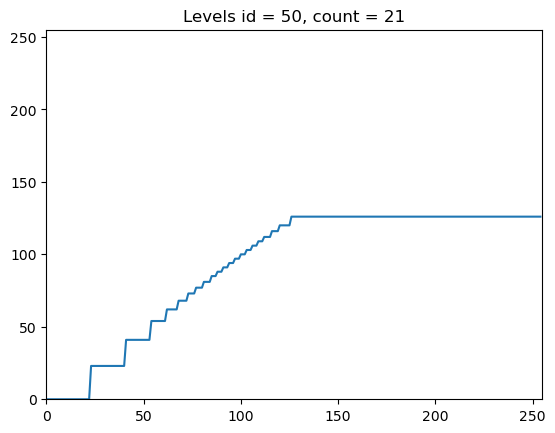

[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0   0   0  23  23  23  23  23  23  23  23  23  23  23  23  23
  23  23  23  23  23  41  41  41  41  41  41  41  41  41  41  41  41  41
  54  54  54  54  54  54  54  54  62  62  62  62  62  62  68  68  68  68
  68  73  73  73  73  77  77  77  77  81  81  81  81  85  85  85  88  88
  88  91  91  91  94  94  94  97  97  97 100 100 100 103 103 103 106 106
 106 109 109 109 112 112 112 112 116 116 116 116 120 120 120 120 120 120
 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126 126
 126 126 126 126 126 126 126 126 126 126 126 126 12

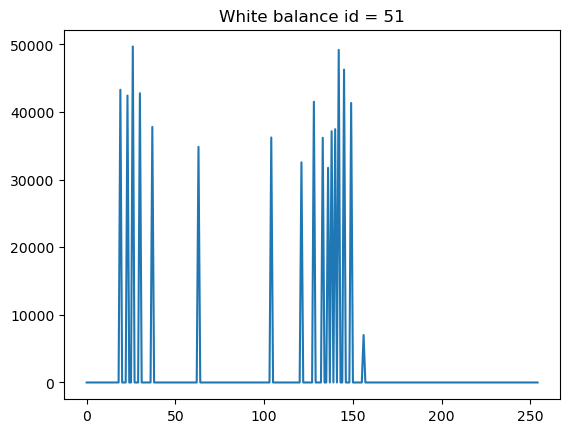

16
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 238 239 240 241 242 243 244 245

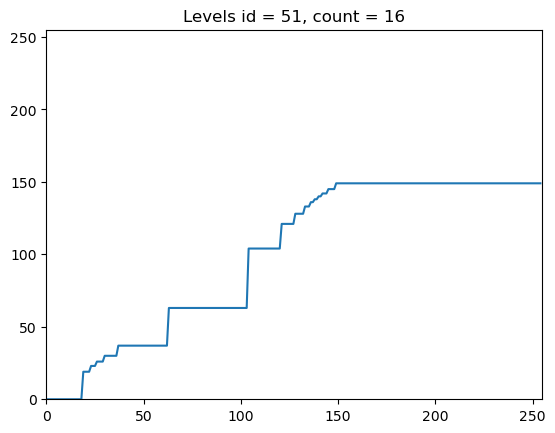

[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0  19  19  19  19  23  23  23  26  26  26  26  30  30  30  30  30  30
  30  37  37  37  37  37  37  37  37  37  37  37  37  37  37  37  37  37
  37  37  37  37  37  37  37  37  37  63  63  63  63  63  63  63  63  63
  63  63  63  63  63  63  63  63  63  63  63  63  63  63  63  63  63  63
  63  63  63  63  63  63  63  63  63  63  63  63  63  63 104 104 104 104
 104 104 104 104 104 104 104 104 104 104 104 104 104 121 121 121 121 121
 121 121 128 128 128 128 128 133 133 133 136 136 138 138 140 140 142 142
 142 145 145 145 145 149 149 149 149 149 149 149 149 149 149 149 149 149
 149 149 149 149 149 149 149 149 149 149 149 149 149 149 149 149 149 149
 149 149 149 149 149 149 149 149 149 149 149 149 149 149 149 149 149 149
 149 149 149 149 149 149 149 149 149 149 149 149 149 149 149 149 149 149
 149 149 149 149 149 149 149 149 149 149 149 149 149 149 149 149 149 149
 149 149 149 149 149 149 149 149 149 149 149 149 14

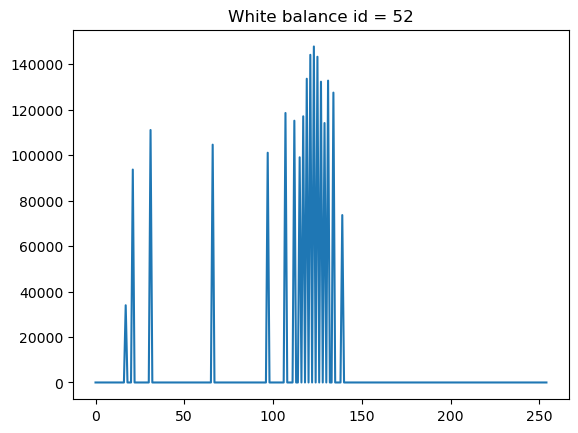

17
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 238 239 240 241 242 243 244 245

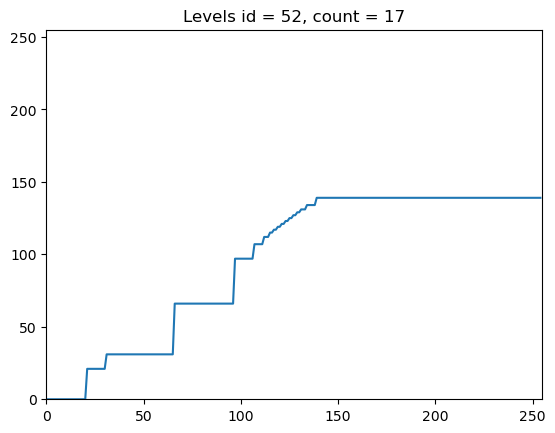

[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0   0   0  21  21  21  21  21  21  21  21  21  21  31  31  31  31  31
  31  31  31  31  31  31  31  31  31  31  31  31  31  31  31  31  31  31
  31  31  31  31  31  31  31  31  31  31  31  31  66  66  66  66  66  66
  66  66  66  66  66  66  66  66  66  66  66  66  66  66  66  66  66  66
  66  66  66  66  66  66  66  97  97  97  97  97  97  97  97  97  97 107
 107 107 107 107 112 112 112 115 115 117 117 119 119 121 121 123 123 125
 125 127 127 129 129 131 131 131 134 134 134 134 134 139 139 139 139 139
 139 139 139 139 139 139 139 139 139 139 139 139 139 139 139 139 139 139
 139 139 139 139 139 139 139 139 139 139 139 139 139 139 139 139 139 139
 139 139 139 139 139 139 139 139 139 139 139 139 139 139 139 139 139 139
 139 139 139 139 139 139 139 139 139 139 139 139 139 139 139 139 139 139
 139 139 139 139 139 139 139 139 139 139 139 139 139 139 139 139 139 139
 139 139 139 139 139 139 139 139 139 139 139 139 13

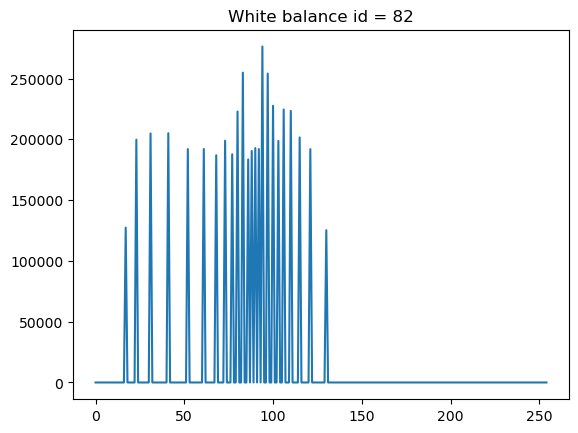

24
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 238 239 240 241 242 243 244 245

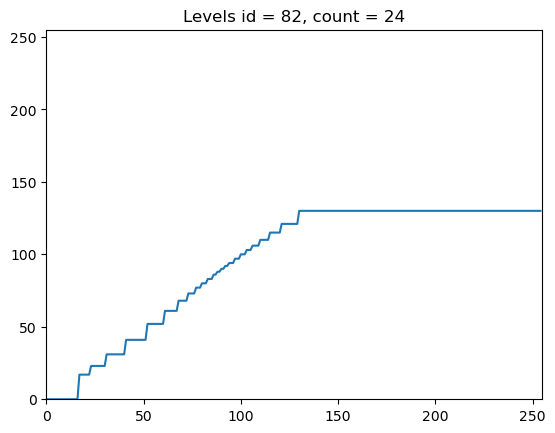

[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0  17
  17  17  17  17  17  23  23  23  23  23  23  23  23  31  31  31  31  31
  31  31  31  31  31  41  41  41  41  41  41  41  41  41  41  41  52  52
  52  52  52  52  52  52  52  61  61  61  61  61  61  61  68  68  68  68
  68  73  73  73  73  77  77  77  80  80  80  83  83  83  86  86  88  88
  90  90  92  92  94  94  94  97  97  97 100 100 100 103 103 103 106 106
 106 106 110 110 110 110 110 115 115 115 115 115 115 121 121 121 121 121
 121 121 121 121 130 130 130 130 130 130 130 130 130 130 130 130 130 130
 130 130 130 130 130 130 130 130 130 130 130 130 130 130 130 130 130 130
 130 130 130 130 130 130 130 130 130 130 130 130 130 130 130 130 130 130
 130 130 130 130 130 130 130 130 130 130 130 130 130 130 130 130 130 130
 130 130 130 130 130 130 130 130 130 130 130 130 130 130 130 130 130 130
 130 130 130 130 130 130 130 130 130 130 130 130 130 130 130 130 130 130
 130 130 130 130 130 130 130 130 130 130 130 130 13

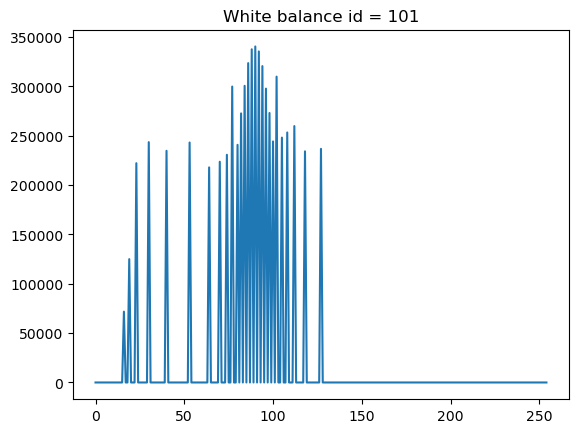

26
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  18  19  20  21  22  23  24  25  26  27  28  29  30  31  32  33  34  35
  36  37  38  39  40  41  42  43  44  45  46  47  48  49  50  51  52  53
  54  55  56  57  58  59  60  61  62  63  64  65  66  67  68  69  70  71
  72  73  74  75  76  77  78  79  80  81  82  83  84  85  86  87  88  89
  90  91  92  93  94  95  96  97  98  99 100 101 102 103 104 105 106 107
 108 109 110 111 112 113 114 115 116 117 118 119 120 121 122 123 124 125
 126 127 128 129 130 131 132 133 134 135 136 137 138 139 140 141 142 143
 144 145 146 147 148 149 150 151 152 153 154 155 156 157 158 159 160 161
 162 163 164 165 166 167 168 169 170 171 172 173 174 175 176 177 178 179
 180 181 182 183 184 185 186 187 188 189 190 191 192 193 194 195 196 197
 198 199 200 201 202 203 204 205 206 207 208 209 210 211 212 213 214 215
 216 217 218 219 220 221 222 223 224 225 226 227 228 229 230 231 232 233
 234 235 236 237 238 239 240 241 242 243 244 245

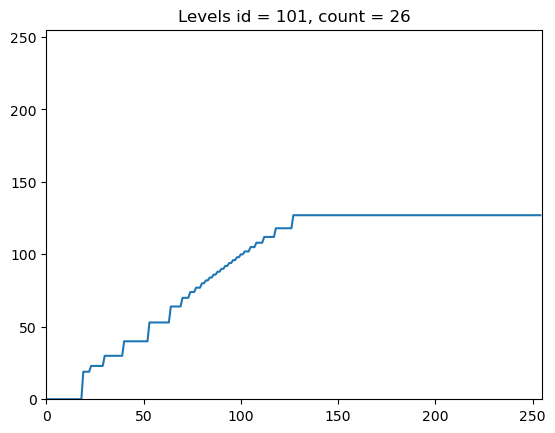

[  0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0   0
   0  19  19  19  19  23  23  23  23  23  23  23  30  30  30  30  30  30
  30  30  30  30  40  40  40  40  40  40  40  40  40  40  40  40  40  53
  53  53  53  53  53  53  53  53  53  53  64  64  64  64  64  64  70  70
  70  70  74  74  74  77  77  77  80  80  82  82  84  84  86  86  88  88
  90  90  92  92  94  94  96  96  98  98 100 100 102 102 102 105 105 105
 108 108 108 108 112 112 112 112 112 112 118 118 118 118 118 118 118 118
 118 127 127 127 127 127 127 127 127 127 127 127 127 127 127 127 127 127
 127 127 127 127 127 127 127 127 127 127 127 127 127 127 127 127 127 127
 127 127 127 127 127 127 127 127 127 127 127 127 127 127 127 127 127 127
 127 127 127 127 127 127 127 127 127 127 127 127 127 127 127 127 127 127
 127 127 127 127 127 127 127 127 127 127 127 127 127 127 127 127 127 127
 127 127 127 127 127 127 127 127 127 127 127 127 127 127 127 127 127 127
 127 127 127 127 127 127 127 127 127 127 127 127 12

In [10]:
# Parallel(n_jobs=-1)(delayed(Rock_grey_level)(my_Rocks[i]) for i in range(len(id_rock)))
for i in range(len(id_rock)): #len(id_rock)
    my_Rocks[i].level_map = np.zeros(255,dtype=int)
    print(Rock_grey_level(my_Rocks[i]))

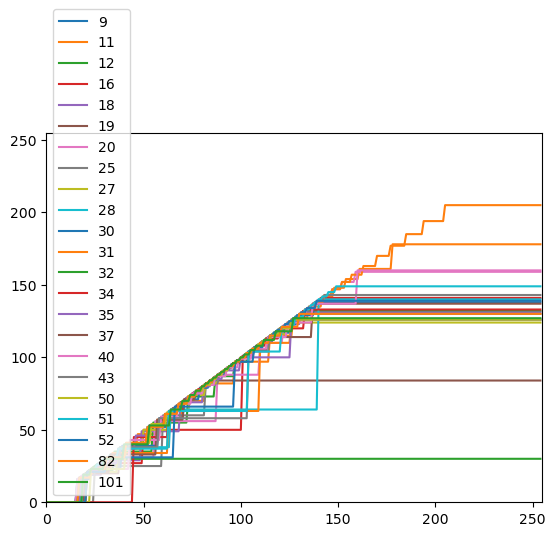

In [12]:
counts = np.zeros(255,dtype=int)

for i in range(255):
    counts[i] = i

for i in range(len(id_rock)): 
    # print(my_Rocks[i].level_map)
    # print(counts)
    plt.plot(counts, my_Rocks[i].level_map, label = str(my_Rocks[i].id))

plt.xlim(0, 255)
plt.ylim(0, 255)
plt.legend()

plt.show()

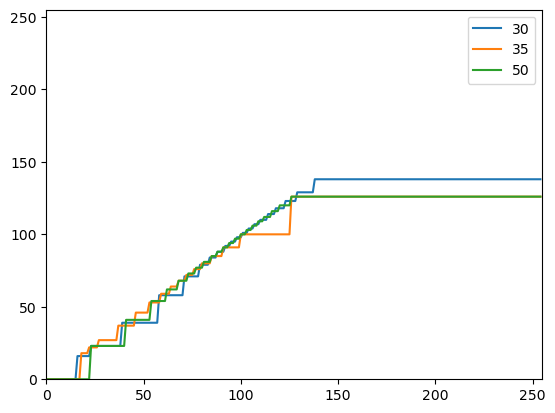

In [16]:
#тип 1
#9, 11, 12, 16, 18, 19, 20, 25, 27, 28, 30, 31, 32, 34, 35, 37, 40, 43, 50, 51, 52, 82, 101
#0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22,  23
counts = np.zeros(255,dtype=int)

for i in range(255):
    counts[i] = i

for i in [10, 14, 18]: 
    # print(my_Rocks[i].level_map)
    # print(counts)
    plt.plot(counts, my_Rocks[i].level_map, label = str(my_Rocks[i].id))

plt.xlim(0, 255)
plt.ylim(0, 255)
plt.legend()

plt.show()

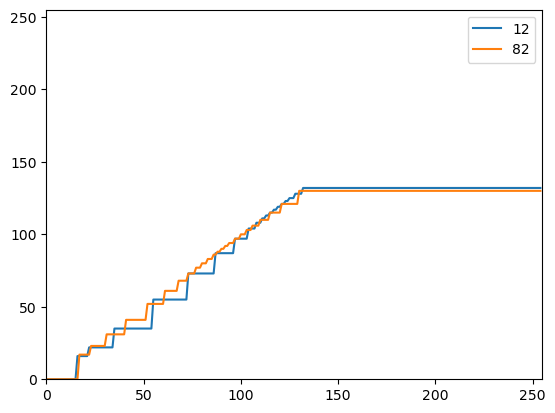

In [19]:
#тип 2
#9, 11, 12, 16, 18, 19, 20, 25, 27, 28, 30, 31, 32, 34, 35, 37, 40, 43, 50, 51, 52, 82, 101
#0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22,  23
counts = np.zeros(255,dtype=int)

for i in range(255):
    counts[i] = i

for i in [2,21]: 
    # print(my_Rocks[i].level_map)
    # print(counts)
    plt.plot(counts, my_Rocks[i].level_map, label = str(my_Rocks[i].id))

plt.xlim(0, 255)
plt.ylim(0, 255)
plt.legend()

plt.show()

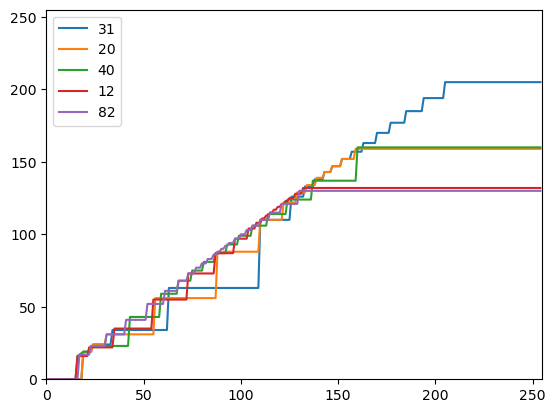

In [20]:
#тип 2, 2-3
#9, 11, 12, 16, 18, 19, 20, 25, 27, 28, 30, 31, 32, 34, 35, 37, 40, 43, 50, 51, 52, 82, 101
#0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22,  23
counts = np.zeros(255,dtype=int)

for i in range(255):
    counts[i] = i

for i in [11,6,16,2,21]: 
    # print(my_Rocks[i].level_map)
    # print(counts)
    plt.plot(counts, my_Rocks[i].level_map, label = str(my_Rocks[i].id))

plt.xlim(0, 255)
plt.ylim(0, 255)
plt.legend()

plt.show()

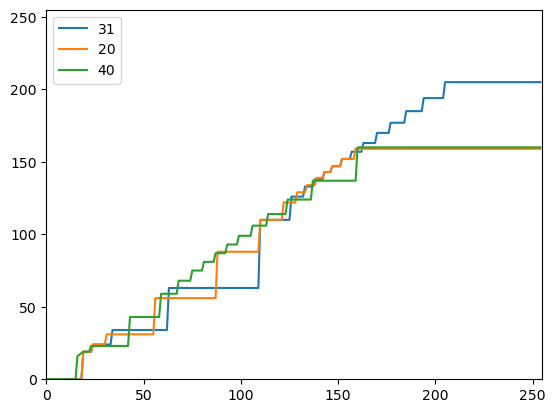

In [21]:
#тип 2-3
#9, 11, 12, 16, 18, 19, 20, 25, 27, 28, 30, 31, 32, 34, 35, 37, 40, 43, 50, 51, 52, 82, 101
#0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22,  23
counts = np.zeros(255,dtype=int)

for i in range(255):
    counts[i] = i

for i in [11,6,16]: 
    # print(my_Rocks[i].level_map)
    # print(counts)
    plt.plot(counts, my_Rocks[i].level_map, label = str(my_Rocks[i].id))

plt.xlim(0, 255)
plt.ylim(0, 255)
plt.legend()

plt.show()

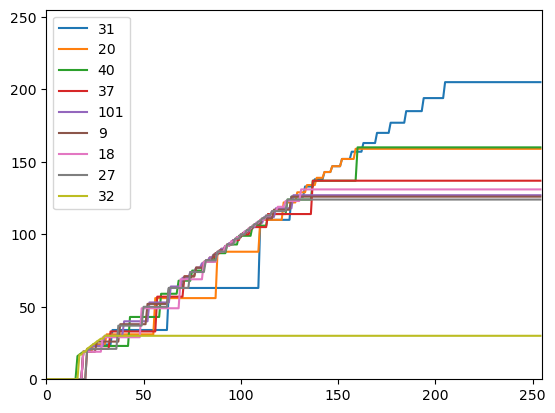

In [22]:
#тип 2-3, 3
#9, 11, 12, 16, 18, 19, 20, 25, 27, 28, 30, 31, 32, 34, 35, 37, 40, 43, 50, 51, 52, 82, 101
#0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22,  23
counts = np.zeros(255,dtype=int)

for i in range(255):
    counts[i] = i

for i in [11,6,16,15,22,0,4,8,12]: 
    # print(my_Rocks[i].level_map)
    # print(counts)
    plt.plot(counts, my_Rocks[i].level_map, label = str(my_Rocks[i].id))

plt.xlim(0, 255)
plt.ylim(0, 255)
plt.legend()

plt.show()

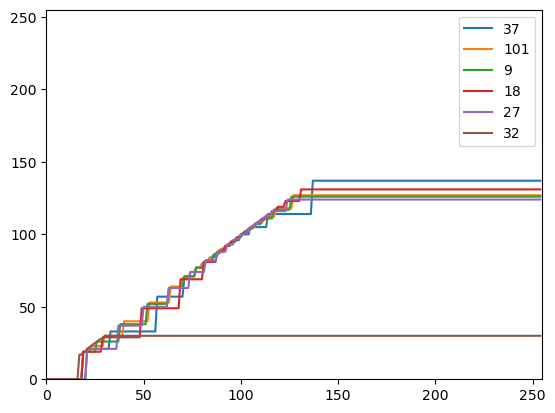

In [23]:
#тип 3
#9, 11, 12, 16, 18, 19, 20, 25, 27, 28, 30, 31, 32, 34, 35, 37, 40, 43, 50, 51, 52, 82, 101
#0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22,  23
counts = np.zeros(255,dtype=int)

for i in range(255):
    counts[i] = i

for i in [15,22,0,4,8,12]: 
    # print(my_Rocks[i].level_map)
    # print(counts)
    plt.plot(counts, my_Rocks[i].level_map, label = str(my_Rocks[i].id))

plt.xlim(0, 255)
plt.ylim(0, 255)
plt.legend()

plt.show()

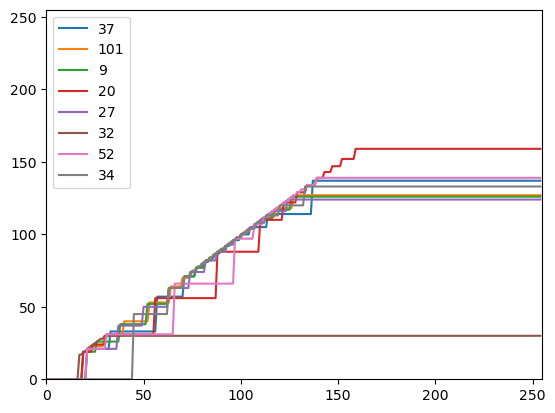

In [24]:
#тип 3, 3-4
#9, 11, 12, 16, 18, 19, 20, 25, 27, 28, 30, 31, 32, 34, 35, 37, 40, 43, 50, 51, 52, 82, 101
#0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22,  23
counts = np.zeros(255,dtype=int)

for i in range(255):
    counts[i] = i

for i in [15,22,0,6,8,12,20,13]: 
    # print(my_Rocks[i].level_map)
    # print(counts)
    plt.plot(counts, my_Rocks[i].level_map, label = str(my_Rocks[i].id))

plt.xlim(0, 255)
plt.ylim(0, 255)
plt.legend()

plt.show()

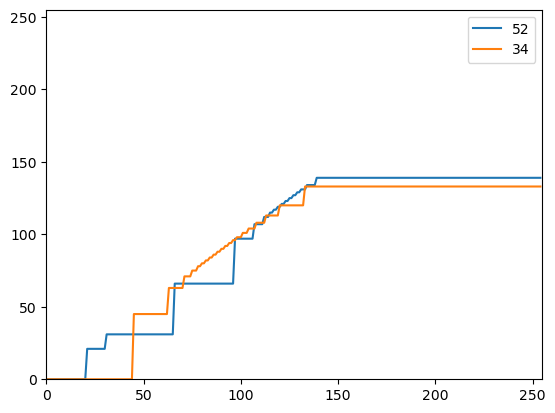

In [25]:
#тип 3-4
#9, 11, 12, 16, 18, 19, 20, 25, 27, 28, 30, 31, 32, 34, 35, 37, 40, 43, 50, 51, 52, 82, 101
#0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22,  23
counts = np.zeros(255,dtype=int)

for i in range(255):
    counts[i] = i

for i in [20,13]: 
    # print(my_Rocks[i].level_map)
    # print(counts)
    plt.plot(counts, my_Rocks[i].level_map, label = str(my_Rocks[i].id))

plt.xlim(0, 255)
plt.ylim(0, 255)
plt.legend()

plt.show()

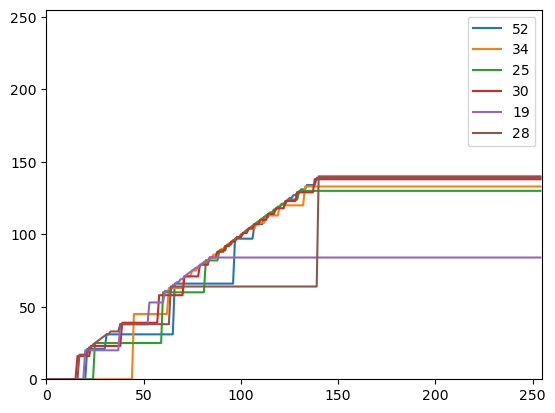

In [26]:
#тип 3-4, 4
#9, 11, 12, 16, 18, 19, 20, 25, 27, 28, 30, 31, 32, 34, 35, 37, 40, 43, 50, 51, 52, 82, 101
#0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22,  23
counts = np.zeros(255,dtype=int)

for i in range(255):
    counts[i] = i

for i in [20,13,7,10,5,9]: 
    # print(my_Rocks[i].level_map)
    # print(counts)
    plt.plot(counts, my_Rocks[i].level_map, label = str(my_Rocks[i].id))

plt.xlim(0, 255)
plt.ylim(0, 255)
plt.legend()

plt.show()

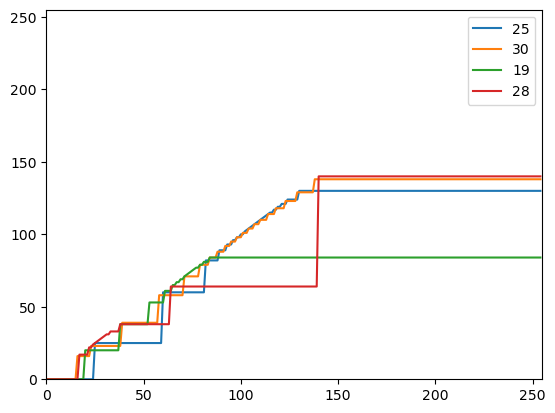

In [27]:
#тип 4
#9, 11, 12, 16, 18, 19, 20, 25, 27, 28, 30, 31, 32, 34, 35, 37, 40, 43, 50, 51, 52, 82, 101
#0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22,  23
counts = np.zeros(255,dtype=int)

for i in range(255):
    counts[i] = i

for i in [7,10,5,9]: 
    # print(my_Rocks[i].level_map)
    # print(counts)
    plt.plot(counts, my_Rocks[i].level_map, label = str(my_Rocks[i].id))

plt.xlim(0, 255)
plt.ylim(0, 255)
plt.legend()

plt.show()

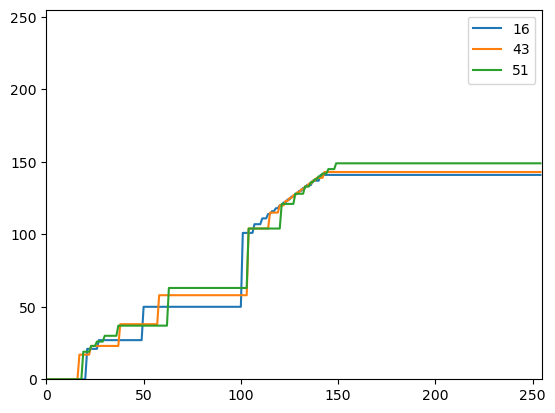

In [28]:
#тип 5
#9, 11, 12, 16, 18, 19, 20, 25, 27, 28, 30, 31, 32, 34, 35, 37, 40, 43, 50, 51, 52, 82, 101
#0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22,  23
counts = np.zeros(255,dtype=int)

for i in range(255):
    counts[i] = i

for i in [3,17,19]: 
    # print(my_Rocks[i].level_map)
    # print(counts)
    plt.plot(counts, my_Rocks[i].level_map, label = str(my_Rocks[i].id))

plt.xlim(0, 255)
plt.ylim(0, 255)
plt.legend()

plt.show()

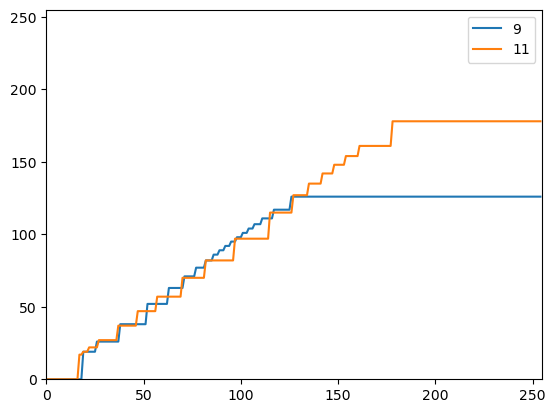

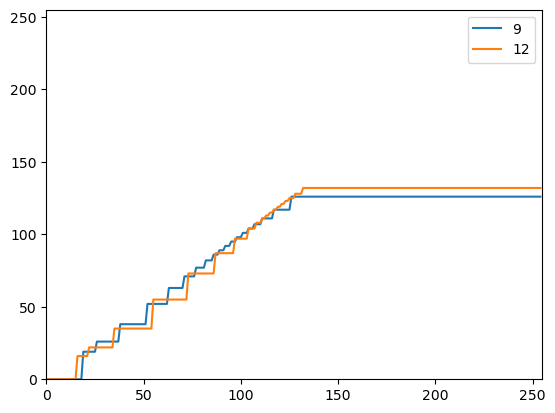

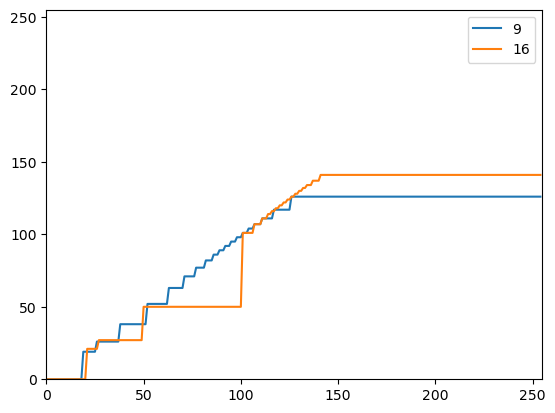

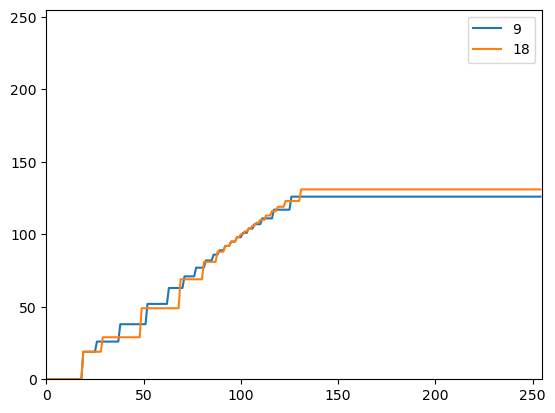

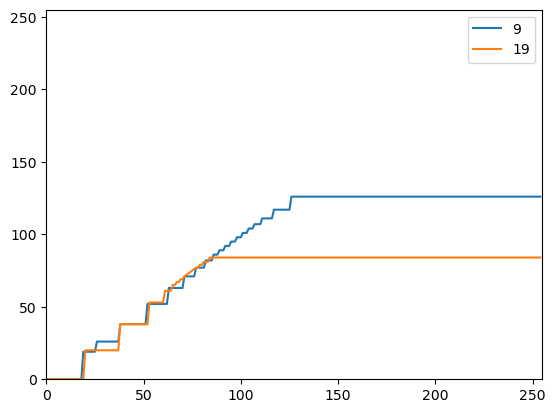

...

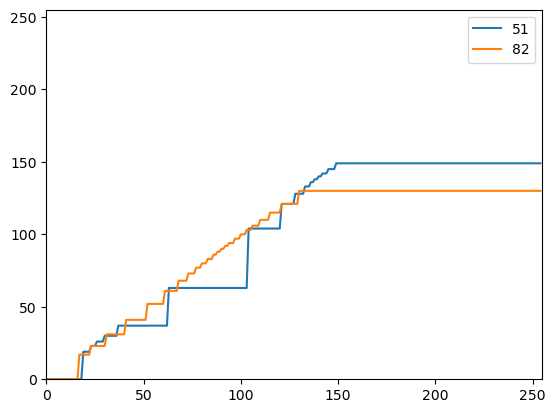

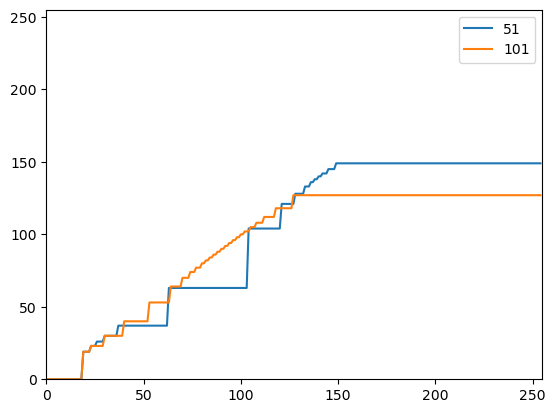

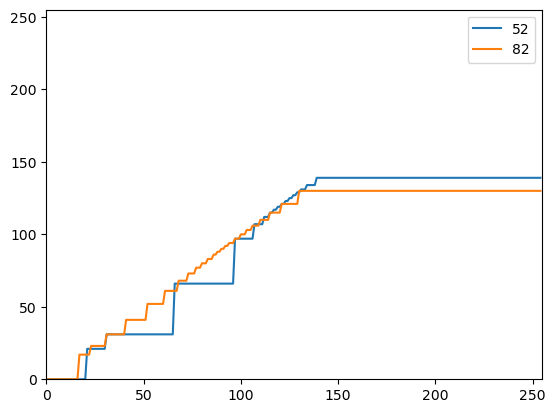

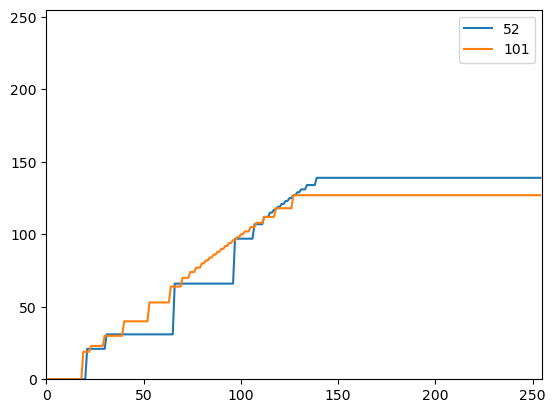

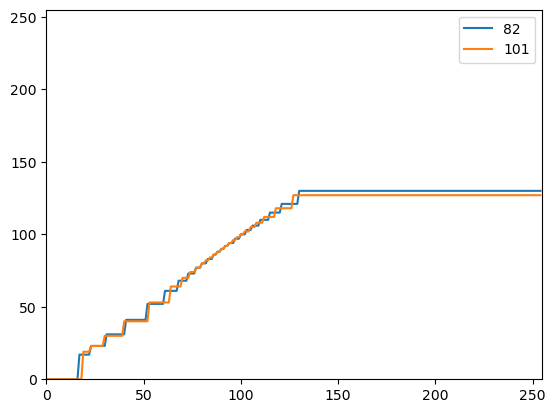

In [31]:
#попарное сравнение
#9, 11, 12, 16, 18, 19, 20, 25, 27, 28, 30, 31, 32, 34, 35, 37, 40, 43, 50, 51, 52, 82, 101
#0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22,  23
counts = np.zeros(255,dtype=int)

for i in range(255):
    counts[i] = i

mass = [0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22]

for i in mass: 
    for j in mass:
        if i < j:
            plt.plot(counts, my_Rocks[i].level_map, label = str(my_Rocks[i].id))
            plt.plot(counts, my_Rocks[j].level_map, label = str(my_Rocks[j].id))
            plt.xlim(0, 255)
            plt.ylim(0, 255)
            plt.legend()
            plt.savefig('comparison ' + str(my_Rocks[i].id) + '-' + str(my_Rocks[j].id) + '.png')
            plt.show()




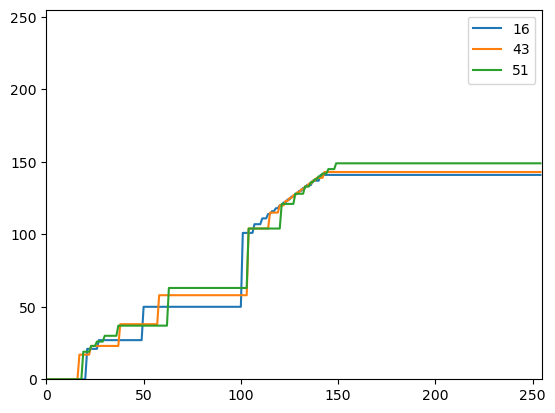

In [33]:
#9, 11, 12, 16, 18, 19, 20, 25, 27, 28, 30, 31, 32, 34, 35, 37, 40, 43, 50, 51, 52, 82, 101
#0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22,  23
counts = np.zeros(255,dtype=int)

for i in range(255):
    counts[i] = i

for i in [3,17,19]: 
    # print(my_Rocks[i].level_map)
    # print(counts)
    plt.plot(counts, my_Rocks[i].level_map, label = str(my_Rocks[i].id))

plt.xlim(0, 255)
plt.ylim(0, 255)
plt.legend()

plt.show()